<a href="https://colab.research.google.com/github/EliaBronzo/Protein_functionality_prediction/blob/main/Protein.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Protein sequences

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import csv
import os
from numba import jit
from joblib import Parallel, delayed
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from matplotlib.pyplot import figure
from sklearn.cluster import DBSCAN
!pip install kneed
from kneed import KneeLocator
from google.colab import drive
import matplotlib.patches as mpatches

In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MSA_nat_with_annotation.faa
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MSA_art.faa

--2024-02-05 18:13:44--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MSA_nat_with_annotation.faa
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 146500 (143K) [text/plain]
Saving to: ‘MSA_nat_with_annotation.faa.1’

MSA_nat_with_annota 100%[===================>] 143.07K  --.-KB/s    in 0.009s  

2024-02-05 18:13:44 (16.3 MB/s) - ‘MSA_nat_with_annotation.faa.1’ saved [146500/146500]

--2024-02-05 18:13:44--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MSA_art.faa
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected

## Data

In [ ]:
def read_data(data1):
  f = open(data1, "r")
  sequences=[]
  deflines=[]
  morelines = True
  while morelines:
    seq=""
    moreseq = True
    while moreseq:
        nxtline = f.readline()
        if not nxtline:
            morelines = False
            break
        elif nxtline[0] != ">":
            seq+=nxtline.strip()
        else:
            deflines.append(nxtline.strip())
            moreseq = False
    sequences.append(seq)
  sequences=np.array(sequences[1:])
  deflines=np.array(deflines)
  return sequences, deflines

In [ ]:
sequences_art, deflines_art = read_data("MSA_art.faa")
sequences_nat, deflines_nat = read_data("MSA_nat_with_annotation.faa")

In [ ]:
def one_hot_encode(seq):
    mapping = dict(zip("ACDEFGHIKLMNPQRSTVWY-", range(21)))
    seq2 = [mapping[i] for i in seq]
    seq2 = np.eye(21)[seq2]
    return seq2.T[:-1].T

def seq_to_data(sequences, deflines):
  X=[]
  Y=[]
  for i in range(len(deflines)):
    X.append(one_hot_encode(sequences[i]).flatten())
    if deflines[i][-2] == 'u':
      Y.append(1)
    else:
      Y.append(0)
  X=np.array(X)
  Y=np.array(Y)
  return X, Y
X,Y=seq_to_data(sequences_nat, deflines_nat)
X_art, Y_art=seq_to_data(sequences_art, deflines_art)
N=len(X)
X_tot = np.vstack((X,X_art))
Y_tot = np.hstack((Y,Y_art))
X.shape, X_tot.shape

((1130, 1920), (2133, 1920))

## PCA and tSNE

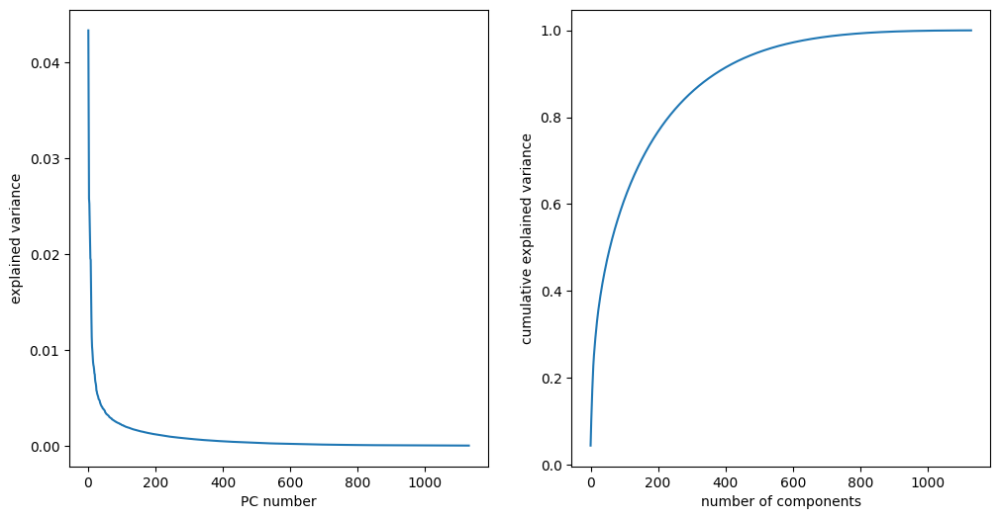

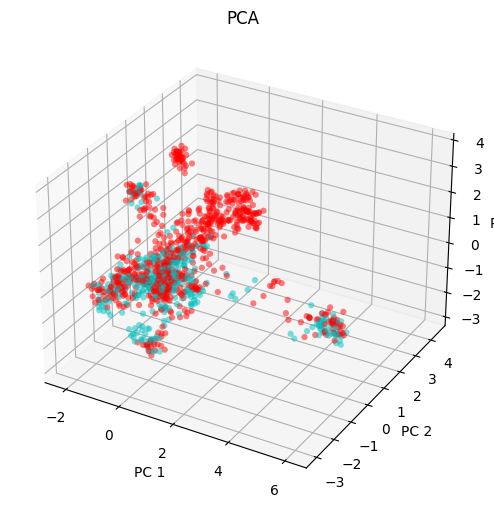

In [ ]:
from sklearn.decomposition import PCA

fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2,
                                    figsize=(12, 6))

pca = PCA().fit(X)

variances=pca.explained_variance_ratio_
ax0.plot(range(1,len(variances )+1),variances )
ax0.set_xlabel('PC number')
ax0.set_ylabel('explained variance');


ax1.plot(np.cumsum(pca.explained_variance_ratio_))  #cumulative sum
ax1.set_xlabel('number of components')
ax1.set_ylabel('cumulative explained variance');
plt.show()

colors = ListedColormap(['r','c'])
Xproj = pca.fit_transform(X)

plt.figure(figsize=(6,10))
ax2 = plt.axes(projection='3d')
ax2.scatter3D(Xproj[:, 0], Xproj[:,1], Xproj[:, 2], c=Y, edgecolor='none', alpha=0.5,
            cmap=colors)
ax2.set_xlabel('PC 1')
ax2.set_ylabel('PC 2')
ax2.set_zlabel('PC 3')
plt.title('PCA')
plt.savefig('3dpca.png')

In [ ]:
np.sum(pca.explained_variance_ratio_[0:3])

0.10217976124271269

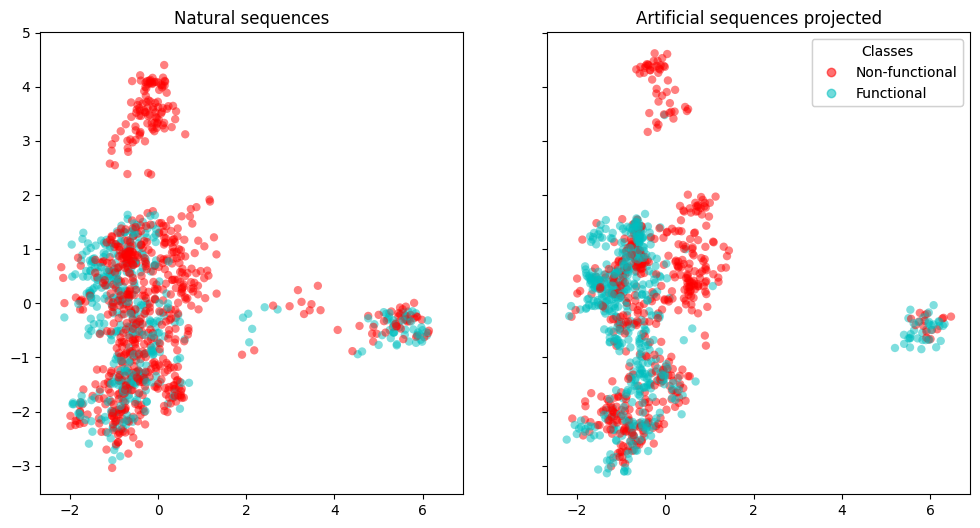

In [ ]:
fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, sharex=True, sharey=True,figsize=(12, 6))

Xproj_tot = pca.transform(X_tot)

ax0.scatter(Xproj_tot[0:1130, 0], Xproj_tot[0:1130, 1], c=Y, edgecolor='none', alpha=0.5,
            cmap=colors)
ax0.set_title('Natural sequences')

scatter=ax1.scatter(Xproj_tot[1130:, 0], Xproj_tot[1130:, 1], c=Y_art, edgecolor='none', cmap=colors, alpha=0.5)
legend1 = ax1.legend(handles=scatter.legend_elements()[0],labels=['Non-functional','Functional'],
                    loc="upper right", title="Classes")
ax1.add_artist(legend1)
ax1.set_title('Artificial sequences projected')
plt.savefig("nat_art_PCA.png")
plt.show()

It can be noticed that $$rk(X^T X)=N$$

Text(0.5, 1.0, 'Perplexity 90')

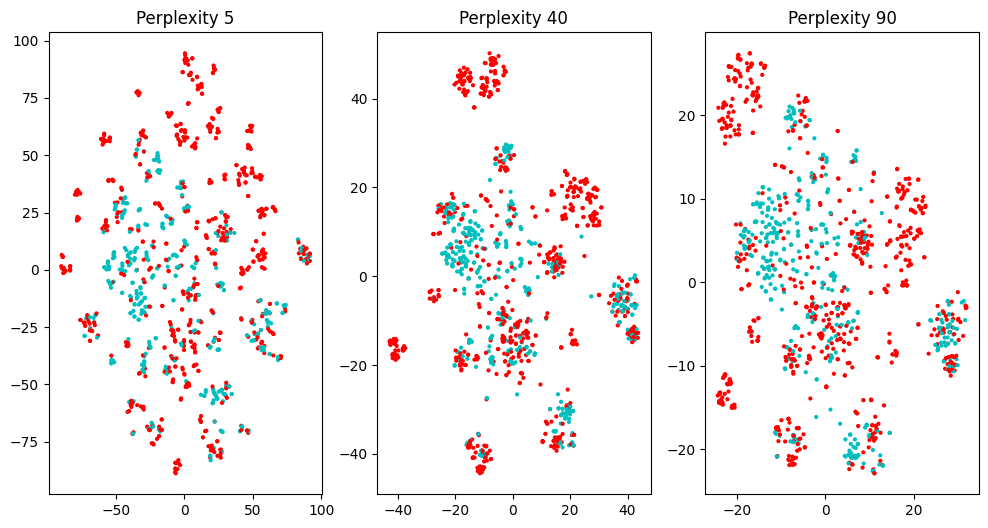

In [ ]:
from sklearn.manifold import TSNE

fig, (ax0, ax1, ax2) = plt.subplots(nrows=1, ncols=3, figsize=(12, 6))

tsne=TSNE(n_components=2, perplexity=5);
X_embedded=tsne.fit_transform(X);
ax0.scatter(X_embedded[:,0], X_embedded[:,1], c=Y, s=4, cmap=colors)
ax0.set_title('Perplexity 5')

tsne=TSNE(n_components=2, perplexity=40);
X_embedded=tsne.fit_transform(X);
ax1.scatter(X_embedded[:,0], X_embedded[:,1], c=Y, s=4, cmap=colors)
ax1.set_title('Perplexity 40')

tsne=TSNE(n_components=2, perplexity=90);
X_embedded=tsne.fit_transform(X);
ax2.scatter(X_embedded[:,0], X_embedded[:,1], c=Y, s=4, cmap=colors)
ax2.set_title('Perplexity 90')

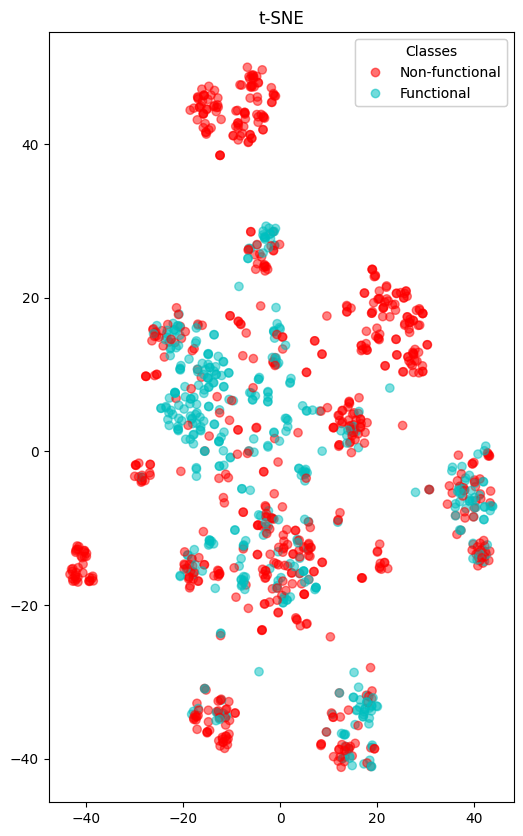

In [ ]:
tsne=TSNE(n_components=2, perplexity=40);
X_embedded=tsne.fit_transform(X);

fig, ax1 = plt.subplots(figsize=(6, 10))
scatter = ax1.scatter(X_embedded[:, 0], X_embedded[:, 1], c=Y, cmap=colors, alpha=0.5)
legend1 = ax1.legend(handles=scatter.legend_elements()[0], labels=['Non-functional', 'Functional'],
                     loc="upper right", title="Classes")
ax1.add_artist(legend1)
ax1.set_title('t-SNE')
fig.savefig('tsne.png')
plt.show()

# Making sense of one-hot encoding

The main idea of this section is to get information about the data without forcing the structure induced by the one-hot encoding.

We focused on the fact that given two sequences it is not hard to compute a distance between them. The idea is to deduce an embedding and visualise the data only using this kind of information.

## Edit distance calculation

The idea would be to introduce a distance that represent the number of mutations needed to go from one to the other. We allow for deletion, insertion and substitution.
 We hereby introduce a recursive algorithm to compute edit distance and apply it on the pure sequences of aminoacids (i.e. removing the '-').


In order to make the results more easy to compare with those we obtained from the previous calculations, we will consider the edit distance to be the squared norm (indeed the euclidean distance for the one-hot encoded proteins can be connected to the square root of the humming distance).


NOTICE: we did not optimise this part of the code, hence it takes quite some time to run it. In the next part we charge the results we saved in a github repository.

In [ ]:
def R(s,t):
    if len(s)==0:
      return len(t)
    if len(t)==0:
      return len(s)
    if (s,t) in diz:
      return diz[(s,t)]
    A=min(R(s[:-1], t) + 1, R(s, t[:-1]) + 1, R(s[:-1],t[:-1]) + (s[-1] != t[-1]))
    diz.update({(s,t):A})
    return A

def edit_distance(s,t):
  global diz
  diz = dict({})
  R(s,t)
  return diz[(s,t)]


def true_seq(seq):
  sequences_notr = list()
  for i in range(len(seq)):
    sequences_notr.append(seq[i].replace('-',''))
  return sequences_notr

In [ ]:
#sequences_t=true_seq(sequences)

#diz = dict({})
#dist=np.zeros([len(X),len(X)])
#for i in range(len(X)):
#  for j in range(i+1,len(X)):
#    A=edit_distance(sequences_t[i],sequences_t[j])
#    dist[i,j] = A
#    dist[j,i] = A

In [ ]:
#output='out1.csv'
#for i in range(N):
#  for j in range(N):
#    print(dist[i,j],file=open(output, 'a'))

## Edit distance and ISOMAP

In [ ]:
!wget https://raw.githubusercontent.com/Wraithmat/Computational_project/main/dist_nat_notr.csv
!wget https://raw.githubusercontent.com/Wraithmat/Computational_project/main/dist_art_to_nat.csv

--2024-02-05 17:42:08--  https://raw.githubusercontent.com/Wraithmat/Computational_project/main/dist_nat_notr.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6383346 (6.1M) [text/plain]
Saving to: ‘dist_nat_notr.csv’

dist_nat_notr.csv   100%[===================>]   6.09M  --.-KB/s    in 0.04s   

2024-02-05 17:42:09 (168 MB/s) - ‘dist_nat_notr.csv’ saved [6383346/6383346]

--2024-02-05 17:42:09--  https://raw.githubusercontent.com/Wraithmat/Computational_project/main/dist_art_to_nat.csv
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK

In [ ]:
dist=np.array(([float(x[:-1]) for x in open("dist_nat_notr.csv").readlines()]))
dist=dist.reshape((N,N))

We follow the procedure in [1].

We start with double centering in two equivalent ways.

<ipython-input-16-175dd4c9e76f>:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap=plt.cm.get_cmap('nipy_spectral', 2))


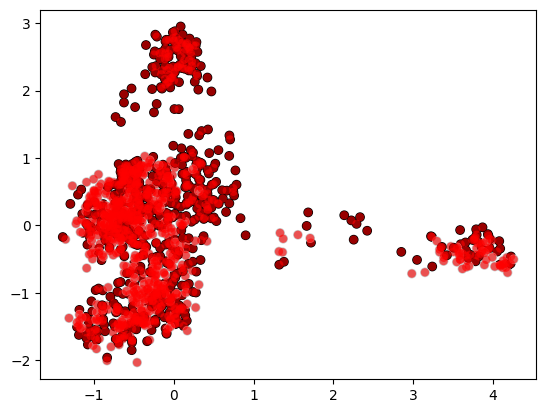

In [ ]:
#1. Through matrix multiplication
G2=-1/2*(np.eye(N)-1/N*np.ones([N,N]))@dist@(np.eye(N)-1/N*np.ones([N,N]))
w, v = np.linalg.eig(G2)

proj = np.diag(np.sqrt(w[:263])) @ v.T[:263]
plt.scatter(proj[0],proj[1], c=Y,
            cmap=plt.cm.get_cmap('nipy_spectral', 2))


#2. Computation entry by entry
G=-0.5*dist-0.5/(N)**2*np.sum(dist)
for i in range(N):
    for j in range(N):
        G[i,j]+=1/N*(np.sum(dist[i,:])+np.sum(dist[:,j]))/2
w, v = np.linalg.eig(G)

proj = np.diag(np.sqrt(w[:3])) @ v.T[:3]
plt.scatter(proj[0],proj[1],c='r', edgecolor='none', alpha=0.6)

Indeed we can also check that the two matrices are approximately the same.

In [ ]:
np.allclose(G, G2)

True

It is computationally much faster to use the matrix multiplication form, but we will see later that, because of numerical rounding, it will be easier to use G later on.
We can also check that all the information stored in the distances can be retrieved from the projected vectors, in particular we can compute for some exemples:

In [ ]:
from scipy.linalg import eig

w, v = eig(G)
proj = np.diag(np.sqrt(w[:])) @ v.T[:]

In [ ]:
# We do a comparison of the distances (squared) of 10 random sequences. "True" is printed when the distance computed from the projection and the true one are 'numerically equal'
@jit(fastmath=True)
def emb_dist(i, j,proj=proj.T):
  A = np.dot(proj[i],proj[i])+np.dot(proj[j],proj[j])-2*np.dot(proj[i],proj[j])
  return A

for k in range(10):
  i=np.random.randint(0,1130)
  j=np.random.randint(0,1130)
  print(np.isclose(emb_dist(i,j), dist[i,j]))

<ipython-input-19-22652888702b>:2: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @jit(fastmath=True)


True
True
True
True
True
True
True
True
True
True


<ipython-input-19-22652888702b>:4: NumbaPerformanceWarning: np.dot() is faster on contiguous arrays, called on (Array(complex128, 1, 'A', False, aligned=True), Array(complex128, 1, 'A', False, aligned=True))
  A = np.dot(proj[i],proj[i])+np.dot(proj[j],proj[j])-2*np.dot(proj[i],proj[j])


Now a comparison between one hot encoding and this one could be done with information imbalance (by LAIO) (Oss: also we could check that distances in one hot encoding and with edit distance are comparable. Supposedly it should be that $OneHot \iff Humming$, so they should be different, but I think sequences might have been pre-processed in order to get the same result i.e. they added --- to make comparisons)

Let's write the projector:

In [ ]:
from scipy.linalg import solve
from scipy.linalg import inv

#1. using the inversion of the matrix
def transform(projector, delta_r, G, norm=0):
  L=np.shape(projector)[0]
  G_inv=inv(G+norm*np.eye(L))
  #Z_vec=np.array([np.sum(projector.T[i]**2) for i in range(L)])
  Z_vec=np.array([np.dot(proj.T[i],proj.T[i]) for i in range(L)])
  alpha=np.ones(L).T@G_inv@np.ones(L)
  beta=-4+(-delta_r+Z_vec).T@G_inv@np.ones(L)+np.ones(L).T@G_inv@(-delta_r+Z_vec)
  gamma=delta_r.T@G_inv@delta_r+Z_vec.T@G_inv@Z_vec-delta_r.T@G_inv@Z_vec-Z_vec.T@G_inv@delta_r

  a=(-beta+np.sqrt(beta**2-4*alpha*gamma))/(2*alpha)
  a2=(-beta-np.sqrt(beta**2-4*alpha*gamma))/(2*alpha)
  z_r=-0.5*inv(projector.T)@(delta_r-Z_vec-a*np.ones(L))
  z_r2=-0.5*inv(projector.T)@(delta_r-Z_vec-a2*np.ones(L))
  return z_r, z_r2

#2. without inverting directly the matrix, but solving a linear problem, it should be used if accuracy is needed and it's faster for single element transformation
def transform2(projector, delta_r, G):
  L=np.shape(projector)[0]
  Z_vec=np.array([np.dot(proj.T[i],proj.T[i]) for i in range(L)])
  G_m1=solve(G,np.ones(L))
  G_m2=solve(G,-delta_r+Z_vec)
  alpha=np.ones(L).T@G_m1
  beta=-4+(-delta_r+Z_vec).T@G_m1+np.ones(L).T@G_m2
  gamma=-delta_r.T@G_m2+Z_vec.T@G_m2

  a=(-beta+np.sqrt(beta**2-4*alpha*gamma))/(2*alpha)
  a2=(-beta-np.sqrt(beta**2-4*alpha*gamma))/(2*alpha)
  z_r=-0.5*inv(projector.T)@(delta_r-Z_vec-a*np.ones(L))
  z_r2=-0.5*inv(projector.T)@(delta_r-Z_vec-a2*np.ones(L))
  return z_r, z_r2

In [ ]:
def multi_transform0(projector, distances, G, norm=0):
  L=np.shape(projector)[0]
  G_inv=inv(G+norm*np.eye(L))
  z_r=np.zeros(L)
  Z_vec=np.array([np.dot(proj.T[i],proj.T[i]) for i in range(L)])
  alpha=np.ones(L).T@G_inv@np.ones(L)
  for delta_r in distances:
    beta=-4+(-delta_r+Z_vec).T@G_inv@np.ones(L)+np.ones(L).T@G_inv@(-delta_r+Z_vec)
    gamma=delta_r.T@G_inv@delta_r+Z_vec.T@G_inv@Z_vec-delta_r.T@G_inv@Z_vec-Z_vec.T@G_inv@delta_r

    a=(-beta+np.sqrt(beta**2-4*alpha*gamma))/(2*alpha)
    z_r=np.vstack([z_r,-0.5*inv(projector.T)@(delta_r-Z_vec-a*np.ones(L))])
  return z_r[1:]

@jit(fastmath=True, forceobj=True)
def fast_for(distances,Z_vec,G_inv,alpha,proj_mt,z_r,L):
  for delta_r in distances:
    beta=-4+(-delta_r+Z_vec).T@G_inv@np.ones(L)+np.ones(L).T@G_inv@(-delta_r+Z_vec)
    gamma=delta_r.T@G_inv@delta_r+Z_vec.T@G_inv@Z_vec-delta_r.T@G_inv@Z_vec-Z_vec.T@G_inv@delta_r

    a=(-beta+np.sqrt(beta**2-4*alpha*gamma))/(2*alpha)
    z_r=np.vstack([z_r,-0.5*proj_mt@(delta_r-Z_vec-a*np.ones(L))])
  return z_r

def multi_transform(projector, distances, G, norm=0):
  L=np.shape(projector)[0]
  G_inv=inv(G+norm*np.eye(L))
  z_r=np.zeros(L)
  Z_vec=np.array([np.dot(proj.T[i],proj.T[i]) for i in range(L)])
  alpha=np.ones(L).T@G_inv@np.ones(L)
  z_r=fast_for(distances,Z_vec,G_inv,alpha,inv(projector.T),z_r,L)
  return z_r[1:]

We now import the distances of the artificial and plot them on the natural pca

In [ ]:
dist_art=np.array(([float(x[:-1]) for x in open("dist_art_to_nat.csv").readlines()]))
dist_art=dist_art.reshape((int(len(dist_art)/N),N))

In [ ]:
import time
%timeit transform(proj,dist_art[0],G)
%timeit transform2(proj,dist_art[0],G)
%timeit multi_transform0(proj,dist_art[0:13],G)
%timeit multi_transform(proj,dist_art[0:13],G)

1.4 s ± 312 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.29 s ± 17 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
8.33 s ± 633 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)
1.14 s ± 18.4 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


/usr/local/lib/python3.10/dist-packages/matplotlib/collections.py:192: ComplexWarning: Casting complex values to real discards the imaginary part
  offsets = np.asanyarray(offsets, float)


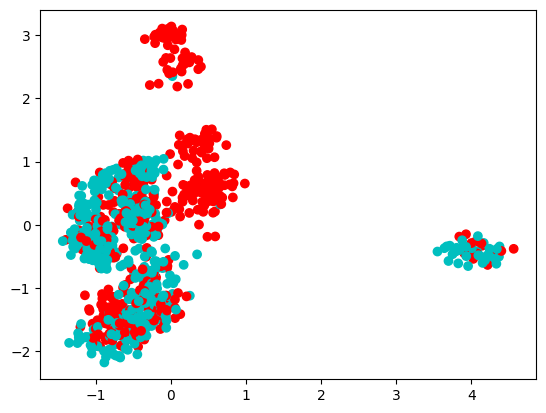

In [ ]:
P=multi_transform(proj, dist_art[:], G)

P=np.array(P)
plt.scatter(P.T[0], P.T[1], c=Y_art, cmap=colors)

In [ ]:
#P1=multi_transform0(proj, dist_art[:], G)
#P1=np.array(P1)
#np.allclose(P,P1)

Another thing to do could be the ISOMAP

/usr/local/lib/python3.10/dist-packages/sklearn/manifold/_isomap.py:373: UserWarning: The number of connected components of the neighbors graph is 5 > 1. Completing the graph to fit Isomap might be slow. Increase the number of neighbors to avoid this issue.
  self._fit_transform(X)
/usr/local/lib/python3.10/dist-packages/scipy/sparse/_index.py:100: SparseEfficiencyWarning: Changing the sparsity structure of a csr_matrix is expensive. lil_matrix is more efficient.
  self._set_intXint(row, col, x.flat[0])


Text(0.5, 1.0, 'Isomap 90')

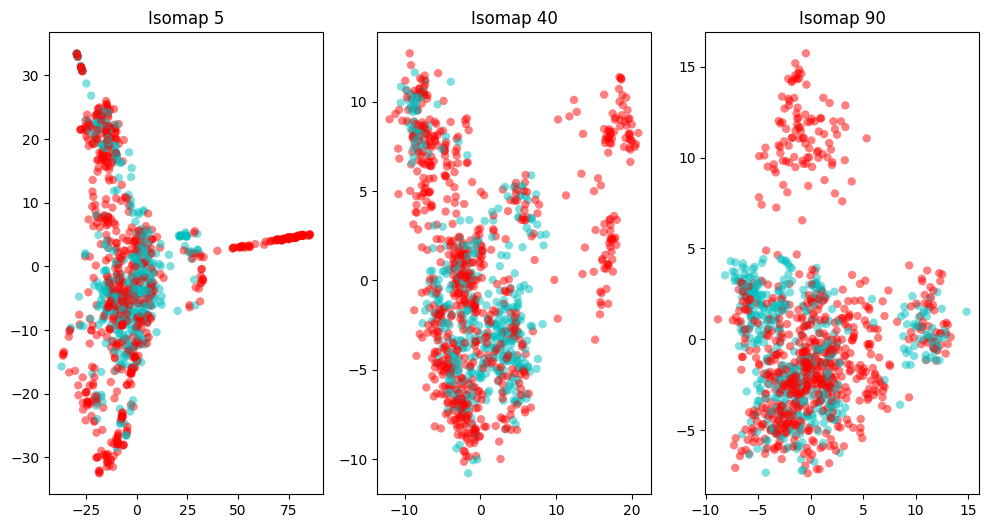

In [ ]:
from sklearn.manifold import Isomap

fig, (ax0, ax1, ax2) = plt.subplots(nrows=1, ncols=3, figsize=(12, 6))

embedding = Isomap(n_components=2, metric='precomputed', n_neighbors=5, n_jobs=-1)
X_transformed = embedding.fit_transform(np.sqrt(dist))
ax0.scatter(X_transformed.T[0], X_transformed.T[1], c=Y, alpha=0.5 , edgecolor='none', cmap=colors)
ax0.set_title('Isomap 5')

embedding = Isomap(n_components=2, metric='precomputed', n_neighbors=40, n_jobs=-1)
X_transformed = embedding.fit_transform(np.sqrt(dist))
ax1.scatter(X_transformed.T[0], X_transformed.T[1], c=Y, alpha=0.5 , edgecolor='none', cmap=colors)
ax1.set_title('Isomap 40')

embedding = Isomap(n_components=2, metric='precomputed', n_neighbors=90, n_jobs=-1)
X_transformed = embedding.fit_transform(np.sqrt(dist))
ax2.scatter(X_transformed.T[0], X_transformed.T[1], c=Y, alpha=0.5 , edgecolor='none', cmap=colors)
ax2.set_title('Isomap 90')

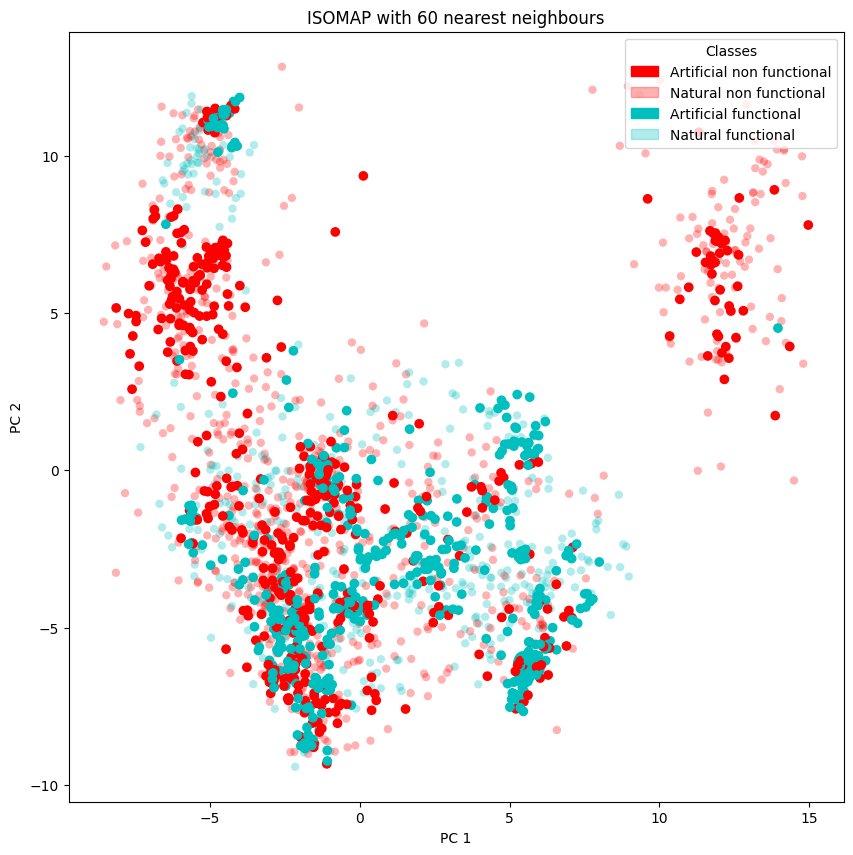

In [ ]:
import matplotlib.patches as mpatches

embedding = Isomap(n_components=200, metric='precomputed', n_neighbors=60, n_jobs=-1)
fig, ax1 = plt.subplots(figsize=(10, 10))

X_transformed_iso = embedding.fit_transform(np.sqrt(dist))
ax1.scatter(X_transformed_iso.T[0], X_transformed_iso.T[1], c=Y, alpha=0.3 , edgecolor='none', cmap=colors, label='Natural')
X_art_iso=embedding.transform(np.sqrt(dist_art))
ax1.scatter(X_art_iso.T[0], X_art_iso.T[1], c=Y_art, cmap=colors, label='Artificial')

red_patch_nat = mpatches.Patch(color='r', alpha=0.3, label='Natural non functional')
blue_patch_nat = mpatches.Patch(color='c', alpha=0.3, label='Natural functional')
red_patch_art = mpatches.Patch(color='r', label='Artificial non functional')
blue_patch_art = mpatches.Patch(color='c', label='Artificial functional')


ax1.legend(handles=[red_patch_art, red_patch_nat,  blue_patch_art, blue_patch_nat ],loc="upper right", title="Classes")
#legend1 = ax1.legend(handles=scatter.legend_elements()[0], labels=['Non-functional', 'Functional'],
#                     loc="upper right", title="Classes")
ax1.set_xlabel('PC 1')
ax1.set_ylabel('PC 2')
ax1.set_title('ISOMAP with 60 nearest neighbours')
fig.savefig('Isomap.png')
plt.show()

We can also see the results considering all the neighbours and compare it with that of our solution.
As expected, Isomap gives the same results when considering square root of the metric.

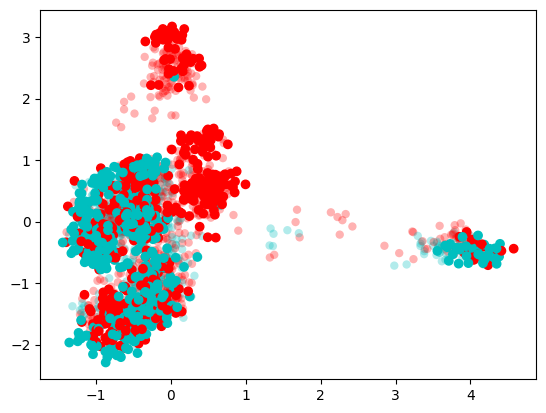

In [ ]:
embedding = Isomap(n_components=220, metric='precomputed', n_neighbors=1129, n_jobs=-1)
X_transformed = embedding.fit_transform(np.sqrt(dist))
plt.scatter(X_transformed.T[0], X_transformed.T[1], c=Y, alpha=0.3 , edgecolor='none', cmap=colors)
X_art=embedding.transform(np.sqrt(dist_art))
plt.scatter(X_art.T[0], X_art.T[1], c=Y_art, cmap=colors)

## Information imbalance

Text(0.5, 1.0, 'Rank')

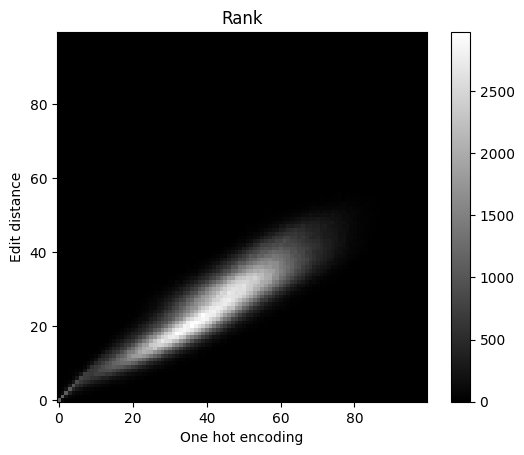

In [ ]:
from scipy.stats import rankdata
from scipy.spatial import distance_matrix

def rank_matrix(dist_matrix):
    rkmt=+dist_matrix
    for i in range(np.shape(dist_matrix)[0]):
        rkmt[i]=rankdata(dist_matrix[i], method='dense')
    rkmt=rkmt-np.ones(np.shape(rkmt))
    return rkmt

@jit(nopython=True, fastmath=True)
def fast_heat(heatmap, rk_A, rk_B, sh):
    for i in range(sh+1):
        for j in range(sh+1):
            if i!=j:
                heatmap[int(rk_B[i,j])-1,int(rk_A[i,j])-1]+=1
    return heatmap

def heatmap_fast(rk_A,rk_B):
    sh=np.shape(rk_A)[0]-1
    heatmap=np.zeros([sh,sh])
    heatmap=fast_heat(heatmap,rk_A,rk_B,sh)
    return heatmap

one_hot_dist=distance_matrix(X,X)
mappa=heatmap_fast(rank_matrix(one_hot_dist),rank_matrix(dist))[0:100,0:100]
plt.imshow(mappa, origin='lower',cmap='gray')
plt.colorbar()
plt.xlabel('''One hot encoding''')
plt.ylabel('Edit distance')
plt.title('Rank')

Following some ideas from [2] we plot the frequencies of the pairs of rank distances. Even though for discrete distances the information interpretation is not obvious, we can still use the image to "justify" the almost equivalence of the metrics.

From now on we will resort to use the one-hot encoding with 'Humming' distance

# Clustering

###Undersampling example

[ 453  335 1015   94  159  495  568  752 1097  148  119 1059  521  868
  156  916  529  579   81  729  186  691  860    6  142  537  395  492
  101  242  135  950  388  763  348  588  980  710  600  963  679 1112
  309  640 1071  126   47  401  298   49  713  548  479  631  825  754
  390  108  255  632  111  283  605  428  912  861  814  744  766   65
  897  992  680  899 1103  414  770  329  228  181  845  189  655 1040
   90   41  917  459  202  798  486 1104  734  841   80  803  872  408
  419  133  741  925  204  975  306  772  929  902  994  372  195  623
   78  948  742  120  154  350  310  721 1021   27  809  768   60  851
  612  790 1007 1014  958   62  304  786  430   99  404  200 1080 1033
  840  262   34   85   75   35  502  463  205  507  801  593  367  793
  827 1055  560  554  848  487  531    8  323 1009  274  708  443  349
  698  876  660 1008  481  435  636  983  550   10  602 1129  347  258
  464  190 1060  244  321   88  104 1043  534  923  735  837  774 1063
  688 

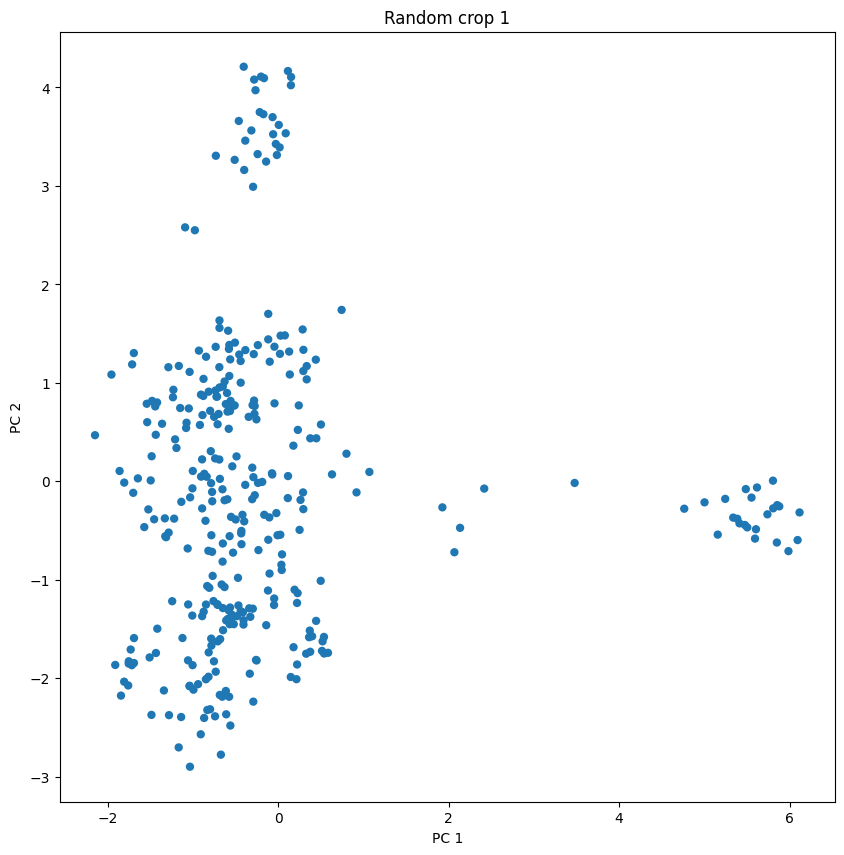

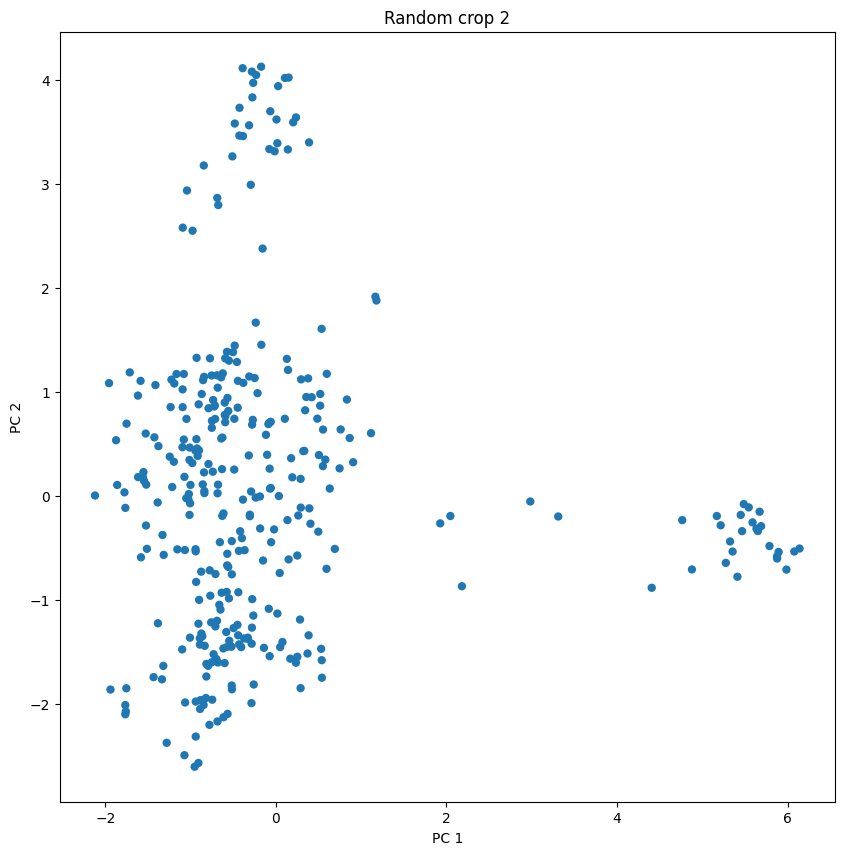

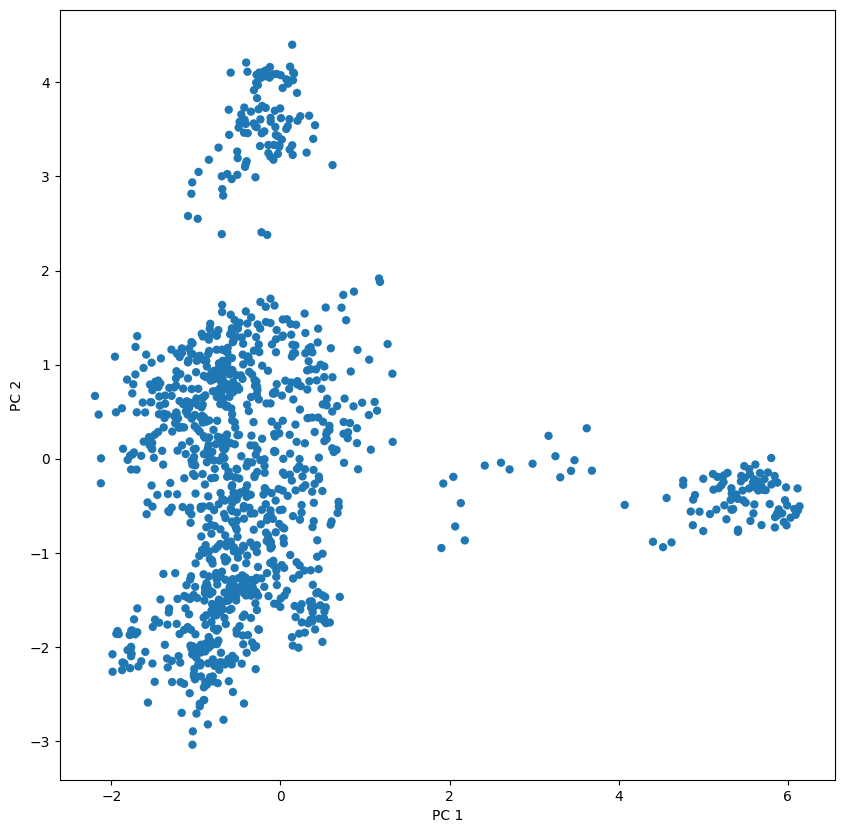

In [ ]:
np.random.seed(1)
sample=np.random.choice(len(X[:,1]),int(0.3*len(X[:,1])),replace=False)
np.random.seed(2)
sample2=np.random.choice(len(X[:,1]),int(0.3*len(X[:,1])),replace=False)
print(sample)
True_sample_1=X[sample]
True_sample2_1=X[sample2]

True_sample = Xproj[sample]
True_sample2 = Xproj[sample2]

plt.figure(figsize=(10,10))
plt.scatter(True_sample[:, 0], True_sample[:,1], edgecolor='none', alpha=1)
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('Random crop 1')
plt.savefig('Crop1.png')

plt.figure(figsize=(10,10))
plt.scatter(True_sample2[:, 0], True_sample2[:,1], edgecolor='none', alpha=1)
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('Random crop 2')
plt.savefig('Crop2.png')

plt.figure(figsize=(10,10))
plt.scatter(Xproj[:, 0], Xproj[:,1], edgecolor='none', alpha=1)
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.savefig('PCA.png')

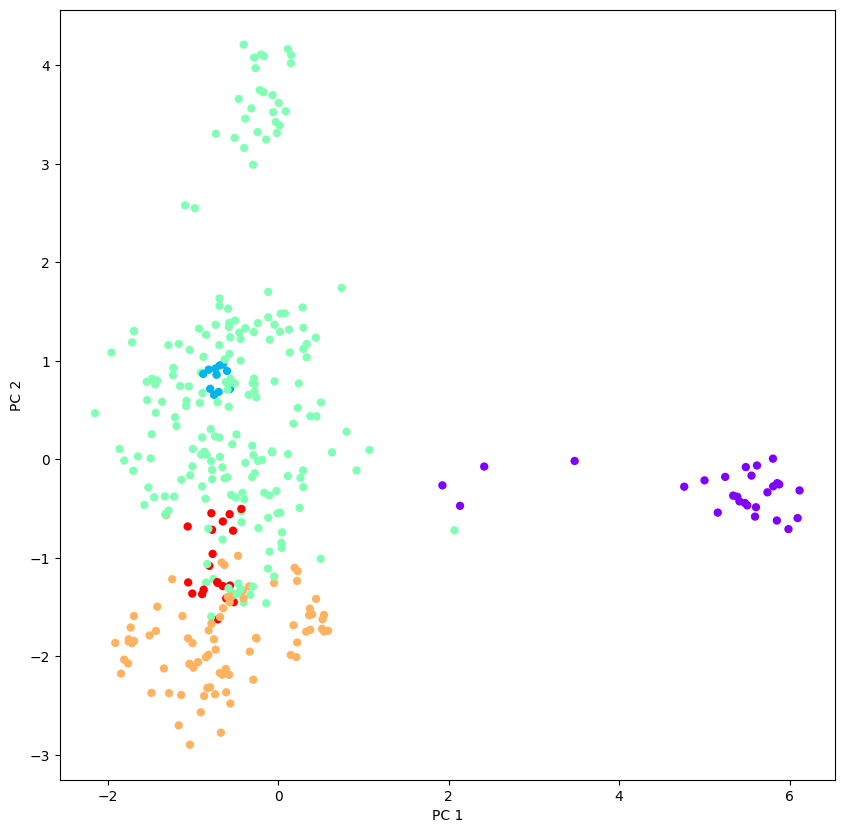

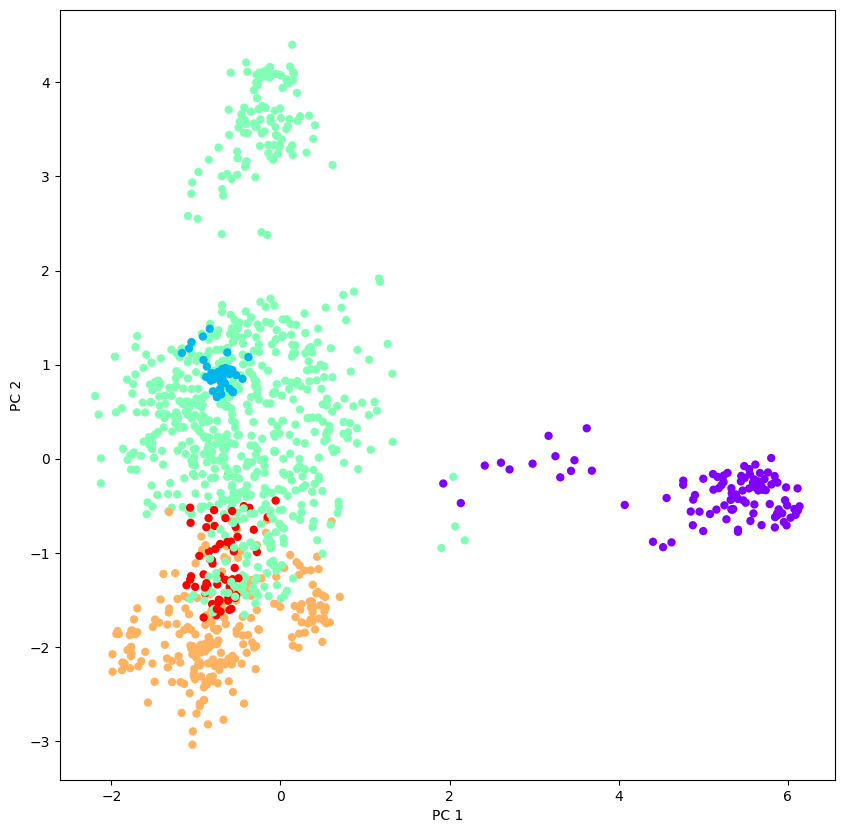

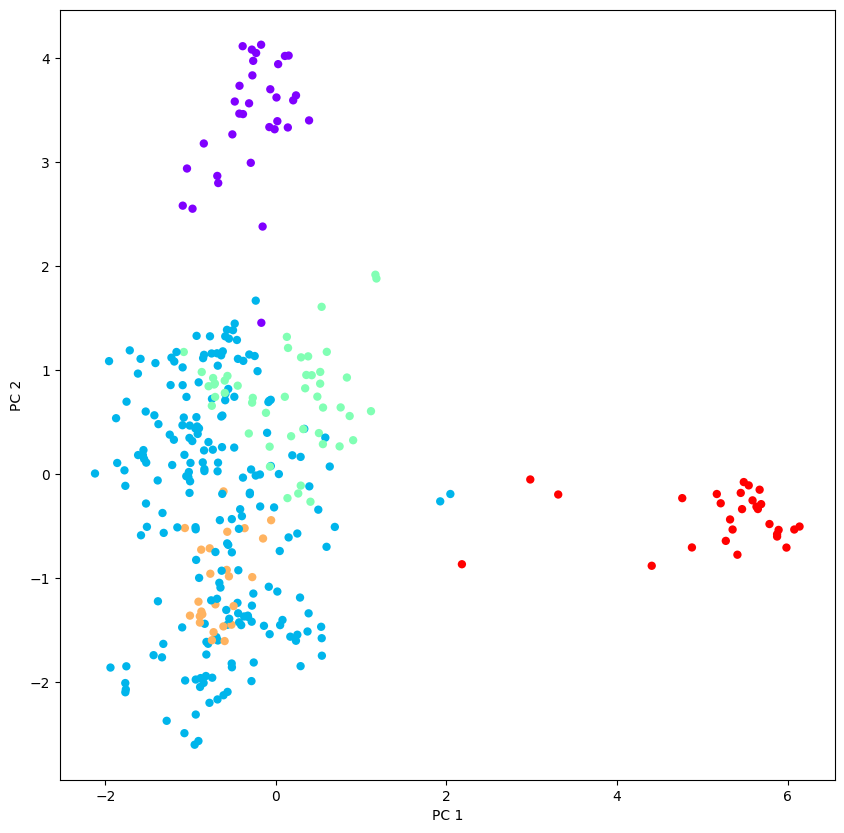

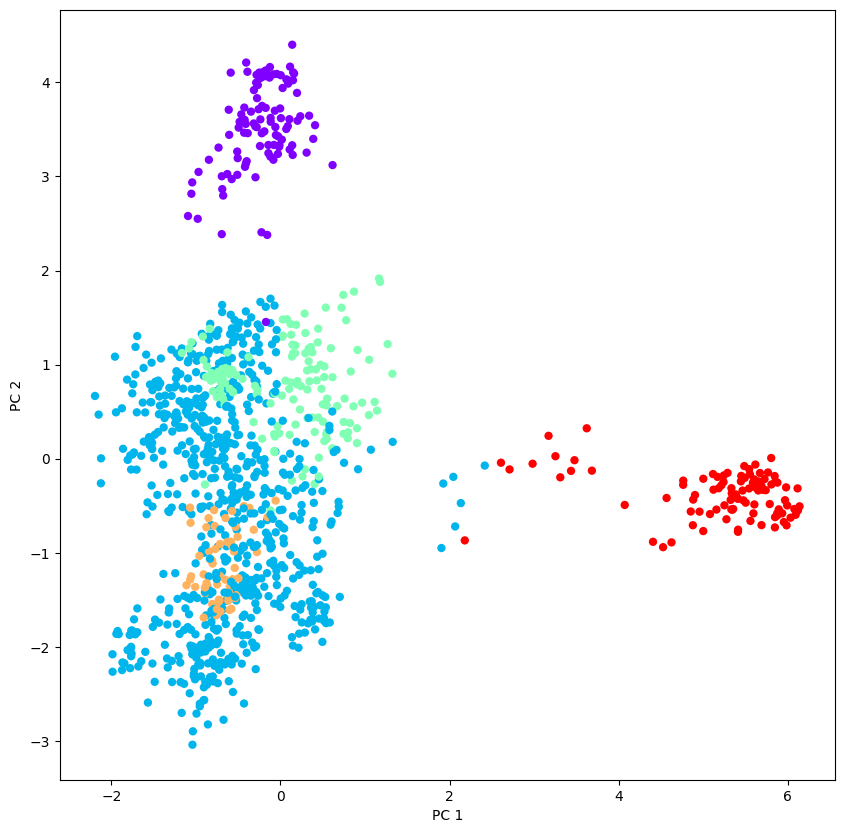

In [ ]:
k=5

est_means = KMeans(k, init='k-means++', n_init=100, max_iter=600)
est_means.fit(True_sample_1)

y_means = est_means.predict(True_sample_1)

plt.figure(figsize=(10,10))
plt.scatter(True_sample[:,0], True_sample[:,1] , c=y_means, cmap='rainbow',edgecolor='none', alpha=1);
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.savefig('Crop1_clustered.png')

y_means = est_means.predict(X)
plt.figure(figsize=(10,10))
plt.scatter(Xproj[:,0], Xproj[:,1] , c=y_means, cmap='rainbow',edgecolor='none', alpha=1);
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.savefig('Crop1_all.png')

est_means.fit(True_sample2_1)

y_means = est_means.predict(True_sample2_1)

plt.figure(figsize=(10,10))
plt.scatter(True_sample2[:,0], True_sample2[:,1] , c=y_means, cmap='rainbow',edgecolor='none', alpha=1);
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.savefig('Crop2_clustered.png')

y_means = est_means.predict(X)
plt.figure(figsize=(10,10))
plt.scatter(Xproj[:,0], Xproj[:,1] , c=y_means, cmap='rainbow',edgecolor='none', alpha=1);
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.savefig('Crop2_all.png')


## K-MEANS

In [ ]:
#To plot with centers the k-means results
def km_res(X,k):
  est_means = KMeans(k, init='k-means++', n_init=100, max_iter=600)
  est_means.fit(X)
  y_means = est_means.predict(X)

  centers = []
  for i in range(k):
    centers.append(0)
    centers[i] = list(pca.transform(est_means.cluster_centers_[i,:].reshape(1, -1))[0:2])
    #print(np.shape(np.array(pca.transform(est_means.cluster_centers_[i,:].reshape(1, -1)))))
  centers = np.array(centers)
  #print(np.shape(centers))

  centers = np.array(centers[:,0,0:2]).reshape((k,2))
  #print(centers)
  plt.scatter(X[:,0], X[:,1] , c=y_means, s=50, cmap='rainbow',edgecolor='black', linewidth=1);
  plt.scatter(centers[:,0], centers[:,1], s=100, color="gold", edgecolor='black', linewidth=3)
  plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
  plt.show()

  return y_means

In [ ]:
#To plot with any specific color and projections. If there are outliers, it prints them
def show_clustering(Xproj,y):
  plt.scatter(Xproj[:,0], Xproj[:,1] , c=y, s=50, cmap='rainbow',edgecolor='black', linewidth=1);
  plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
  plt.show()
  print("We find " + str(np.max(y)+1)+" clusters")
  if -1 in y:
    print("The number of outliers is "+ str(len([i for i in y if i == -1])))


The problem is to find an appropriate number of clusters for our dataset and K-means.

To do so we apply two analysis:

1. We use the Adjusted mutual information score to understand how much two clusterings are different one from the other.
1. We use the scree plot to decide.

### Natural


**1. Number of clusters Using Adjusted Mutual Info score**

In [ ]:
import itertools
from sklearn.metrics import adjusted_mutual_info_score
def MI_average(X,perc,centers,k,n_samples,n_init=100):
  my_list=range(n_samples)
  Combination=list(itertools.combinations(my_list, 2))

  est=KMeans(k, init=centers, n_init=n_init, max_iter=600)

  y_pred=[]
  for i in range(n_samples):
    X_samp=(X[np.random.choice(len(X[:,1]),int(perc*len(X[:,1])),replace=False)])
    est.fit(X_samp)
    y_pred.append(est.predict(X))
  A=[]
  for comb in Combination:
    A.append(adjusted_mutual_info_score(y_pred[comb[0]],y_pred[comb[1]]))
  return A

The code is computationally expensive **DO NOT RUN**

In [ ]:
'''
# DO NOT RUN
n_jobs=-1
n_samples = 15
n_init = 100
mut_list_kpp_nat = []
mut_list_kpp_nat = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X, 0.5, 'k-means++', k+2, n_samples, n_init) for k in range(0,23))
#for k in range(0,2):
#  mut_list.append([])
#  mut_list[k].append(MI_average(X,0.50,'k-means++',k+2,n_samples,n_init))
'''

"\n# DO NOT RUN\nn_jobs=-1\nn_samples = 15\nn_init = 100\nmut_list_kpp_nat = []\nmut_list_kpp_nat = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X, 0.5, 'k-means++', k+2, n_samples, n_init) for k in range(0,23))\n#for k in range(0,2):\n#  mut_list.append([])\n#  mut_list[k].append(MI_average(X,0.50,'k-means++',k+2,n_samples,n_init))\n"

In [ ]:
'''# DO NOT RUN
n_jobs=-1
n_samples = 15
n_init = 100
mut_list_random_nat = []
mut_list_random_nat = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X, 0.5, 'random', k+2, n_samples, n_init) for k in range(0,23))'''

"# DO NOT RUN\nn_jobs=-1\nn_samples = 15\nn_init = 100\nmut_list_random_nat = []\nmut_list_random_nat = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X, 0.5, 'random', k+2, n_samples, n_init) for k in range(0,23))"

In [ ]:
'''
with open("MI_nat_n_init_100_random.txt","a") as data:
  for k in range(0,23):
    print(mut_list_random_nat[k],file=data)
from google.colab import files
files.download("MI_nat_n_init_100_random.txt")
'''

'\nwith open("MI_nat_n_init_100_random.txt","a") as data:\n  for k in range(0,23):\n    print(mut_list_random_nat[k],file=data)\nfrom google.colab import files\nfiles.download("MI_nat_n_init_100_random.txt")\n'

In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_nat_n_init_100_kpp.txt
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_nat_n_init_100_random.txt

--2024-02-05 13:46:36--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_nat_n_init_100_kpp.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47273 (46K) [text/plain]
Saving to: ‘MI_nat_n_init_100_kpp.txt’

MI_nat_n_init_100_k 100%[===================>]  46.17K  --.-KB/s    in 0.01s   

2024-02-05 13:46:36 (4.41 MB/s) - ‘MI_nat_n_init_100_kpp.txt’ saved [47273/47273]

--2024-02-05 13:46:36--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_nat_n_init_100_random.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connec

In [ ]:
with open("MI_nat_n_init_100_kpp.txt","r") as dataMI:
  mut_list_kpp = []
  for line in dataMI.readlines():
    linea = []
    for elm in line.strip().split():
      linea.append(float(elm.strip("[] ,")))
    mut_list_kpp.append(linea)
mut_list_kpp=np.array(mut_list_kpp)
print(np.shape(mut_list_kpp))

with open("MI_nat_n_init_100_random.txt","r") as dataMI:
  mut_list_random = []
  for line in dataMI.readlines():
    linea = []
    for elm in line.strip().split():
      linea.append(float(elm.strip("[] ,")))
    mut_list_random.append(linea)
mut_list_random=np.array(mut_list_random)
print(np.shape(mut_list_random))


(23, 105)
(23, 105)


{'bodies': [<matplotlib.collections.PolyCollection at 0x7d309e9c91e0>,
 'cmeans': <matplotlib.collections.LineCollection at 0x7d309e9ca470>,
 'cmaxes': <matplotlib.collections.LineCollection at 0x7d309c062ce0>,
 'cmins': <matplotlib.collections.LineCollection at 0x7d30a5061e40>,
 'cbars': <matplotlib.collections.LineCollection at 0x7d309c323400>,
 'cquantiles': <matplotlib.collections.LineCollection at 0x7d309c3211e0>}

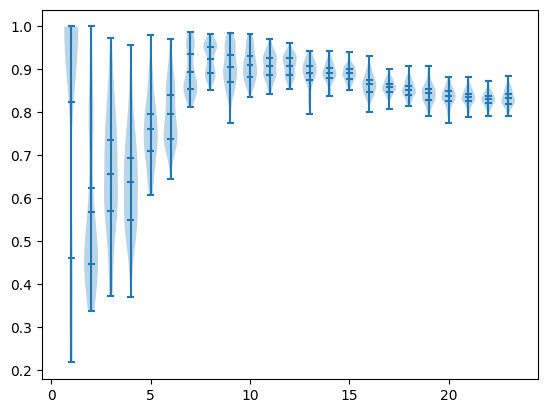

In [ ]:
plt.violinplot(mut_list_kpp.T, showmeans=True, showextrema=True, widths=0.7, quantiles=[[0.25,0.7]]*23, bw_method=0.4)


In [ ]:
#Given list of mutual and number of cluster maximum that you analyse, it graphs
def MI_find(mut_list,k_max,name='title'):
  print(np.shape(mut_list))
  means=[]
  maxi=[]
  mini=[]
  for k in range(0,k_max-2):
    plt.scatter(np.ones(len(mut_list[0,:]))*(k+2),mut_list[k,:],color='b',alpha=0.2)
    plt.scatter(np.ones(1)*(k+2), np.mean(mut_list[k,:]),color='r',alpha=1)
    means.append(np.mean(mut_list[k,:]))
    maxi.append(np.max(mut_list[k,:]))
    mini.append(np.min(mut_list[k,:]))
  maxmax = 0
  i_min=0
  i_max=0
  minmax = 0
  for i in range(0,k_max-2):
    if maxi[i]>maxmax and i >= 5:
      maxmax = maxi[i]
      i_max = i
    if mini[i]>minmax:
      minmax = mini[i]
      i_min = i
  #plt.scatter(np.array([i_max+2]),np.array([maxmax]),c="green")
  #plt.scatter(np.array([i_min+2]),np.array([minmax]), c="green")
  plt.scatter( np.array([np.argmax(means)+2]),np.array([np.max(means)]),c="green")
  plt.xlabel('Number of clusters')
  plt.ylabel('Adjusted Mutual Information')
  plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
  i_MI = np.argmax(means)
  k_MI = np.argmax(means)+2
  print("The means of the adjusted_mutual_info_score suggest the best value of k is "+str(k_MI))
  plt.savefig(f'{name}.png')
  return i_MI, k_MI #returns index of best MI and best k

(23, 105)
The means of the adjusted_mutual_info_score suggest the best value of k is 9


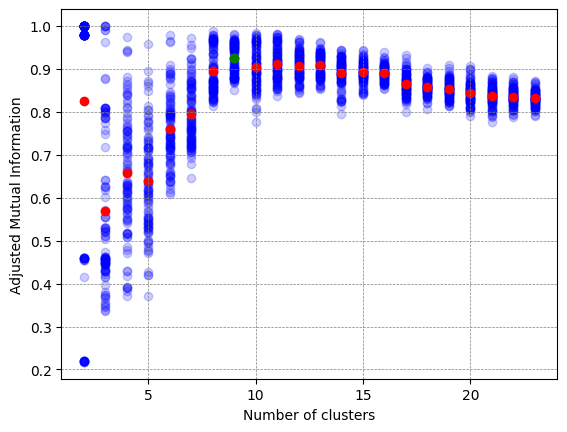

In [ ]:
i_MI_kpp_nat , k_MI_kpp_nat = MI_find(mut_list_kpp,24)

(23, 105)
The means of the adjusted_mutual_info_score suggest the best value of k is 9


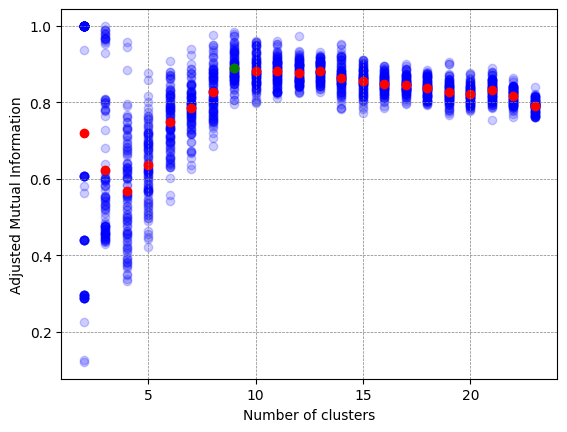

In [ ]:
i_MI_random_nat , k_MI_random_nat = MI_find(mut_list_random,24)

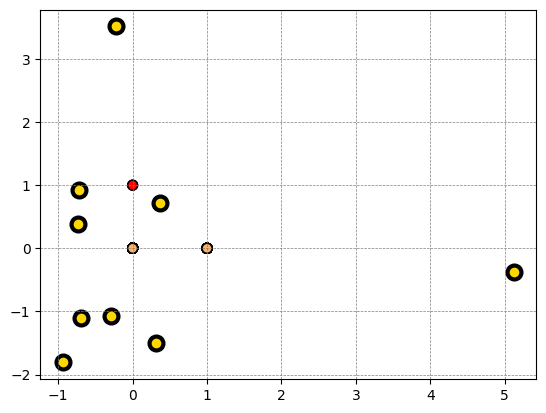

In [ ]:
y_means_nat_MI = km_res(X,k_MI_kpp_nat) #vector with cluster name for each sequence in natural space

The data produced above involving the adjusted mutual information score may suggest that the number of clusters is 9. In particular from the behaviour of the score we might say that this method suggests a bound for the number of clusters to be 9 ≤ k ≤ 13, in which the score seems approximatly costant, before starts decreasing for larger values of k. This in particular seems to be true for both type of initialization critiria for the clusters' centers.

We will continue our analysis studying the value of the loss function at the end of the algorithm as a function of k:

**2. Scree plot of the Loss function**

In [ ]:
"""
inertia_nat = np.zeros(29)
for k in range(2,31):
    est = KMeans(k, init='k-means++', n_init=100, max_iter=600)
    est.fit(X)
    #y_means[l].append(est.predict(X))
    inertia_nat[k-2]=est.inertia_
"""

"\ninertia_nat = np.zeros(29)\nfor k in range(2,31):\n    est = KMeans(k, init='k-means++', n_init=100, max_iter=600)\n    est.fit(X)\n    #y_means[l].append(est.predict(X))\n    inertia_nat[k-2]=est.inertia_\n"

In [ ]:
"""
with open("inertia_nat_n_init_100.txt","a") as data:
  for k in range(0,29):
    print(inertia_nat[k],file=data)
from google.colab import files
files.download("inertia_nat_n_init_100.txt")
"""

'\nwith open("inertia_nat_n_init_100.txt","a") as data:\n  for k in range(0,29):\n    print(inertia_nat[k],file=data)\nfrom google.colab import files\nfiles.download("inertia_nat_n_init_100.txt")\n'

In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/inertia_nat_n_init_100.txt

--2024-02-05 13:46:57--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/inertia_nat_n_init_100.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 521 [text/plain]
Saving to: ‘inertia_nat_n_init_100.txt’

inertia_nat_n_init_ 100%[===================>]     521  --.-KB/s    in 0s      

2024-02-05 13:46:57 (35.0 MB/s) - ‘inertia_nat_n_init_100.txt’ saved [521/521]



In [ ]:
with open("inertia_nat_n_init_100.txt","r") as dataInertia:
  inertia_nat = []
  for line in dataInertia.readlines():
    inertia_nat.append(float(line.strip()))
inertia_nat=np.array(inertia_nat)
print(np.shape(inertia_nat))

(29,)


With the scree plot method the best estimate for the hyperparameter k is 12


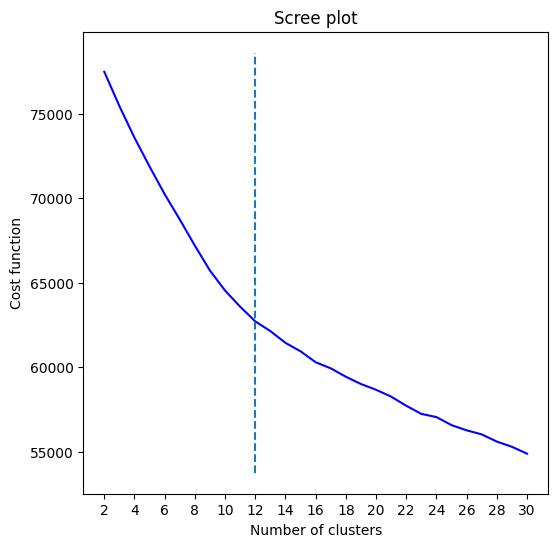

In [ ]:
k_axis = range(2,len(inertia_nat)+2)
kl = KneeLocator(k_axis, inertia_nat, curve="convex", direction="decreasing", interp_method="polynomial")
kl.plot_knee()
k_scree_nat = kl.knee
i_scree_nat = k_scree_nat -2
print("With the scree plot method the best estimate for the hyperparameter k is "+str(k_scree_nat))
plt.title('Scree plot')
plt.ylabel('Cost function')
plt.xlabel('Number of clusters')
legend = plt.legend()
legend.remove()
plt.xticks(k_axis[::2])
plt.savefig('scree_plot.png')

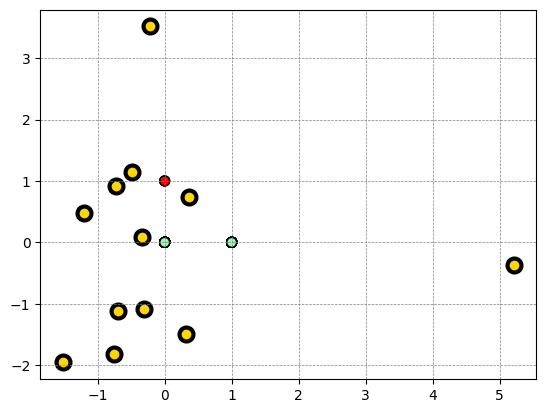

In [ ]:
y_means_nat_scree = km_res(X,k_scree_nat)

### Natural + artificial

In [ ]:
"""
n_jobs=-1
n_samples = 15
n_init = 100
mut_list_kpp_tot = []
mut_list_kpp_tot = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X_tot, 0.5, 'k-means++', k+2, n_samples, n_init) for k in range(0,28))
"""

"\nn_jobs=-1\nn_samples = 15\nn_init = 100\nmut_list_kpp_tot = []\nmut_list_kpp_tot = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X_tot, 0.5, 'k-means++', k+2, n_samples, n_init) for k in range(0,28))\n"

In [ ]:
# allungando
"""
n_jobs=-1
n_samples = 15
n_init = 100
mut_list_kpp_tot = []
mut_list_kpp_tot = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X_tot, 0.5, 'k-means++', k+2, n_samples, n_init) for k in range(28,41))
"""

"\nn_jobs=-1\nn_samples = 15\nn_init = 100\nmut_list_kpp_tot = []\nmut_list_kpp_tot = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X_tot, 0.5, 'k-means++', k+2, n_samples, n_init) for k in range(28,41))\n"

In [ ]:
# allungando parte due DA RUNNARE
"""
n_jobs=-1
n_samples = 15
n_init = 100
mut_list_kpp_tot = []
mut_list_kpp_tot = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X_tot, 0.5, 'k-means++', k+2, n_samples, n_init) for k in range(41,51))
"""

"\nn_jobs=-1\nn_samples = 15\nn_init = 100\nmut_list_kpp_tot = []\nmut_list_kpp_tot = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X_tot, 0.5, 'k-means++', k+2, n_samples, n_init) for k in range(41,51))\n"

In [ ]:
"""
n_jobs=-1
n_samples = 15
n_init = 100
mut_list_random_tot = []
mut_list_random_tot = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X_tot, 0.5, 'random', k+2, n_samples, n_init) for k in range(0,28))
"""

"\nn_jobs=-1\nn_samples = 15\nn_init = 100\nmut_list_random_tot = []\nmut_list_random_tot = Parallel(n_jobs=n_jobs)(delayed(MI_average)(X_tot, 0.5, 'random', k+2, n_samples, n_init) for k in range(0,28))\n"

In [ ]:
# DA RUNNARE
"""
with open("MI_tot_n_init_100_kpp_agg2.txt","a") as data:
  for k in range(0,10):
    print(mut_list_kpp_tot[k],file=data)
from google.colab import files
files.download("MI_tot_n_init_100_kpp_agg2.txt")
"""

'\nwith open("MI_tot_n_init_100_kpp_agg2.txt","a") as data:\n  for k in range(0,10):\n    print(mut_list_kpp_tot[k],file=data)\nfrom google.colab import files\nfiles.download("MI_tot_n_init_100_kpp_agg2.txt")\n'

In [ ]:
"""
with open("MI_tot_n_init_100_random.txt","a") as data:
  for k in range(0,28):
    print(mut_list_random_tot[k],file=data)
from google.colab import files
files.download("MI_tot_n_init_100_random.txt")
"""

'\nwith open("MI_tot_n_init_100_random.txt","a") as data:\n  for k in range(0,28):\n    print(mut_list_random_tot[k],file=data)\nfrom google.colab import files\nfiles.download("MI_tot_n_init_100_random.txt")\n'

In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_tot_n_init_100_kpp.txt

--2024-02-05 13:47:17--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_tot_n_init_100_kpp.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 58422 (57K) [text/plain]
Saving to: ‘MI_tot_n_init_100_kpp.txt’

MI_tot_n_init_100_k 100%[===================>]  57.05K  --.-KB/s    in 0.01s   

2024-02-05 13:47:17 (5.05 MB/s) - ‘MI_tot_n_init_100_kpp.txt’ saved [58422/58422]



In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_tot_n_init_100_random.txt

--2024-02-05 13:47:17--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_tot_n_init_100_random.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 58513 (57K) [text/plain]
Saving to: ‘MI_tot_n_init_100_random.txt’

MI_tot_n_init_100_r 100%[===================>]  57.14K  --.-KB/s    in 0.01s   

2024-02-05 13:47:17 (5.23 MB/s) - ‘MI_tot_n_init_100_random.txt’ saved [58513/58513]



In [ ]:
with open("MI_tot_n_init_100_kpp.txt","r") as dataMI:
  mut_list_kpp_tot = []
  for line in dataMI.readlines():
    linea = []
    for elm in line.strip().split():
      linea.append(float(elm.strip("[] ,")))
    mut_list_kpp_tot.append(linea)
mut_list_kpp_tot=np.array(mut_list_kpp_tot)
print(np.shape(mut_list_kpp_tot))

with open("MI_tot_n_init_100_random.txt","r") as dataMI:
  mut_list_random_tot = []
  for line in dataMI.readlines():
    linea = []
    for elm in line.strip().split():
      linea.append(float(elm.strip("[] ,")))
    mut_list_random_tot.append(linea)
mut_list_random_tot=np.array(mut_list_random_tot)
print(np.shape(mut_list_random_tot))

(28, 105)
(28, 105)


(28, 105)
The means of the adjusted_mutual_info_score suggest the best value of k is 28


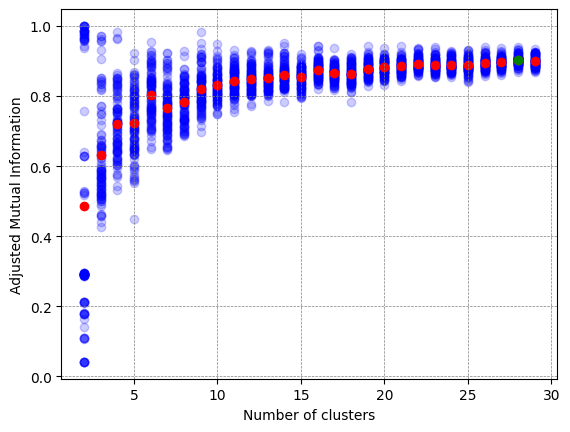

In [ ]:
i_MI_kpp_tot , k_MI_kpp_tot = MI_find(mut_list_kpp_tot,30)

(28, 105)
The means of the adjusted_mutual_info_score suggest the best value of k is 28


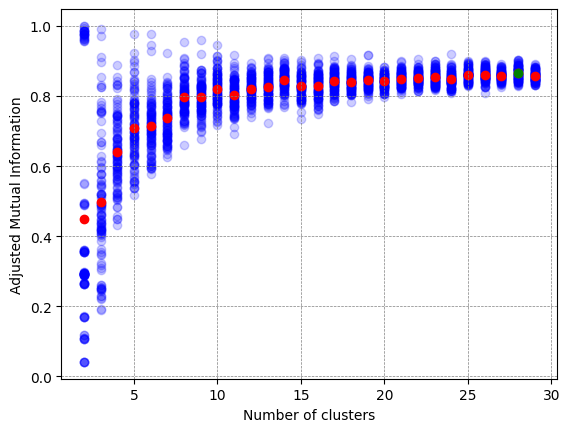

In [ ]:
i_MI_random_tot , k_MI_random_tot = MI_find(mut_list_random_tot,30)

We add more points to study in better way the behavoiur of AMI score with k

In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_tot_n_init_100_kpp_agg.txt

--2024-02-05 13:47:20--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_tot_n_init_100_kpp_agg.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 27140 (27K) [text/plain]
Saving to: ‘MI_tot_n_init_100_kpp_agg.txt’

MI_tot_n_init_100_k 100%[===================>]  26.50K  --.-KB/s    in 0.002s  

2024-02-05 13:47:20 (16.7 MB/s) - ‘MI_tot_n_init_100_kpp_agg.txt’ saved [27140/27140]



In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_tot_n_init_100_kpp_agg2.txt

--2024-02-05 13:47:20--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/MI_tot_n_init_100_kpp_agg2.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20893 (20K) [text/plain]
Saving to: ‘MI_tot_n_init_100_kpp_agg2.txt’

MI_tot_n_init_100_k 100%[===================>]  20.40K  --.-KB/s    in 0.001s  

2024-02-05 13:47:20 (25.6 MB/s) - ‘MI_tot_n_init_100_kpp_agg2.txt’ saved [20893/20893]



In [ ]:
with open("MI_tot_n_init_100_kpp_agg.txt","r") as dataMI:
  mut_list_kpp_tot_agg = []
  for line in dataMI.readlines():
    linea = []
    for elm in line.strip().split():
      linea.append(float(elm.strip("[] ,")))
    mut_list_kpp_tot_agg.append(linea)
mut_list_kpp_tot_agg=np.array(mut_list_kpp_tot_agg)
print(np.shape(mut_list_kpp_tot_agg))

(13, 105)


In [ ]:
# DA RUNNARE
with open("MI_tot_n_init_100_kpp_agg2.txt","r") as dataMI:
  mut_list_kpp_tot_agg2 = []
  for line in dataMI.readlines():
    linea = []
    for elm in line.strip().split():
      linea.append(float(elm.strip("[] ,")))
    mut_list_kpp_tot_agg2.append(linea)
mut_list_kpp_tot_agg2=np.array(mut_list_kpp_tot_agg2)
print(np.shape(mut_list_kpp_tot_agg2))

(10, 105)


In [ ]:
mut_list_kpp_tot_long = np.vstack((mut_list_kpp_tot,mut_list_kpp_tot_agg,mut_list_kpp_tot_agg2))
print(np.shape(mut_list_kpp_tot_long))

(51, 105)


(51, 105)
The means of the adjusted_mutual_info_score suggest the best value of k is 32


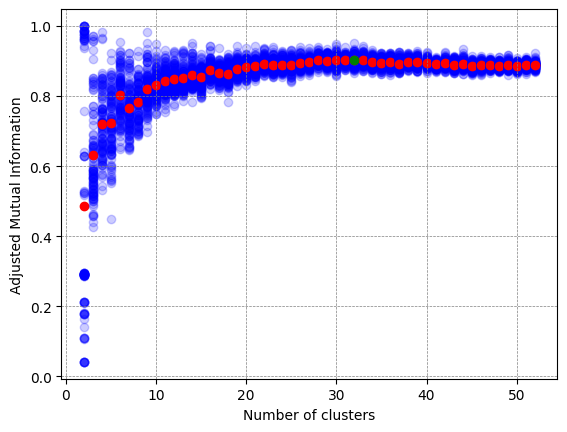

In [ ]:
i_MI_kpp_tot_long , k_MI_kpp_tot_long = MI_find(mut_list_kpp_tot_long,53,name='ami_tot')

This method for the tot dataset doesn't seem to be able to give a good indication on the number of clusters. Anyway we save the results and we will analysze this result in terms of separation in natural and artificial later.

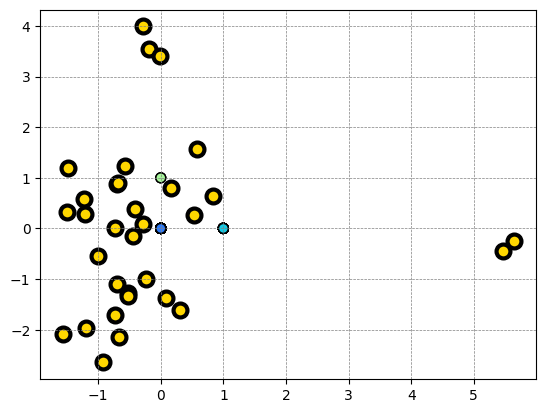

In [ ]:
y_means_tot_MI = km_res(X_tot,k_MI_kpp_tot_long)

**Inertia**

In [ ]:
"""
inertia_tot = np.zeros(29)
for k in range(2,31):
    est = KMeans(k, init='k-means++', n_init=100, max_iter=600)
    est.fit(X_tot)
    #y_means[l].append(est.predict(X))
    inertia_tot[k-2]=est.inertia_
"""

"\ninertia_tot = np.zeros(29)\nfor k in range(2,31):\n    est = KMeans(k, init='k-means++', n_init=100, max_iter=600)\n    est.fit(X_tot)\n    #y_means[l].append(est.predict(X))\n    inertia_tot[k-2]=est.inertia_\n"

In [ ]:
# DA RUNNARE
"""
inertia_tot_agg = np.zeros(20)
for k in range(31,51):
    est = KMeans(k, init='k-means++', n_init=100, max_iter=600)
    est.fit(X_tot)
    #y_means[l].append(est.predict(X))
    inertia_tot_agg[k-31]=est.inertia_
"""

"\ninertia_tot_agg = np.zeros(20)\nfor k in range(31,51):\n    est = KMeans(k, init='k-means++', n_init=100, max_iter=600)\n    est.fit(X_tot)\n    #y_means[l].append(est.predict(X))\n    inertia_tot_agg[k-31]=est.inertia_\n"

In [ ]:
# DA RUNNARE
"""
with open("inertia_tot_n_init_100_agg.txt","a") as cosa:
  for k in range(0,20):
    print(inertia_tot_agg[k],file=cosa)
from google.colab import files
files.download("inertia_tot_n_init_100_agg.txt")
"""

'\nwith open("inertia_tot_n_init_100_agg.txt","a") as cosa:\n  for k in range(0,20):\n    print(inertia_tot_agg[k],file=cosa)\nfrom google.colab import files\nfiles.download("inertia_tot_n_init_100_agg.txt")\n'

In [ ]:
"""
with open("inertia_tot_n_init_100_.txt","a") as cosa:
  for k in range(0,29):
    print(inertia_tot[k],file=cosa)
from google.colab import files
files.download("inertia_tot_n_init_100_.txt")
"""

'\nwith open("inertia_tot_n_init_100_.txt","a") as cosa:\n  for k in range(0,29):\n    print(inertia_tot[k],file=cosa)\nfrom google.colab import files\nfiles.download("inertia_tot_n_init_100_.txt")\n'

Open the file above

In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/inertia_tot_n_init_100.txt

--2024-02-05 13:48:17--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/inertia_tot_n_init_100.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 531 [text/plain]
Saving to: ‘inertia_tot_n_init_100.txt’

inertia_tot_n_init_ 100%[===================>]     531  --.-KB/s    in 0s      

2024-02-05 13:48:17 (39.9 MB/s) - ‘inertia_tot_n_init_100.txt’ saved [531/531]



In [ ]:
!wget https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/inertia_tot_n_init_100_agg.txt

--2024-02-05 13:48:18--  https://raw.githubusercontent.com/EliaBronzo/Protein_functionality_prediction/main/inertia_tot_n_init_100_agg.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 354 [text/plain]
Saving to: ‘inertia_tot_n_init_100_agg.txt’

inertia_tot_n_init_ 100%[===================>]     354  --.-KB/s    in 0s      

2024-02-05 13:48:18 (29.5 MB/s) - ‘inertia_tot_n_init_100_agg.txt’ saved [354/354]



In [ ]:
with open("inertia_tot_n_init_100.txt","r") as dataInertia:
  inertia_tot = []
  for line in dataInertia.readlines():
    inertia_tot.append(float(line.strip()))
inertia_tot=np.array(inertia_tot)
print(np.shape(inertia_tot))

(29,)


In [ ]:
with open("inertia_tot_n_init_100_agg.txt","r") as dataInertia:
  inertia_tot_agg = []
  for line in dataInertia.readlines():
    inertia_tot_agg.append(float(line.strip()))
inertia_tot_agg=np.array(inertia_tot_agg)
print(np.shape(inertia_tot_agg))

(20,)


In [ ]:
inertia_tot_long = np.hstack((inertia_tot,inertia_tot_agg))

With the scree plot method the best estimate for the hyperparameter k is 18


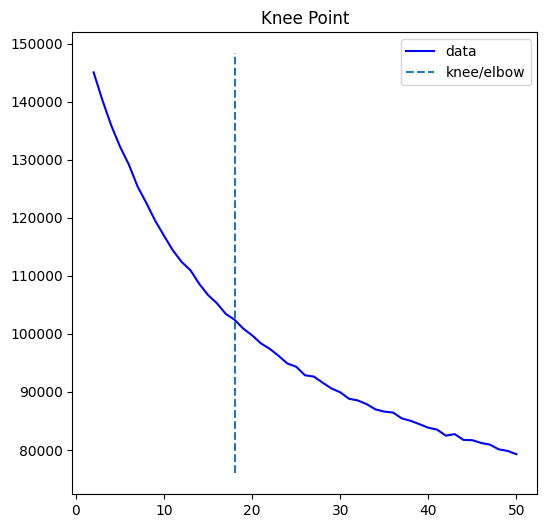

In [ ]:
k_axis = range(2,len(inertia_tot_long)+2)
kl = KneeLocator(k_axis, inertia_tot_long, curve="convex", direction="decreasing", interp_method="polynomial")
kl.plot_knee()
#kl.plot_knee_normalized()
k_scree_tot = kl.knee
i_scree_tot = k_scree_tot-2
print("With the scree plot method the best estimate for the hyperparameter k is "+str(k_scree_tot))


With the scree plot method the best estimate for the hyperparameter k is 18


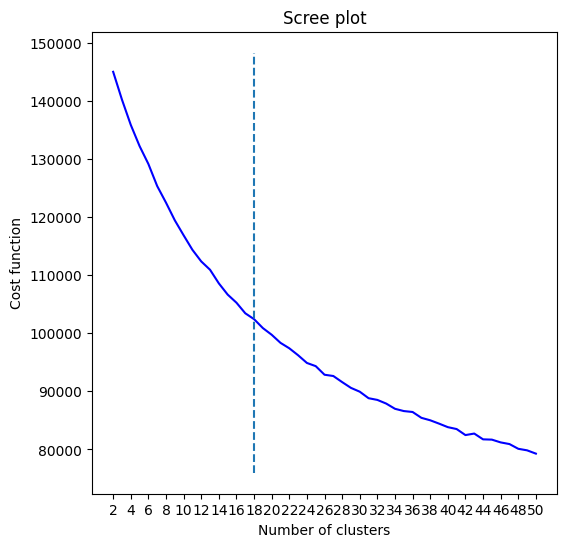

In [ ]:
k_axis = range(2,len(inertia_tot_long)+2)
kl = KneeLocator(k_axis, inertia_tot_long, curve="convex", direction="decreasing", interp_method="polynomial")
kl.plot_knee()
k_scree_nat = kl.knee
i_scree_tot = k_scree_tot -2
print("With the scree plot method the best estimate for the hyperparameter k is "+str(k_scree_nat))
plt.title('Scree plot')
plt.ylabel('Cost function')
plt.xlabel('Number of clusters')
legend = plt.legend()
legend.remove()
plt.xticks(k_axis[::2])
plt.savefig('scree_plot_tot.png')

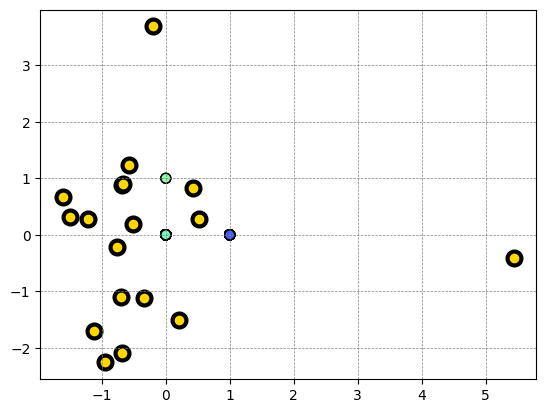

In [ ]:
y_means_tot_scree = km_res(X_tot,k_scree_tot)

## **DBSCAN**

We now want to try to use DBSCAN to find the clusters. The problem with this algorithm is the tuning of the hyperparameters. We first try to choose eps and MinPts we the euristic presented in the original paper of DBSCAN [4]

At first we decided to run DBSCAN only on the 10 first principal components of our datapoints, at the end we tuned the hyperparameters also to make the algorithm work on the dataset with full dimensionality.

DBSCAN has also some problems of interpretation since it identifies some points as noise, which is difficult to interpret for sure in the natural sequence dataset. Anyway we decided to use this algorithm evalute how a density based approch works on this dataset.

### Natural

In [ ]:
N = 10 # to try with a different reduced feature space dimesnionality change N
pca = PCA(n_components=N)
X_trasf = pca.fit_transform(X)
print(np.sum(pca.explained_variance_ratio_))

0.24047064771468343


As you can see from the previous output doing DBSCAN on 10-dimensional version of our data is not really well justified since we are taking into account only 24% of the total variance.

In [ ]:
def nn_eps_finder(X_trasf,dim): #For each point it computes distance of 2*d-1 (where 2*d=Mnpts)
  nbrs = NearestNeighbors(n_neighbors = 2*dim-1).fit(X_trasf)
  neigh_dist, neigh_ind = nbrs.kneighbors(X_trasf)
  sort_neigh_dist = np.sort(neigh_dist, axis = 0)

  k_dist = sort_neigh_dist[:, 2*dim-2]

  kneedle = KneeLocator(x = range(1, len(neigh_dist)+1), y = k_dist, S = 100, interp_method="polynomial", curve = "convex", direction = "increasing", online=True)
  print("The estimatd value of eps "+str(kneedle.knee_y))
  eps = kneedle.knee_y
  kneedle.plot_knee()
  plt.ylabel(f"{2*dim-1}-NN distance")
  plt.xlabel(f"Sorted observations ({2*dim-1}th NN)")
  plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
  plt.show()

  return eps

The estimatd value of eps 1.7004442289859931


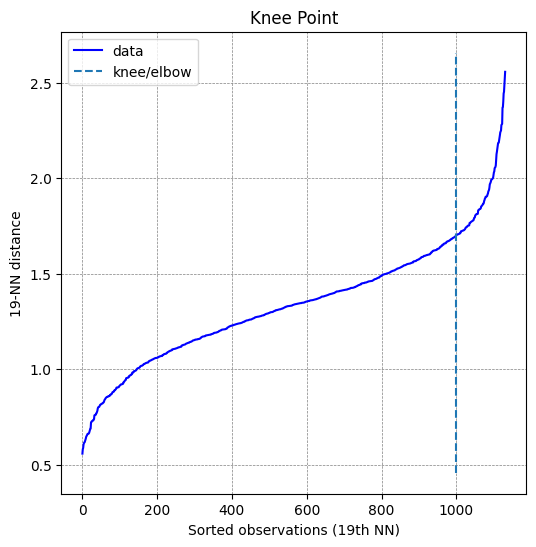

In [ ]:
eps_nat = nn_eps_finder(X_trasf,N) #You can see where the distance of the 19th starts increasing a lot

Now we run DBSCAN with the value of eps found above (1.7)

[0 2 1 ... 7 7 7]


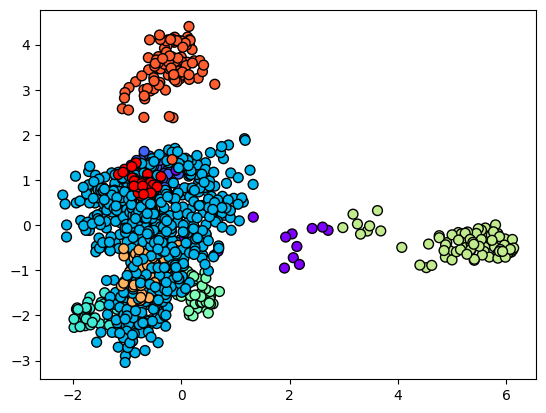

We find 8 clusters
the number of outliers is 18


In [ ]:

clustering = DBSCAN(eps=eps_nat, min_samples=N*2,n_jobs=-1).fit(X_trasf)
y_DBSCAN_nat = clustering.labels_
print(y_DBSCAN_nat)
plt.scatter(Xproj[:, 0], Xproj[:,1] , c=y_DBSCAN_nat, s=50, cmap='rainbow',edgecolor='black', linewidth=1);
plt.show()
print("We find " + str(np.max(y_DBSCAN_nat)+1)+" clusters")
print("the number of outliers is "+ str(len([i for i in y_DBSCAN_nat if i == -1])))


Let's analyze the clustering a l ittle bit better in particular we are interested in the population's fraction per cluster

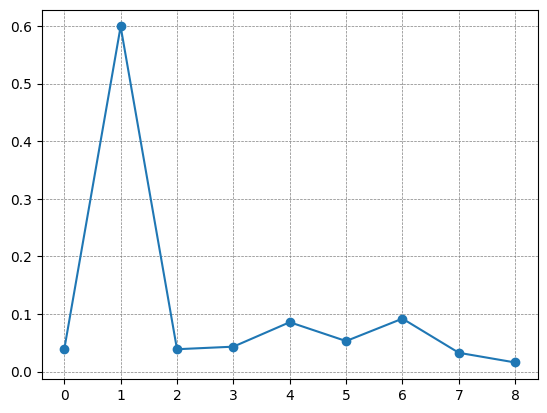

In [ ]:
#the last point is the noise, we represents the % of datapoints per cluster
hysto = np.zeros(np.max(y_DBSCAN_nat)+2)
for i in y_DBSCAN_nat:
  hysto[i] +=1
for i in range(np.max(y_DBSCAN_nat)+2):
  hysto[i] /= len(y_DBSCAN_nat)
plt.plot(hysto,'o-')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)

What we can see is that with DBSCAN we find that in a single cluster we approximatly the 60% of the points , this is an indication that DBSCAN may be finding degenerate clustering results and as suggested by [5] we should try to run again DBSCAN with smaller values of eps or to try a hierarchical approach such as OPTICS o HDBSCAN. In order to see if the big cluster is composed by smaller clusters if we increase the "sensibility" of the algorithm.

Firstly we run again DBSCAN with smaller values of eps. For the **NATURAL**

what we expect is an increase in the number of points classified as noise that we find and this makes more difficult the analysis of the results.

In [ ]:
y_DBSCAN_NAT = []
for eps in np.linspace(0.7,1.7,10,endpoint=False):
  clustering = DBSCAN(eps, min_samples=2*N,n_jobs=-1).fit(X_trasf)
  y_DBSCAN_NAT.append(clustering.labels_)

#print(y_DBSCAN)
#plt.scatter(Xproj[:, 0], Xproj[:,1] , c=y_DBSCAN, s=50, cmap='rainbow',edgecolor='black', linewidth=1);
#plt.show()
for i in range(len(y_DBSCAN_NAT)):
  print(f"With eps = {np.linspace(0.7,1.7,10,endpoint=False)[i]} we find {np.max(y_DBSCAN_NAT[i])+1} clusters + noise")

With eps = 0.7 we find 2 clusters + noise
With eps = 0.7999999999999999 we find 3 clusters + noise
With eps = 0.8999999999999999 we find 4 clusters + noise
With eps = 1.0 we find 9 clusters + noise
With eps = 1.1 we find 12 clusters + noise
With eps = 1.2 we find 13 clusters + noise
With eps = 1.3 we find 13 clusters + noise
With eps = 1.4 we find 11 clusters + noise
With eps = 1.5 we find 10 clusters + noise
With eps = 1.6 we find 8 clusters + noise


the fraction of outliers for eps= 0.7 is 0.9539823008849557 and it corresponds to 2 clusters
the fraction of outliers for eps= 0.7999999999999999 is 0.9256637168141593 and it corresponds to 3 clusters
the fraction of outliers for eps= 0.8999999999999999 is 0.8371681415929203 and it corresponds to 4 clusters
the fraction of outliers for eps= 1.0 is 0.7300884955752213 and it corresponds to 9 clusters
the fraction of outliers for eps= 1.1 is 0.552212389380531 and it corresponds to 12 clusters
the fraction of outliers for eps= 1.2 is 0.4168141592920354 and it corresponds to 13 clusters
the fraction of outliers for eps= 1.3 is 0.22300884955752212 and it corresponds to 13 clusters
the fraction of outliers for eps= 1.4 is 0.1 and it corresponds to 11 clusters
the fraction of outliers for eps= 1.5 is 0.06637168141592921 and it corresponds to 10 clusters
the fraction of outliers for eps= 1.6 is 0.023893805309734513 and it corresponds to 8 clusters
eps = 1.3 is good according to redflags in [5] 

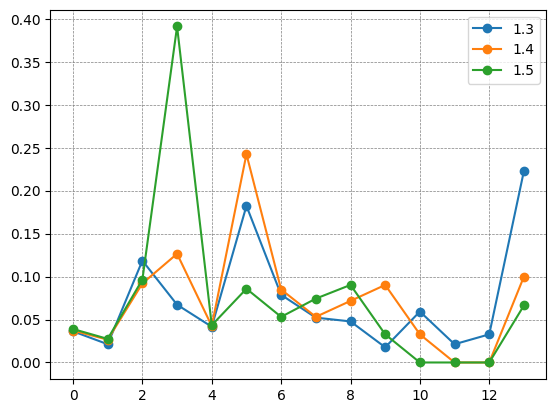

In [ ]:
hysto = np.zeros((10,14))
for i in range(len(y_DBSCAN_NAT)):
  for j in y_DBSCAN_NAT[i]:
    hysto[i,j] +=1
for i in range(10):
  for j in range(14):
    hysto[i,j] /= len(y_DBSCAN_NAT[i])
for i in range(10):

  print("the fraction of outliers for eps= "+ str(np.linspace(0.7,1.7,10,endpoint=False)[i]) +" is "+ str(hysto[i,-1])+" and it corresponds to "+str(np.max(y_DBSCAN_NAT[i])+1)+" clusters")


cond_for_good = np.zeros((10,2))
for i in range(10):
  if np.max(hysto[i,:-2]) < 0.5:
    cond_for_good[i,0] = 1
  if 0.01 < hysto[i,-1] < 0.3:
    cond_for_good[i,1] = 1
  if cond_for_good[i,0] == 1 and cond_for_good[i,1] == 1:
    print("eps = "+str(np.linspace(0.7,1.7,10,endpoint=False)[i])+" is good according to redflags in [5] and give k = "+ str(np.max(y_DBSCAN_NAT[i])+1))
    plt.plot(hysto[i],'o-', label=np.linspace(0.7,1.7,10,endpoint=False)[i])
    print(i)
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
print(f"eps_nat was {eps_nat}")

Experimenting with different values of eps, and taking into consideration the euristics for the detection of degenerate DBSCAN results as in [5] we find that eps between 1.3 and 1.5 included (as above) give good results suggesting a number of clusters between 10 and 12.

In [ ]:
eps_nat_tuned = 1.4
i_nat = 7

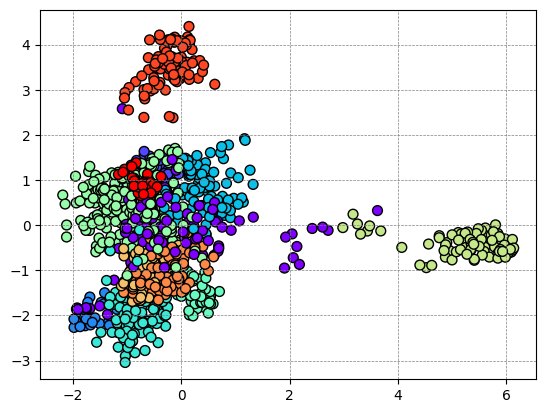

We find 11 clusters
The number of outliers is 113


In [ ]:
show_clustering(Xproj,y_DBSCAN_NAT[i_nat])

### Natural + artificial

In [ ]:
X_trasf_tot = pca.transform(X_tot)
print(np.sum(pca.explained_variance_ratio_))

0.24047064771468343


In [ ]:
print(np.shape(X_trasf_tot))

(2133, 10)


The estimatd value of eps 1.4364331790600464


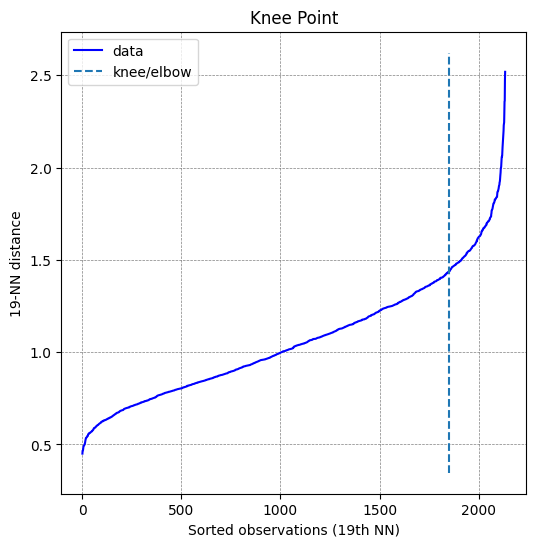

In [ ]:
eps_tot = nn_eps_finder(X_trasf_tot,N)

[ 0 -1  1 ...  8  3  3]


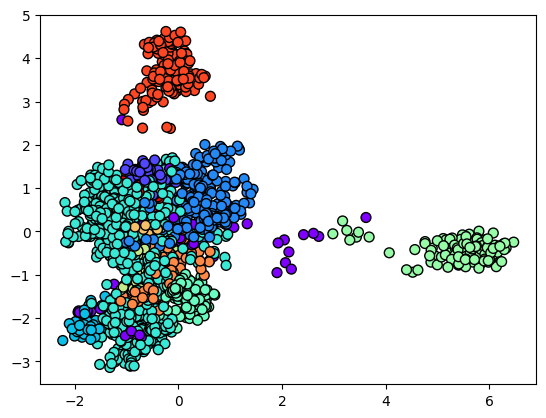

11 clusters
the numeber of outliers is 62


In [ ]:
from sklearn.cluster import DBSCAN
clustering = DBSCAN(eps=eps_tot, min_samples=20,n_jobs=-1).fit(X_trasf_tot)
y_DBSCAN_tot = clustering.labels_
print(y_DBSCAN_tot)
plt.scatter(X_trasf_tot[:, 0], X_trasf_tot[:,1] , c=y_DBSCAN_tot, s=50, cmap='rainbow',edgecolor='black', linewidth=1);
plt.show()
print(str(np.max(y_DBSCAN_tot)+1)+" clusters")
print("the numeber of outliers is "+ str(len([i for i in y_DBSCAN_tot if i == -1])))

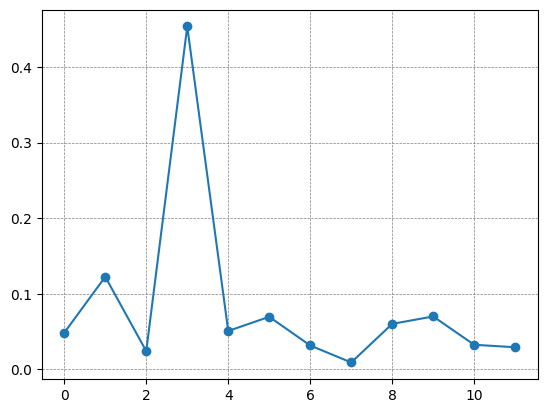

In [ ]:
hysto = np.zeros(np.max(y_DBSCAN_tot)+2)
for i in y_DBSCAN_tot:
  hysto[i] +=1
for i in range(np.max(y_DBSCAN_tot)+2):
  hysto[i] /= len(y_DBSCAN_tot)
plt.plot(hysto,'o-')
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)

In [ ]:
y_DBSCAN_TOT = []
for eps in np.linspace(0.7,1.7,10,endpoint=False):
  clustering = DBSCAN(eps, min_samples=2*N,n_jobs=-1).fit(X_trasf_tot)
  y_DBSCAN_TOT.append(clustering.labels_)

#print(y_DBSCAN)
#plt.scatter(Xproj[:, 0], Xproj[:,1] , c=y_DBSCAN, s=50, cmap='rainbow',edgecolor='black', linewidth=1);
#plt.show()
maxc = 0
for i in range(len(y_DBSCAN_TOT)):
  print(f"With eps = {np.linspace(0.7,1.7,10,endpoint=False)[i]} we find {np.max(y_DBSCAN_TOT[i])+1} clusters + noise")
  k = np.max(y_DBSCAN_TOT[i])+1
  if maxc < k+1:
    maxc = k+1

With eps = 0.7 we find 15 clusters + noise
With eps = 0.7999999999999999 we find 22 clusters + noise
With eps = 0.8999999999999999 we find 22 clusters + noise
With eps = 1.0 we find 18 clusters + noise
With eps = 1.1 we find 18 clusters + noise
With eps = 1.2 we find 14 clusters + noise
With eps = 1.3 we find 12 clusters + noise
With eps = 1.4 we find 11 clusters + noise
With eps = 1.5 we find 9 clusters + noise
With eps = 1.6 we find 8 clusters + noise


the fraction of outliers for eps= 0.7 is 0.7238631036099391 and it corresponds to 15 clusters
the fraction of outliers for eps= 0.7999999999999999 is 0.5405532114392874 and it corresponds to 22 clusters
the fraction of outliers for eps= 0.8999999999999999 is 0.4214721050164088 and it corresponds to 22 clusters
the fraction of outliers for eps= 1.0 is 0.3244256915142991 and it corresponds to 18 clusters
the fraction of outliers for eps= 1.1 is 0.18377871542428503 and it corresponds to 18 clusters
the fraction of outliers for eps= 1.2 is 0.12189404594467886 and it corresponds to 14 clusters
the fraction of outliers for eps= 1.3 is 0.0782934833567745 and it corresponds to 12 clusters
the fraction of outliers for eps= 1.4 is 0.03844350679793718 and it corresponds to 11 clusters
the fraction of outliers for eps= 1.5 is 0.01828410689170183 and it corresponds to 9 clusters
the fraction of outliers for eps= 1.6 is 0.010782934833567745 and it corresponds to 8 clusters
eps = 1.1 is good accordin

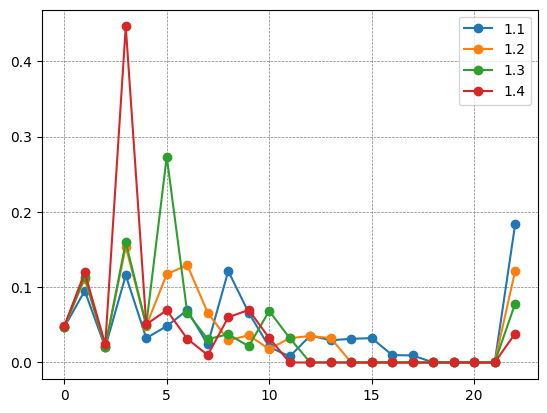

In [ ]:
hysto = np.zeros((10,maxc))
for i in range(len(y_DBSCAN_TOT)):
  for j in y_DBSCAN_TOT[i]:
    hysto[i,j] +=1
for i in range(10):
  for j in range(maxc):
    hysto[i,j] /= len(y_DBSCAN_TOT[i])
for i in range(10):
  print("the fraction of outliers for eps= "+ str(np.linspace(0.7,1.7,10,endpoint=False)[i]) +" is "+ str(hysto[i,-1])+" and it corresponds to "+str(np.max(y_DBSCAN_TOT[i])+1)+" clusters")


cond_for_good = np.zeros((10,2))
for i in range(10):
  if np.max(hysto[i,:-2]) < 0.5:
    cond_for_good[i,0] = 1
  if 0.01 < hysto[i,-1] < 0.3:
    cond_for_good[i,1] = 1
  if cond_for_good[i,0] == 1 and cond_for_good[i,1] == 1:
    print("eps = "+str(np.linspace(0.7,1.7,10,endpoint=False)[i])+" is good according to redflags in [5] and give k = "+ str(np.max(y_DBSCAN_TOT[i])+1))
    plt.plot(hysto[i],'o-', label=np.linspace(0.7,1.7,10,endpoint=False)[i])
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
plt.legend()
print(f"eps_nat was {eps_tot}")


In [ ]:
eps_tot_tuned = 1.2
i_tot = 5

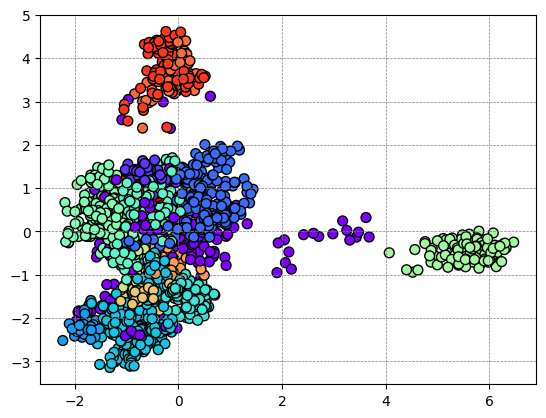

We find 14 clusters
The number of outliers is 260


In [ ]:
show_clustering(Xproj_tot,y_DBSCAN_TOT[i_tot])

### Natural Full dimensionality

With the data having all the features we cannot implement the heuristic procedure presented above and we cannot find any reasonable value of eps and MinPts giving non degenerate results.

In [ ]:
def nn_eps_finder_fd(X_trasf,minpts):
  from kneed import KneeLocator
  nbrs = NearestNeighbors(n_neighbors = minpts-1).fit(X_trasf)
  neigh_dist, neigh_ind = nbrs.kneighbors(X_trasf)
  sort_neigh_dist = np.sort(neigh_dist, axis = 0)

  k_dist = sort_neigh_dist[:, minpts-2]

  kneedle = KneeLocator(x = range(1, len(neigh_dist)+1), y = k_dist, S = 100, interp_method="polynomial", curve = "convex", direction = "increasing", online=True)
  print("The estimatd value of eps "+str(kneedle.knee_y))
  eps = kneedle.knee_y
  kneedle.plot_knee()
  plt.ylabel(f"{minpts-1}-NN distance")
  plt.xlabel(f"Sorted observations ({minpts-1}th NN)")
  plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
  plt.show()

  return eps

The estimatd value of eps 11.135528725660043


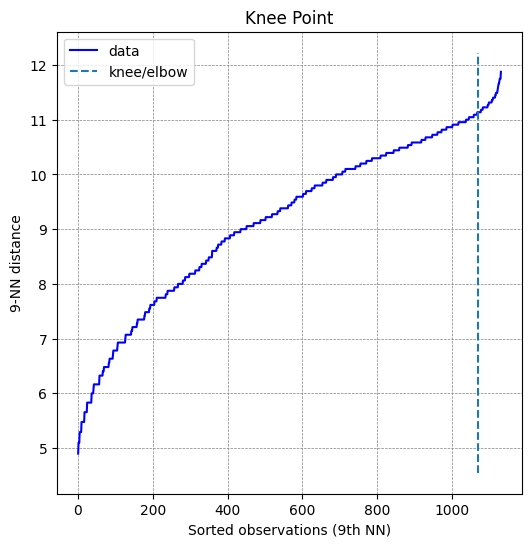

In [ ]:
minpts = 10
eps_full_nat = nn_eps_finder_fd(X,minpts)

[0 0 0 ... 1 1 1]


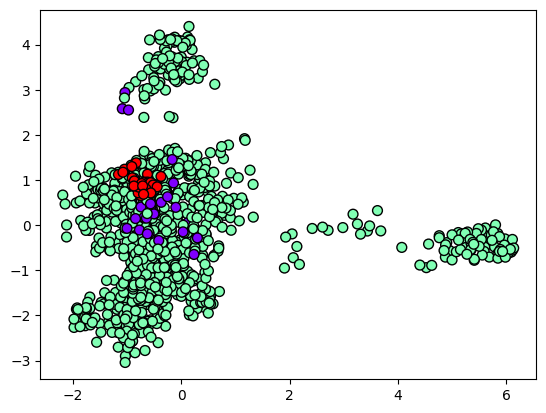

We find 2 clusters
the number of outliers is 30


In [ ]:
clustering = DBSCAN(eps=eps_full_nat, min_samples=minpts,n_jobs=-1).fit(X)
y_DBSCAN_nat_full = clustering.labels_
print(y_DBSCAN_nat_full)
plt.scatter(Xproj[:, 0], Xproj[:,1] , c=y_DBSCAN_nat_full, s=50, cmap='rainbow',edgecolor='black', linewidth=1);
plt.show()
print("We find " + str(np.max(y_DBSCAN_nat_full)+1)+" clusters")
print("the number of outliers is "+ str(len([i for i in y_DBSCAN_nat_full if i == -1])))

We procede as above: we lower eps

In [ ]:
y_DBSCAN_NAT_FULL = []
Neps = 15
epss = np.linspace(9.7,11,Neps,endpoint=False)
for eps in epss:
  clustering = DBSCAN(eps, min_samples=minpts,n_jobs=-1).fit(X)
  y_DBSCAN_NAT_FULL.append(clustering.labels_)

for i in range(len(y_DBSCAN_NAT_FULL)):
  print(f"With eps = {epss[i]} we find {np.max(y_DBSCAN_NAT_FULL[i])+1} clusters + noise")

With eps = 9.7 we find 22 clusters + noise
With eps = 9.786666666666665 we find 21 clusters + noise
With eps = 9.873333333333333 we find 20 clusters + noise
With eps = 9.959999999999999 we find 20 clusters + noise
With eps = 10.046666666666667 we find 19 clusters + noise
With eps = 10.133333333333333 we find 17 clusters + noise
With eps = 10.219999999999999 we find 17 clusters + noise
With eps = 10.306666666666667 we find 15 clusters + noise
With eps = 10.393333333333333 we find 12 clusters + noise
With eps = 10.48 we find 11 clusters + noise
With eps = 10.566666666666666 we find 11 clusters + noise
With eps = 10.653333333333332 we find 5 clusters + noise
With eps = 10.74 we find 3 clusters + noise
With eps = 10.826666666666666 we find 3 clusters + noise
With eps = 10.913333333333334 we find 2 clusters + noise


the fraction of outliers for eps= 9.7 is 0.37256637168141593 and it corresponds to 22 clusters
the fraction of outliers for eps= 9.786666666666665 is 0.35575221238938054 and it corresponds to 21 clusters
the fraction of outliers for eps= 9.873333333333333 is 0.3274336283185841 and it corresponds to 20 clusters
the fraction of outliers for eps= 9.959999999999999 is 0.29557522123893804 and it corresponds to 20 clusters
the fraction of outliers for eps= 10.046666666666667 is 0.27876106194690264 and it corresponds to 19 clusters
the fraction of outliers for eps= 10.133333333333333 is 0.2424778761061947 and it corresponds to 17 clusters
the fraction of outliers for eps= 10.219999999999999 is 0.21238938053097345 and it corresponds to 17 clusters
the fraction of outliers for eps= 10.306666666666667 is 0.18849557522123894 and it corresponds to 15 clusters
the fraction of outliers for eps= 10.393333333333333 is 0.1584070796460177 and it corresponds to 12 clusters
the fraction of outliers for ep

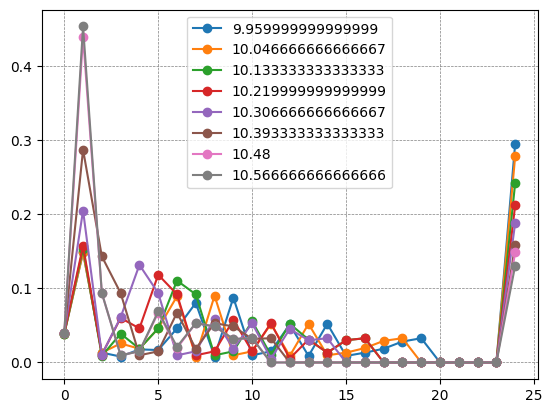

In [ ]:
N_max = 25
hysto = np.zeros((Neps,N_max))
for i in range(len(y_DBSCAN_NAT_FULL)):
  for j in y_DBSCAN_NAT_FULL[i]:
    hysto[i,j] +=1
for i in range(Neps):
  for j in range(N_max):
    hysto[i,j] /= len(y_DBSCAN_NAT_FULL[i])
for i in range(Neps):

  print("the fraction of outliers for eps= "+ str(epss[i]) +" is "+ str(hysto[i,-1])+" and it corresponds to "+str(np.max(y_DBSCAN_NAT_FULL[i])+1)+" clusters")


cond_for_good = np.zeros((Neps,2))
for i in range(Neps):
  if np.max(hysto[i,:-2]) < 0.5:
    cond_for_good[i,0] = 1
  if 0.01 < hysto[i,-1] < 0.3:
    cond_for_good[i,1] = 1
  if cond_for_good[i,0] == 1 and cond_for_good[i,1] == 1:
    print("eps = "+str(epss[i])+" is good according to redflags in [5] and give k = "+ str(np.max(y_DBSCAN_NAT_FULL[i])+1))
    plt.plot(hysto[i], 'o-', label=epss[i])
    print(i)
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
print(f"eps_full was {eps_full_nat}")

In [ ]:
i_nat_full = 10

We decide to keep the results of eps = 10.56 because the number of points classified as noise is the smallest.

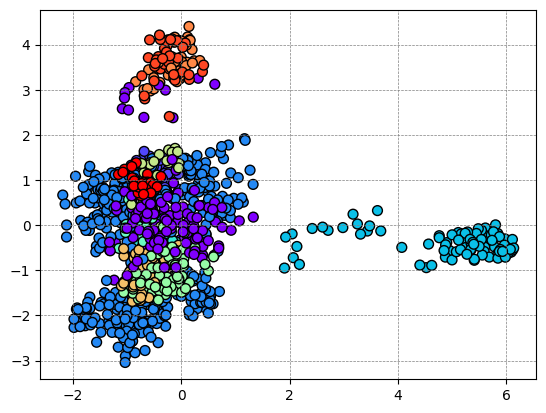

We find 11 clusters
The number of outliers is 148


In [ ]:
show_clustering(Xproj,y_DBSCAN_NAT_FULL[i_nat_full])

### Natural + artificial full dimensionality

The estimatd value of eps 7.615773105863909


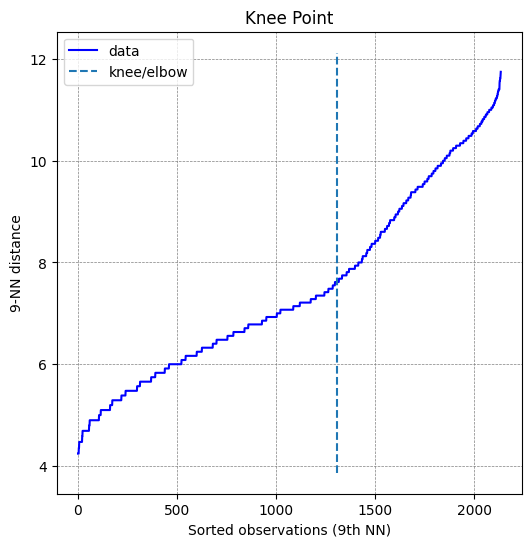

In [ ]:
minpts = 10
eps_full_tot = nn_eps_finder_fd(X_tot,minpts)

[ 0  1  2 ... 27 16 29]


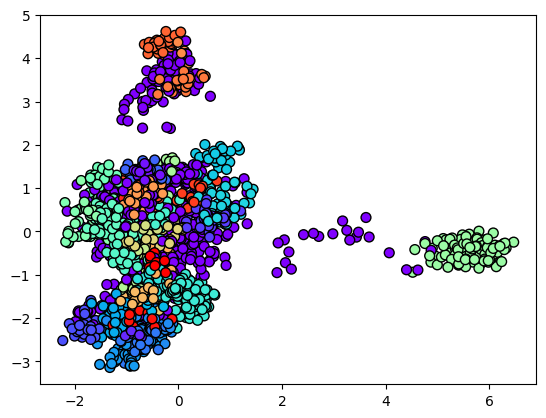

We find 38 clusters
the number of outliers is 710


In [ ]:
clustering = DBSCAN(eps=eps_full_tot, min_samples=minpts,n_jobs=-1).fit(X_tot)
y_DBSCAN_nat_full = clustering.labels_
print(y_DBSCAN_nat_full)
plt.scatter(Xproj_tot[:, 0], Xproj_tot[:,1] , c=y_DBSCAN_nat_full, s=50, cmap='rainbow',edgecolor='black', linewidth=1);
plt.show()
print("We find " + str(np.max(y_DBSCAN_nat_full)+1)+" clusters")
print("the number of outliers is "+ str(len([i for i in y_DBSCAN_nat_full if i == -1])))

We try higher values of eps this time

In [ ]:
y_DBSCAN_TOT_FULL = []
Neps = 15
epss = np.linspace(7.5,11,Neps,endpoint=False)
for eps in epss:
  clustering = DBSCAN(eps, min_samples=minpts,n_jobs=-1).fit(X_tot)
  y_DBSCAN_TOT_FULL.append(clustering.labels_)

for i in range(len(y_DBSCAN_TOT_FULL)):
  print(f"With eps = {epss[i]} we find {np.max(y_DBSCAN_TOT_FULL[i])+1} clusters + noise")

With eps = 7.5 we find 40 clusters + noise
With eps = 7.733333333333333 we find 38 clusters + noise
With eps = 7.966666666666667 we find 38 clusters + noise
With eps = 8.2 we find 38 clusters + noise
With eps = 8.433333333333334 we find 37 clusters + noise
With eps = 8.666666666666666 we find 35 clusters + noise
With eps = 8.9 we find 34 clusters + noise
With eps = 9.133333333333333 we find 31 clusters + noise
With eps = 9.366666666666667 we find 28 clusters + noise
With eps = 9.6 we find 24 clusters + noise
With eps = 9.833333333333334 we find 20 clusters + noise
With eps = 10.066666666666666 we find 18 clusters + noise
With eps = 10.3 we find 9 clusters + noise
With eps = 10.533333333333333 we find 6 clusters + noise
With eps = 10.766666666666666 we find 2 clusters + noise


the fraction of outliers for eps= 7.5 is 0.3398968588842007 and it corresponds to 40 clusters
the fraction of outliers for eps= 7.733333333333333 is 0.326769807782466 and it corresponds to 38 clusters
the fraction of outliers for eps= 7.966666666666667 is 0.29582747304266294 and it corresponds to 38 clusters
the fraction of outliers for eps= 8.2 is 0.27379278012189406 and it corresponds to 38 clusters
the fraction of outliers for eps= 8.433333333333334 is 0.2587904360056259 and it corresponds to 37 clusters
the fraction of outliers for eps= 8.666666666666666 is 0.23863103609939054 and it corresponds to 35 clusters
the fraction of outliers for eps= 8.9 is 0.22456633849038912 and it corresponds to 34 clusters
the fraction of outliers for eps= 9.133333333333333 is 0.1992498827941866 and it corresponds to 31 clusters
the fraction of outliers for eps= 9.366666666666667 is 0.17393342709798407 and it corresponds to 28 clusters
the fraction of outliers for eps= 9.6 is 0.13830285982184717 and i

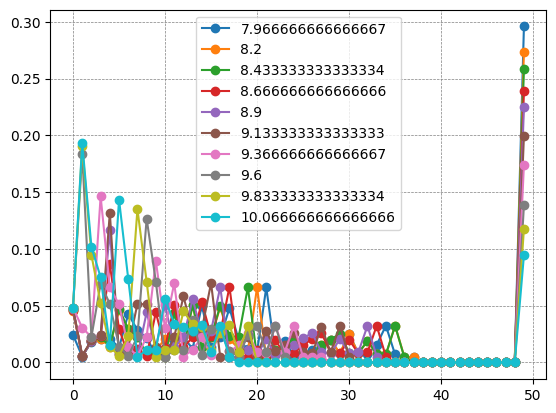

In [ ]:
N_max = 50
hysto = np.zeros((Neps,N_max))
for i in range(len(y_DBSCAN_TOT_FULL)):
  for j in y_DBSCAN_TOT_FULL[i]:
    hysto[i,j] +=1
for i in range(Neps):
  for j in range(N_max):
    hysto[i,j] /= len(y_DBSCAN_TOT_FULL[i])
for i in range(Neps):

  print("the fraction of outliers for eps= "+ str(epss[i]) +" is "+ str(hysto[i,-1])+" and it corresponds to "+str(np.max(y_DBSCAN_TOT_FULL[i])+1)+" clusters")


cond_for_good = np.zeros((Neps,2))
for i in range(Neps):
  if np.max(hysto[i,:-2]) < 0.5:
    cond_for_good[i,0] = 1
  if 0.01 < hysto[i,-1] < 0.3:
    cond_for_good[i,1] = 1
  if cond_for_good[i,0] == 1 and cond_for_good[i,1] == 1:
    print("eps = "+str(epss[i])+" is good according to redflags in [5] and give k = "+ str(np.max(y_DBSCAN_TOT_FULL[i])+1))
    plt.plot(hysto[i], 'o-', label=epss[i])
    print(i)
plt.legend()
plt.grid(True, which='both', linestyle='--', linewidth=0.5, color='gray', zorder=0)
print(f"eps_full was {eps_full_tot}")

In [ ]:
i_tot_full = 11

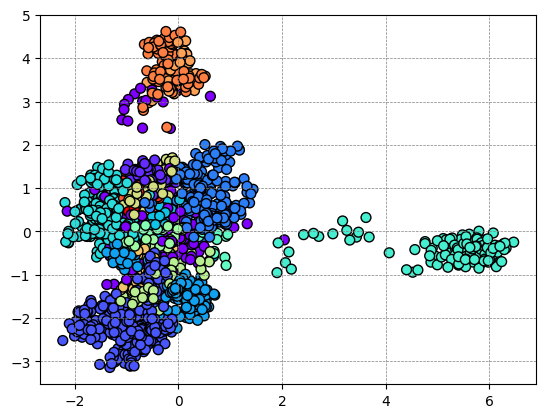

We find 18 clusters
The number of outliers is 201


In [ ]:
show_clustering(Xproj_tot,y_DBSCAN_TOT_FULL[i_tot_full])

## Fast density peak search


In [ ]:
from numpy.linalg import norm

In [ ]:
def DPA(X_trasf,factor):
  N = len(X_trasf)
  dist = np.zeros((N,N))
  for i in range(N):
    for j in range(N):
      if i!=j:
        dist[i,j] = norm(X_trasf[i,:]-X_trasf[j,:])

  max_dist = np.max(dist)
  print(max_dist)

  sigma=max_dist/factor
  densities=[np.sum(np.exp(dist[i]**2/2/sigma**2)) for i in range(np.shape(dist)[0])]

  argsort = np.argsort(densities)
  dens_sort = np.sort(densities)

  di = []
  for i in range(len(argsort)):
    prov = [0,max_dist+1]
    lui = densities[argsort[i]]
    for elm in argsort[i+1:]:
      if densities[elm] > lui:
        if dist[elm,argsort[i]] < prov[1]:
          prov = [elm, dist[elm,argsort[i]]]
    di.append(prov)

  di = np.array(di)
  return np.array(np.vstack((dens_sort,di[:,1],argsort)))

In [ ]:
DPA_data = []
factor = 5
for n in [10, 20]:
  pca = PCA(n_components=n)
  X_trasf = pca.fit_transform(X)
  DPA_data.append(DPA(X_trasf,factor))
DPA_data = np.array(DPA_data)
np.shape(DPA_data)

10.340568176701584
11.13379758725462


(2, 3, 1130)

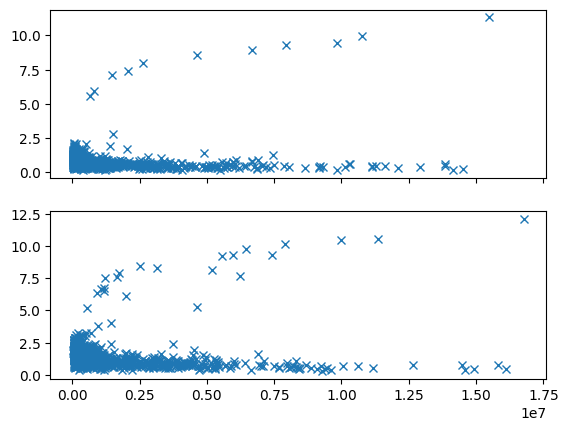

In [ ]:
fig, (ax0, ax1,) = plt.subplots(2, sharex=True)
ax0.plot(DPA_data[0,0,:],DPA_data[0,1,:], 'x')
ax1.plot(DPA_data[1,0,:],DPA_data[1,1,:], 'x')
#Plot with ten dimensions and 20 dimensions


Text(0.5, 1.0, 'DPA with 10 pricipal components')

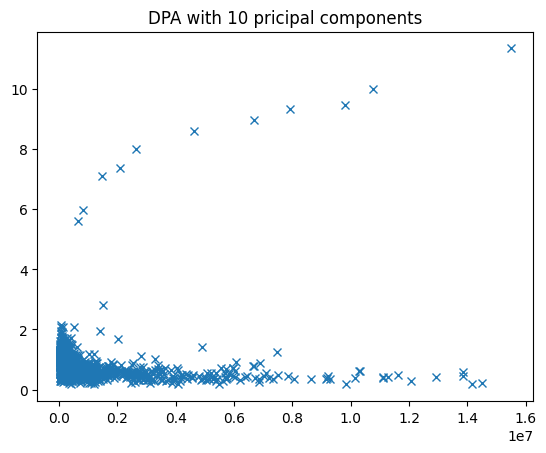

In [ ]:
plt.plot(DPA_data[0,0,:],DPA_data[0,1,:], 'x')
plt.title("DPA with 10 pricipal components")

In [ ]:
DPA_data_10 = DPA_data[0,:,:]
np.shape(DPA_data_10)
print(np.max(DPA_data_10[1,:]))

11.340568176701584


In [ ]:
peaks = []
print(np.shape(DPA_data_10[1,:]))
for i in range(len(DPA_data_10[1,:])):
  if DPA_data_10[1,i] > 4:
    peaks.append([DPA_data_10[2,i], DPA_data_10[1,i]])
k_DPA = len(peaks)
print(peaks)
peaks = np.array(peaks)
i_peaks = peaks[:,0]

(1130,)
[[516.0, 5.5920038292427945], [110.0, 5.973677992619633], [261.0, 7.086301332629193], [1036.0, 7.376964543188684], [872.0, 8.004929299444338], [0.0, 8.60405502469302], [654.0, 8.946801164851353], [752.0, 9.337340636675098], [42.0, 9.45042939863075], [338.0, 9.972943981676746], [1120.0, 11.340568176701584]]


In [ ]:
X_peaks=[]
for i in i_peaks:
  ii = int(i)
  X_peaks.append(X[ii,:])
X_peaks = np.array(X_peaks)

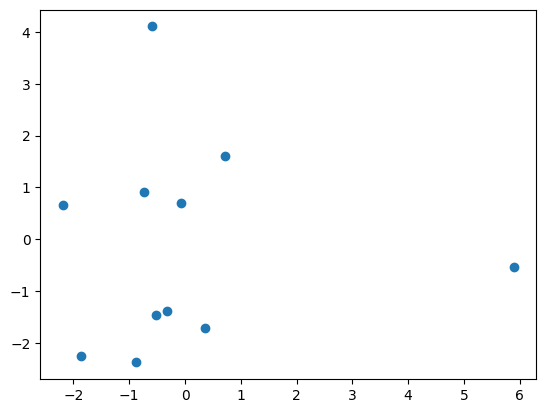

In [ ]:
pca10 = PCA(n_components=10)
pca10.fit(X)
peaks_trasf = pca10.transform(X_peaks)
plt.scatter(peaks_trasf[:,0], peaks_trasf[:,1])

Text(0.5, 1.0, 'DPA with 20 pricipal components')

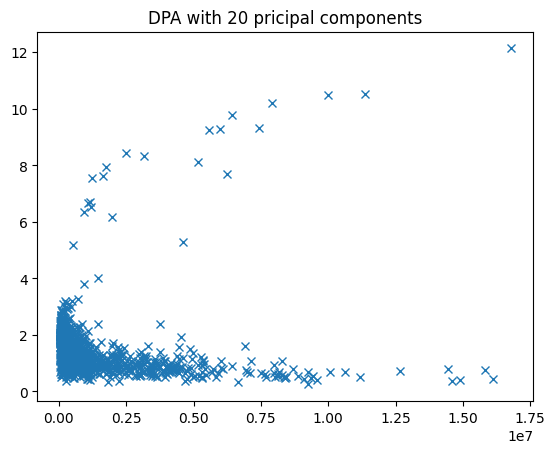

In [ ]:
plt.plot(DPA_data[1,0,:],DPA_data[1,1,:], 'x')
plt.title("DPA with 20 pricipal components")

In [ ]:
DPA_data_iso = []
factor = 5
for n in [10, 20, 50, 100, 200]:
  DPA_data_iso.append(DPA(X_transformed_iso[:,0:N],factor))


29.809546795046828
29.809546795046828
29.809546795046828
29.809546795046828
29.809546795046828


In [ ]:
DPA_data_iso = np.array(DPA_data_iso)

Text(0.5, 1.0, 'DPA with 20 pricipal components')

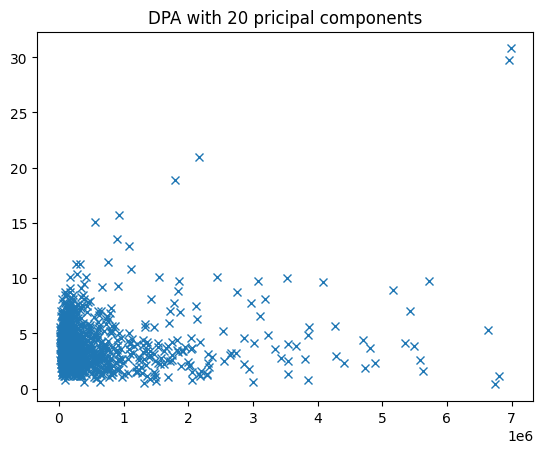

In [ ]:
plt.plot(DPA_data_iso[4,0,:],DPA_data_iso[4,1,:], 'x')
plt.title("DPA with 20 pricipal components")

DPA non sembra dare risultati significativi

## **AGGLOMERATIVE**

We first try agglomerative clustering techniques with ward's linkage and we compare the data with the kmeans


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.metrics import silhouette_score
import scipy.cluster.hierarchy as shc

In [ ]:
plt.figure(figsize =(8, 8))
plt.title('Dendogram')
Dendrogram = shc.dendrogram((shc.linkage(X, method ='ward')))

In [ ]:
ac = []
for i in range(2,16):
  ac.append(AgglomerativeClustering(n_clusters = i).fit_predict(X))

fig, (ax2, ax3, ax4, ax5, ax6, ax7, ax8, ax9, ax10, ax11, ax12, ax13, ax14, ax15) = plt.subplots(nrows=14, ncols=1,figsize=(10,80))
ax2.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[0], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax3.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[1], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax4.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[2], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax5.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[3], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax6.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[4], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax7.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[5], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax8.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[6], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax9.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[7], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax10.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[8], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax11.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[9], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax12.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[10], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax13.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[11], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax14.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[12], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
ax15.scatter(Xproj[:, 0], Xproj[:,1] , c=ac[13], s=50, cmap='rainbow',edgecolor='black', linewidth=1);
fig.show()

## **Understanding separation**

Natural vs Artificial

In [ ]:
nat_art = np.zeros(len(X_tot))
for i in range(len(X_tot)):
  if i < len(X):
    nat_art[i] += 1
#plt.scatter(X_trasf_tot[:, 0], X_trasf_tot[:,1] , c=nat_art, s=25, cmap='rainbow',edgecolor='black', linewidth=1);
#plt.show()

Functional and non-functional

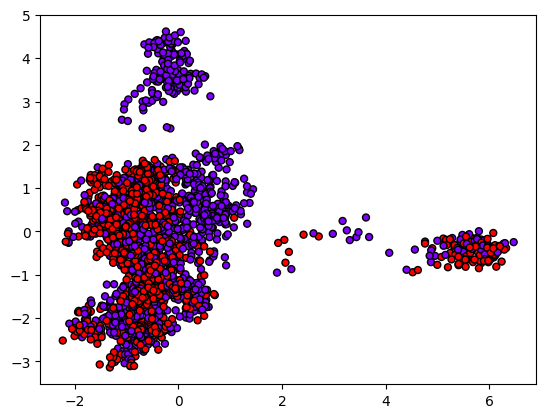

In [ ]:
Y_tot = np.hstack((Y,Y_art))
plt.scatter(X_trasf_tot[:, 0], X_trasf_tot[:,1] , c=Y_tot, s=25, cmap='rainbow',edgecolor='black', linewidth=1);
plt.show()

In [ ]:
print(nat_art) # nat = 1 art = 0
print(Y_tot) # functionality
print(len(Y))
print(len(nat_art))
print(len(Y_tot))

print(len(y_DBSCAN_TOT[i_tot]))
print(len(y_means_nat_MI))
print(len(y_means_nat_scree))
print(len(y_means_tot_MI))
print(len(y_means_tot_scree))

print(len(y_DBSCAN_NAT[i_nat]))
print(len(y_DBSCAN_TOT[i_tot]))
print(len(y_DBSCAN_NAT_FULL[i_nat_full]))
print(len(y_DBSCAN_TOT_FULL[i_tot_full]))

[1. 1. 1. ... 0. 0. 0.]
[1 0 0 ... 1 1 1]
1130
2133
2133
2133
1130
1130
2133
2133
1130
2133
1130
2133


In [ ]:
def separation_entropy(y,sep): #Compute entropy bernoull

  start = min(y)
  stop = max(y)+1

  if start == -1:
    lista = []
    for i in range(start,stop):
      n = 0
      lista.append([0,0])
      for j in range(len(y)):
        if y[j] == i:
          n += 1
          if sep[j] == 0:
            lista[i+1][0] += 1
          else:
            lista[i+1][1] += 1
      lista[i+1][0]/=n
      lista[i+1][1]/=n
  if start == 0:
    lista = []
    for i in range(start,stop):
      n = 0
      lista.append([0,0])
      for j in range(len(y)):
        if y[j] == i:
          n += 1
          if sep[j] == 0:
            lista[i][0] += 1
          else:
            lista[i][1] += 1
      lista[i][0]/=n
      lista[i][1]/=n
  #print("n last is "+str(i))
  #print(lista)
  #print(len(lista) == stop-start)
  #print(len(lista))
  H = []
  for elm in lista:
    if elm[0] == 0 or elm[0] == 1:
      H.append(0)
    else:
      H.append(-elm[0]*np.log(elm[0])-elm[1]*np.log(elm[1]))
  return H



#print(sum(separation_entropy(y_means,np.ones(100))))



In [ ]:
def tot_score(H,lista): #H(X|Y) wherte Y is the cluster number, X takes value for functional and non-functional
  tot_score = 0
  for i in range(len(H)):
    tot_score += H[i]*lista[i][3]
  return tot_score


In [ ]:
def clusters_details(y,sep):

  start = min(y)
  stop = max(y)+1

  if start == -1:
    lista = []

    for i in range(start,stop):
      n = 0
      lista.append([0,0,[]])
      for j in range(len(y)):
        if y[j] == i:
          n += 1
          if sep[j] == 0:
            lista[i+1][0] += 1
          else:
            lista[i+1][1] += 1
          lista[i+1][2].append(j)
      lista[i+1].append(n/len(y))
      lista[i+1][0]/=n
      lista[i+1][1]/=n
  if start == 0:
    lista = []
    for i in range(start,stop):
      n = 0
      lista.append([0,0,[]])
      for j in range(len(y)):
        if y[j] == i:
          n += 1
          if sep[j] == 0:
            lista[i][0] += 1
          else:
            lista[i][1] += 1
          lista[i][2].append(j)
      lista[i].append(n/len(y))
      lista[i][0]/=n
      lista[i][1]/=n
  return lista

In [ ]:
def analyze_nat(y_cluster, y_true, name_title):

  H_func = separation_entropy(y_cluster, y_true)
  max_ent_func = np.log(2)*np.ones(len(H_func))
  fig, (ax1) = plt.subplots(1, 1, sharex=True)

  line1, = ax1.plot(H_func,label="func_nonFunc")
  line2, = ax1.plot(max_ent_func,label="log2")

  ax1.set_title('functional vs non functional '+name_title)

  ax1.legend(handles=[line1, line2], loc='upper right')

  plt.tight_layout()

  plt.show()

  print(str(len([i for i in H_func if i == 0]))+" clusters are completly separated")

  if -1 in y_cluster:
    lista = clusters_details(y_cluster, y_true)
    print(f"Noise fraction nf:{lista[0][0]}, f:{lista[0][1]}, weight = {lista[0][3]}")
    for i in range(1,len(lista)):
      print(f"cluster {i} fraction nf:{lista[i][0]}, f:{lista[i][1]}, weight = {lista[i][3]}")
  else:
    lista = clusters_details(y_cluster, y_true)
    for i in range(0,len(lista)):
      print(f"cluster {i} fraction nf:{lista[i][0]}, f:{lista[i][1]}, weight = {lista[i][3]}")
  return lista, H_func

### Functionality predictions from the natural sequences

**DBSCAN**


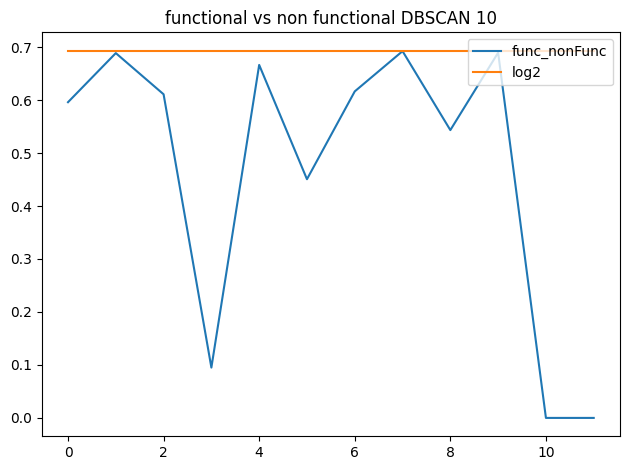

2 clusters are completly separated
Noise fraction nf:0.7168141592920354, f:0.2831858407079646, weight = 0.1
cluster 1 fraction nf:0.4523809523809524, f:0.5476190476190477, weight = 0.03716814159292035
cluster 2 fraction nf:0.7, f:0.3, weight = 0.02654867256637168
cluster 3 fraction nf:0.9807692307692307, f:0.019230769230769232, weight = 0.0920353982300885
cluster 4 fraction nf:0.6153846153846154, f:0.38461538461538464, weight = 0.12654867256637167
cluster 5 fraction nf:0.8333333333333334, f:0.16666666666666666, weight = 0.04247787610619469
cluster 6 fraction nf:0.30656934306569344, f:0.6934306569343066, weight = 0.2424778761061947
cluster 7 fraction nf:0.5208333333333334, f:0.4791666666666667, weight = 0.08495575221238938
cluster 8 fraction nf:0.7666666666666667, f:0.23333333333333334, weight = 0.05309734513274336
cluster 9 fraction nf:0.4567901234567901, f:0.5432098765432098, weight = 0.07168141592920355
cluster 10 fraction nf:1.0, f:0.0, weight = 0.09026548672566372
cluster 11 fracti

In [ ]:
lista_DB_10, H_func_DB10 = analyze_nat(y_DBSCAN_NAT[i_nat], Y,"DBSCAN 10")

In [ ]:
tot_score_DB10 = tot_score(H_func_DB10, lista_DB_10)
print(f"DBSCAN with 10 dimesions give a score of {tot_score_DB10}")

DBSCAN with 10 dimesions give a score of 0.5001303150419192


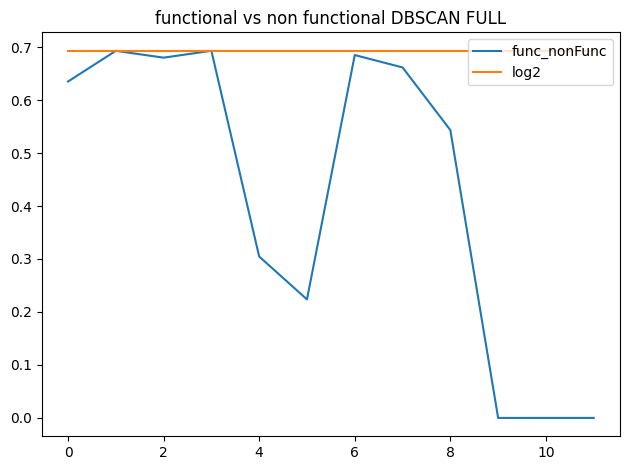

3 clusters are completly separated
Noise fraction nf:0.668918918918919, f:0.3310810810810811, weight = 0.13097345132743363
cluster 1 fraction nf:0.4888888888888889, f:0.5111111111111111, weight = 0.03982300884955752
cluster 2 fraction nf:0.580896686159844, f:0.4191033138401559, weight = 0.4539823008849557
cluster 3 fraction nf:0.5094339622641509, f:0.49056603773584906, weight = 0.09380530973451327
cluster 4 fraction nf:0.09090909090909091, f:0.9090909090909091, weight = 0.009734513274336283
cluster 5 fraction nf:0.9411764705882353, f:0.058823529411764705, weight = 0.01504424778761062
cluster 6 fraction nf:0.4358974358974359, f:0.5641025641025641, weight = 0.06902654867256637
cluster 7 fraction nf:0.375, f:0.625, weight = 0.021238938053097345
cluster 8 fraction nf:0.7666666666666667, f:0.23333333333333334, weight = 0.05309734513274336
cluster 9 fraction nf:1.0, f:0.0, weight = 0.048672566371681415
cluster 10 fraction nf:1.0, f:0.0, weight = 0.03185840707964602
cluster 11 fraction nf:1.0

In [ ]:
lista_DB_FULL, H_func_DB_FULL = analyze_nat(y_DBSCAN_NAT_FULL[i_nat_full], Y,"DBSCAN FULL")

<ipython-input-129-694c7c46b563>:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  line1 = plt.bar([1,2,3,4,5,6,7,8,9,10,11,12], np.sort(H_func)[::-1],width=np.array(lista_DB_FULL)[:,3])
<ipython-input-129-694c7c46b563>:14: UserWarning: The label '_container0' of <BarContainer object of 12 artists> starts with '_'. It is thus excluded from the legend.
  plt.legend(handles=[line1, line2, line3], loc='lower right')


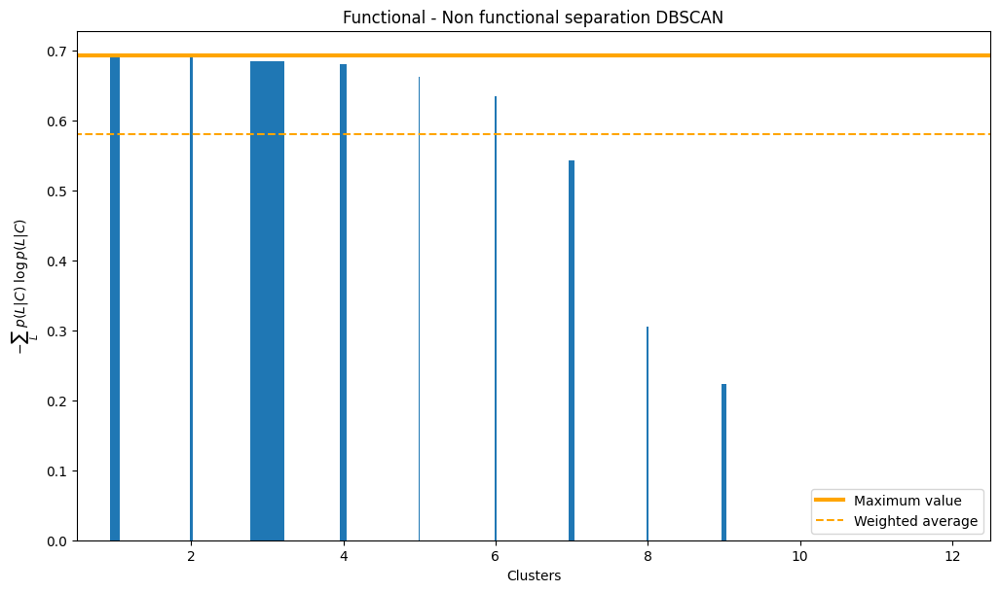

3 clusters are completly separated
Noise fraction nf:0.668918918918919, f:0.3310810810810811, weight = 0.13097345132743363
cluster 1 fraction nf:0.4888888888888889, f:0.5111111111111111, weight = 0.03982300884955752
cluster 2 fraction nf:0.580896686159844, f:0.4191033138401559, weight = 0.4539823008849557
cluster 3 fraction nf:0.5094339622641509, f:0.49056603773584906, weight = 0.09380530973451327
cluster 4 fraction nf:0.09090909090909091, f:0.9090909090909091, weight = 0.009734513274336283
cluster 5 fraction nf:0.9411764705882353, f:0.058823529411764705, weight = 0.01504424778761062
cluster 6 fraction nf:0.4358974358974359, f:0.5641025641025641, weight = 0.06902654867256637
cluster 7 fraction nf:0.375, f:0.625, weight = 0.021238938053097345
cluster 8 fraction nf:0.7666666666666667, f:0.23333333333333334, weight = 0.05309734513274336
cluster 9 fraction nf:1.0, f:0.0, weight = 0.048672566371681415
cluster 10 fraction nf:1.0, f:0.0, weight = 0.03185840707964602
cluster 11 fraction nf:1.0

In [ ]:
  name_title='Functional - Non functional separation DBSCAN'
  y_cluster = y_DBSCAN_NAT_FULL[i_nat_full]
  y_true=Y
  H_func = separation_entropy(y_cluster, y_true)
  max_ent_func = np.log(2)*np.ones(len(H_func)+2)

  plt.figure(figsize=(10, 6))
  line1 = plt.bar([1,2,3,4,5,6,7,8,9,10,11,12], np.sort(H_func)[::-1],width=np.array(lista_DB_FULL)[:,3])
  line2, = plt.plot([-1,12.5], [np.log(2), np.log(2)], c='orange', linewidth=3, label='Maximum value')
  line3, = plt.plot([-1,12.5], [0.58, 0.58],'--', c='orange', label='Weighted average')

  plt.title(name_title)
  plt.xlim(0.5,12.5)
  plt.legend(handles=[line1, line2, line3], loc='lower right')

  #plt.text(7, 0.6, 'H[L|C]=0.515', fontsize=14)
  plt.tight_layout()
  plt.xlabel('Clusters')
  plt.ylabel(r'$-\sum_{L} \ p(L|C) \ \log p(L|C)$')
  plt.savefig('functionalsep_DB.png',bbox_inches='tight')
  plt.show()

  print(str(len([i for i in H_func if i == 0]))+" clusters are completly separated")

  if -1 in y_cluster:
    lista = clusters_details(y_cluster, y_true)
    print(f"Noise fraction nf:{lista[0][0]}, f:{lista[0][1]}, weight = {lista[0][3]}")
    for i in range(1,len(lista)):
      print(f"cluster {i} fraction nf:{lista[i][0]}, f:{lista[i][1]}, weight = {lista[i][3]}")
  else:
    lista = clusters_details(y_cluster, y_true)
    for i in range(0,len(lista)):
      print(f"cluster {i} fraction nf:{lista[i][0]}, f:{lista[i][1]}, weight = {lista[i][3]}")

[943, 952, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 998, 1000, 1001, 1008, 1023, 1024, 1025, 1026, 1027, 1007, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1049, 1050, 1051, 1091, 1092, 1093, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1127, 1128, 1129]


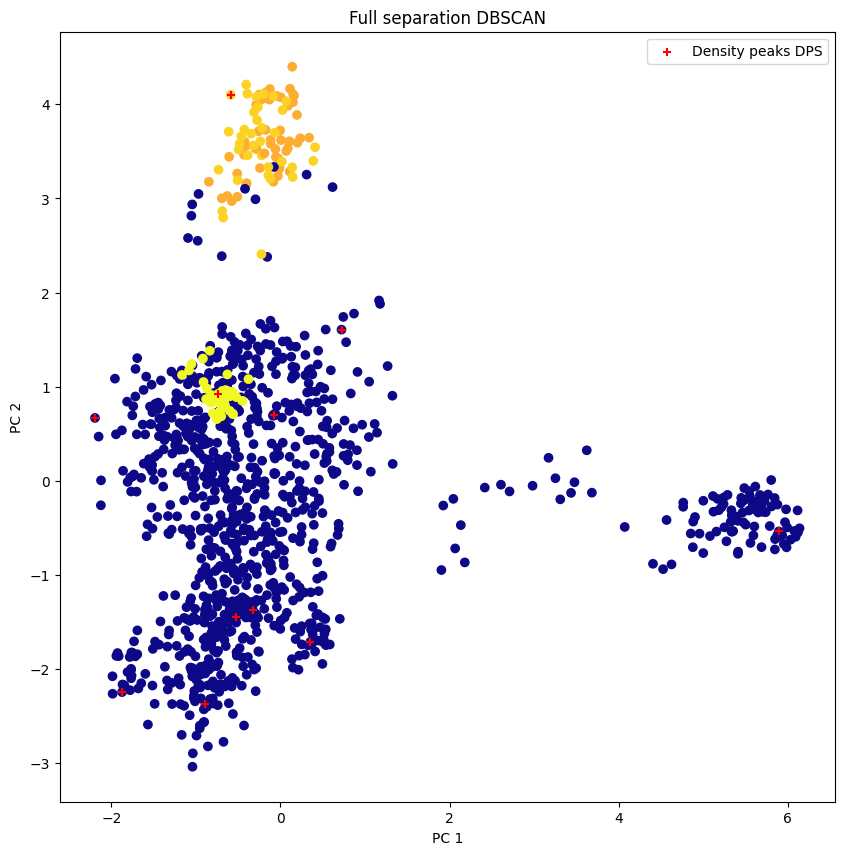

In [ ]:
non_func_DB = []
sep = np.zeros(X.shape[0])
for i in range(len(lista)):
  if lista[i][0] == 1 or lista[i][1] == 1:
    for elm in lista[i][2]:
      sep[elm] = i
      non_func_DB.append(elm)
print(non_func_DB)
sep_bool = sep.astype(bool)

plt.figure(figsize=(10,10))
plt.scatter(Xproj[:,0], Xproj[:,1], c=sep, cmap='plasma' , alpha=1)
plt.scatter(peaks_trasf[:,0], peaks_trasf[:,1], c="r", marker='+', label="Density peaks DPS")
plt.legend()
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('Full separation DBSCAN')
plt.savefig('fullSEP_DB_2d.png')

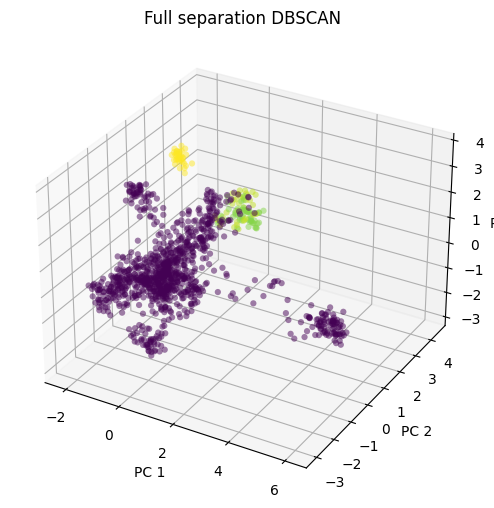

In [ ]:
plt.figure(figsize=(6,10))
ax2 = plt.axes(projection='3d')
ax2.scatter3D(Xproj[:, 0], Xproj[:,1], Xproj[:, 2], c=sep, edgecolor='none', alpha=0.5,
            )
ax2.set_xlabel('PC 1')
ax2.set_ylabel('PC 2')
ax2.set_zlabel('PC 3')
plt.title('Full separation DBSCAN')
plt.savefig('separation_DB_3d.png')

In [ ]:
lista = clusters_details(y_cluster, y_true)
tot_sep = 0
for i in range(0,len(lista)):
  if lista[i][0] == 1 or lista[i][1] == 1:
    tot_sep+=lista[i][3]

print(tot_sep)

0.11327433628318584


In [ ]:
tot_score_DB_FULL = tot_score(H_func_DB_FULL, lista_DB_FULL)
print(f"DBSCAN on FULL dimensionality give a score of {tot_score_DB_FULL}")

DBSCAN on FULL dimensionality give a score of 0.5809715479644934


**K-MEANS** k from AMI

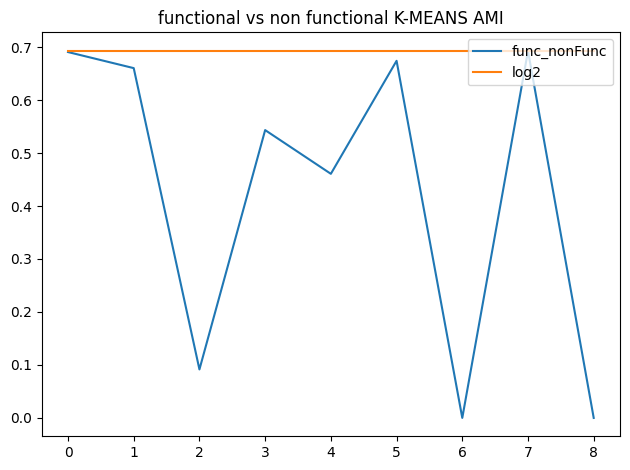

2 clusters are completly separated
cluster 0 fraction nf:0.4642857142857143, f:0.5357142857142857, weight = 0.0743362831858407
cluster 1 fraction nf:0.6275510204081632, f:0.37244897959183676, weight = 0.17345132743362832
cluster 2 fraction nf:0.981651376146789, f:0.01834862385321101, weight = 0.09646017699115045
cluster 3 fraction nf:0.7666666666666667, f:0.23333333333333334, weight = 0.05309734513274336
cluster 4 fraction nf:0.8269230769230769, f:0.17307692307692307, weight = 0.04601769911504425
cluster 5 fraction nf:0.4025974025974026, f:0.5974025974025974, weight = 0.3407079646017699
cluster 6 fraction nf:1.0, f:0.0, weight = 0.03274336283185841
cluster 7 fraction nf:0.5145631067961165, f:0.4854368932038835, weight = 0.09115044247787611
cluster 8 fraction nf:1.0, f:0.0, weight = 0.0920353982300885


In [ ]:
lista_km_AMI, H_func_AMI = analyze_nat(y_means_nat_MI, Y,"K-MEANS AMI")

In [ ]:
tot_score_AMI = tot_score(H_func_AMI, lista_km_AMI)
print(f"K-Means with k given by AMI give a score of {tot_score_AMI}")

K-Means with k given by AMI give a score of 0.5175314339580996


In [ ]:
np.array(lista_km_AMI).shape

<ipython-input-111-4807da94f20a>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  np.array(lista_km_AMI).shape


(9, 4)

<ipython-input-160-52ee35749db4>:8: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  line1 = plt.bar([1,2,3,4,5,6,7,8,9], np.sort(H_func)[::-1],width=np.array(lista_km_AMI)[:,3])
<ipython-input-160-52ee35749db4>:14: UserWarning: The label '_container0' of <BarContainer object of 9 artists> starts with '_'. It is thus excluded from the legend.
  plt.legend(handles=[line1, line2, line3], loc='lower right')


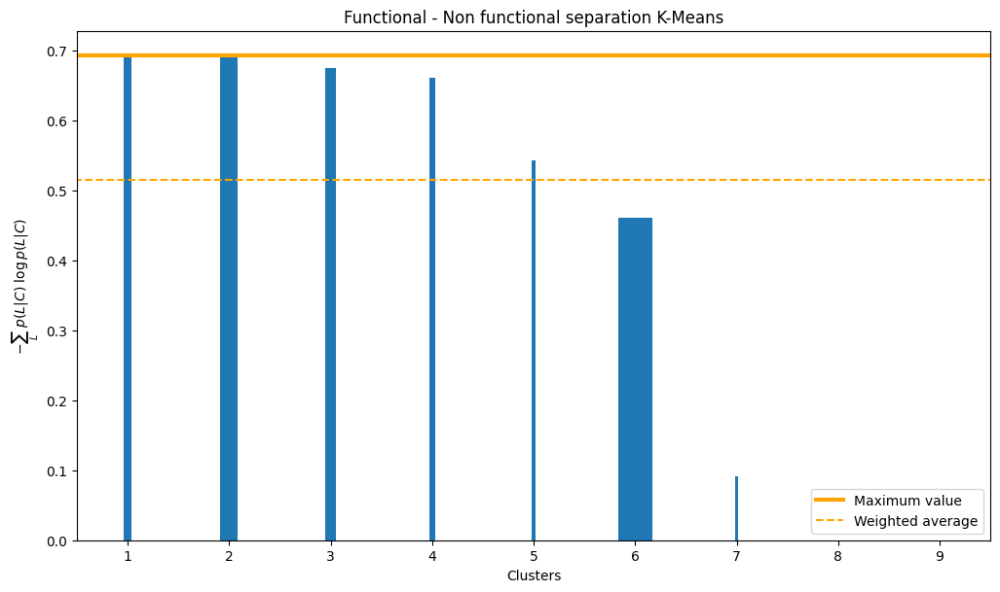

2 clusters are completly separated
cluster 0 fraction nf:0.4642857142857143, f:0.5357142857142857, weight = 0.0743362831858407
cluster 1 fraction nf:0.6275510204081632, f:0.37244897959183676, weight = 0.17345132743362832
cluster 2 fraction nf:0.981651376146789, f:0.01834862385321101, weight = 0.09646017699115045
cluster 3 fraction nf:0.7666666666666667, f:0.23333333333333334, weight = 0.05309734513274336
cluster 4 fraction nf:0.8269230769230769, f:0.17307692307692307, weight = 0.04601769911504425
cluster 5 fraction nf:0.4025974025974026, f:0.5974025974025974, weight = 0.3407079646017699
cluster 6 fraction nf:1.0, f:0.0, weight = 0.03274336283185841
cluster 7 fraction nf:0.5145631067961165, f:0.4854368932038835, weight = 0.09115044247787611
cluster 8 fraction nf:1.0, f:0.0, weight = 0.0920353982300885


In [ ]:
  name_title='Functional - Non functional separation K-Means'
  y_cluster = y_means_nat_MI
  y_true=Y
  H_func = separation_entropy(y_cluster, y_true)
  max_ent_func = np.log(2)*np.ones(len(H_func)+2)

  plt.figure(figsize=(10, 6))
  line1 = plt.bar([1,2,3,4,5,6,7,8,9], np.sort(H_func)[::-1],width=np.array(lista_km_AMI)[:,3])
  line2, = plt.plot([-1,9.5], [np.log(2), np.log(2)], c='orange', linewidth=3, label='Maximum value')
  line3, = plt.plot([-1,9.5], [0.515, 0.515],'--', c='orange', label='Weighted average')

  plt.title(name_title)
  plt.xlim(0.5,9.5)
  plt.legend(handles=[line1, line2, line3], loc='lower right')

  #plt.text(7, 0.6, 'H[L|C]=0.515', fontsize=14)
  plt.tight_layout()
  plt.xlabel('Clusters')
  plt.ylabel(r'$-\sum_{L} \ p(L|C) \ \log p(L|C)$')
  plt.savefig('functionalsep.png',bbox_inches='tight')
  plt.show()

  print(str(len([i for i in H_func if i == 0]))+" clusters are completly separated")

  if -1 in y_cluster:
    lista = clusters_details(y_cluster, y_true)
    print(f"Noise fraction nf:{lista[0][0]}, f:{lista[0][1]}, weight = {lista[0][3]}")
    for i in range(1,len(lista)):
      print(f"cluster {i} fraction nf:{lista[i][0]}, f:{lista[i][1]}, weight = {lista[i][3]}")
  else:
    lista = clusters_details(y_cluster, y_true)
    for i in range(0,len(lista)):
      print(f"cluster {i} fraction nf:{lista[i][0]}, f:{lista[i][1]}, weight = {lista[i][3]}")



[1091, 1092, 1093, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1127, 1128, 1129, 943, 950, 951, 952, 953, 954, 955, 956, 957, 958, 959, 960, 961, 962, 963, 964, 965, 966, 967, 968, 969, 970, 971, 972, 973, 974, 975, 976, 977, 978, 979, 980, 981, 982, 983, 984, 985, 986, 987, 988, 989, 990, 991, 992, 993, 994, 995, 996, 997, 998, 999, 1000, 1001, 1002, 1007, 1008, 1009, 1010, 1011, 1012, 1013, 1014, 1015, 1016, 1017, 1018, 1019, 1020, 1021, 1022, 1023, 1024, 1025, 1026, 1027, 1028, 1029, 1030, 1031, 1032, 1033, 1034, 1035, 1036, 1037, 1038, 1039, 1040, 1041, 1042, 1043, 1044, 1045, 1046, 1047, 1048, 1049, 1050, 1051, 1052, 1054, 1060, 1061, 1062]


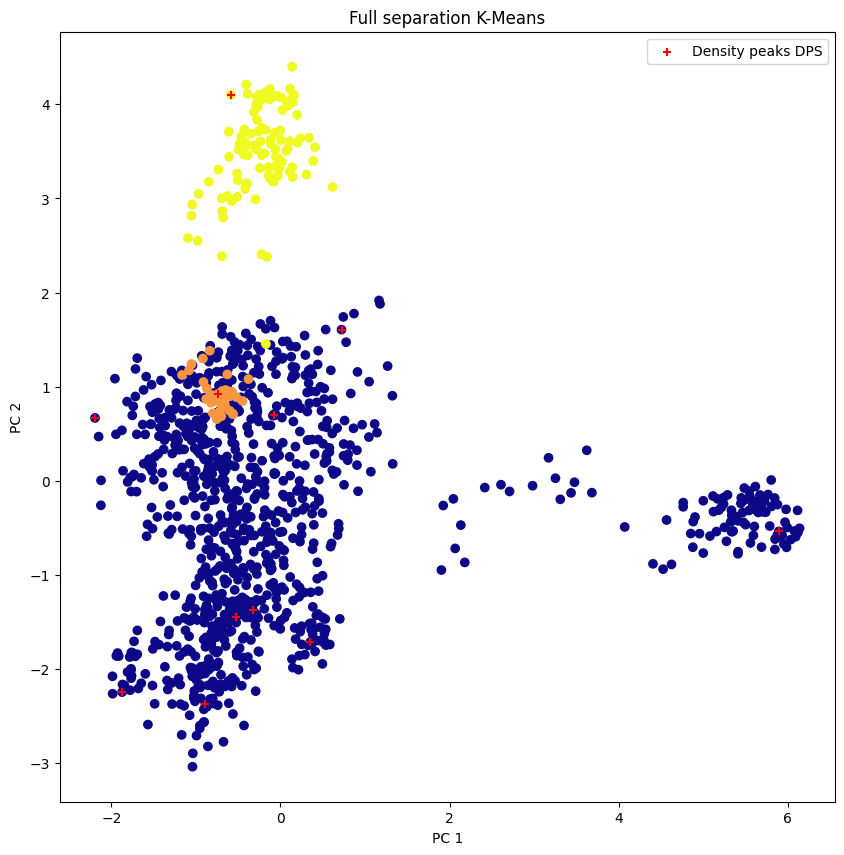

In [ ]:
non_func_ami = []
sep_km = np.zeros(X.shape[0])
for i in range(len(lista)):
  if lista[i][0] == 1 or lista[i][1] == 1:
    for elm in lista[i][2]:
      sep_km[elm] = i
      non_func_ami.append(elm)
print(non_func_ami)
sep_bool = sep.astype(bool)

plt.figure(figsize=(10,10))
plt.scatter(Xproj[:,0], Xproj[:,1], c=sep_km,cmap="plasma", alpha=1)
plt.scatter(peaks_trasf[:,0], peaks_trasf[:,1], c="r", marker='+', label="Density peaks DPS")
plt.legend()
plt.xlabel('PC 1')
plt.ylabel('PC 2')
plt.title('Full separation K-Means')
plt.savefig('fullsep_km_2d.png')

In [ ]:
sep_km

array([0., 0., 0., ..., 6., 6., 6.])

In [ ]:
non_func_DB, non_func_ami
frac = 0
N = len(non_func_DB)
for elm in non_func_DB:
  if elm in non_func_ami:
    frac += 1/N
frac
diff = list(set(non_func_ami) - set(non_func_DB))
print(len(diff))
check = [0,0,0,0,0,0,0,0,0,0,0,0]
for i in range(len(diff)):
  if diff[i] in lista[0][2]:
    check[i] = 1

check

13


[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

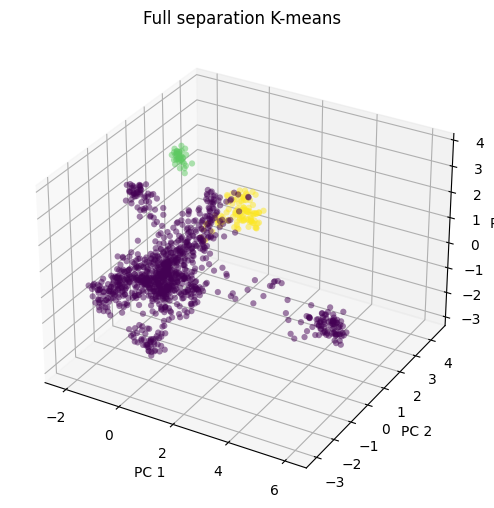

In [ ]:
plt.figure(figsize=(6,10))
ax2 = plt.axes(projection='3d')
ax2.scatter3D(Xproj[:, 0], Xproj[:,1], Xproj[:, 2], c=sep_km, edgecolor='none', alpha=0.5,
            )
ax2.set_xlabel('PC 1')
ax2.set_ylabel('PC 2')
ax2.set_zlabel('PC 3')
plt.title('Full separation K-means')
plt.savefig('separation_AMI_3d.png')

In [ ]:
lista = clusters_details(y_cluster, y_true)
tot_sep = 0
for i in range(0,len(lista)):
  if lista[i][0] == 1 or lista[i][1] == 1:
    tot_sep+=lista[i][3]

print(tot_sep)

0.12477876106194691


**K-MEANS** k from Scree plot

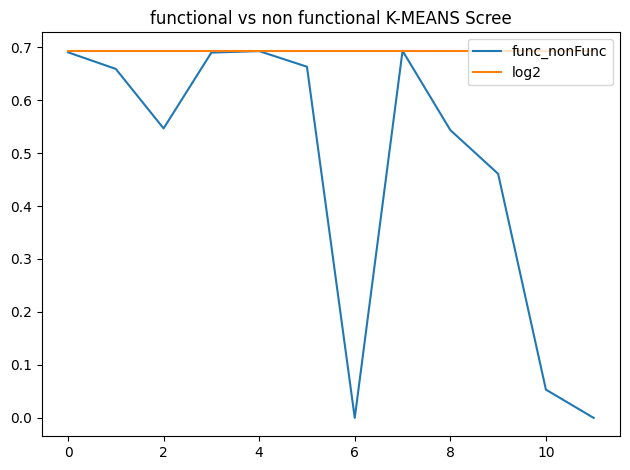

2 clusters are completly separated
cluster 0 fraction nf:0.538860103626943, f:0.46113989637305697, weight = 0.17079646017699116
cluster 1 fraction nf:0.6304347826086957, f:0.3695652173913043, weight = 0.04070796460176991
cluster 2 fraction nf:0.2360248447204969, f:0.7639751552795031, weight = 0.1424778761061947
cluster 3 fraction nf:0.4578313253012048, f:0.5421686746987951, weight = 0.07345132743362832
cluster 4 fraction nf:0.52, f:0.48, weight = 0.08849557522123894
cluster 5 fraction nf:0.6223776223776224, f:0.3776223776223776, weight = 0.12654867256637167
cluster 6 fraction nf:1.0, f:0.0, weight = 0.03274336283185841
cluster 7 fraction nf:0.4888888888888889, f:0.5111111111111111, weight = 0.03982300884955752
cluster 8 fraction nf:0.7666666666666667, f:0.23333333333333334, weight = 0.05309734513274336
cluster 9 fraction nf:0.8269230769230769, f:0.17307692307692307, weight = 0.04601769911504425
cluster 10 fraction nf:0.9905660377358491, f:0.009433962264150943, weight = 0.09380530973451

In [ ]:
lista_km_scree, H_func_scree= analyze_nat(y_means_nat_scree, Y,"K-MEANS Scree")

In [ ]:
tot_score_scree = tot_score(H_func_scree, lista_km_scree)
print(f"K-Means with k given by Scree plot give a score of {tot_score_scree}")

K-Means with k given by Scree plot give a score of 0.5010012278597651


I want to understand if DBSCAN and k-means find the same points in the fully separated clusters


In [ ]:
def confr_full_separations(lista_1,lista_2,soglia):
  soglia = float(soglia)
  fully_1 = []
  for elm in lista_1:
    if elm[0] >= soglia:
      for elmt in elm[2]:
        fully_1.append(elmt)
  fully_2 = []
  for elm in lista_2:
    if elm[0] >= soglia:
      for elmt in elm[2]:
        fully_2.append(elmt)

  fully_1.sort()
  fully_2.sort()
  #print(fully_DB)
  #print(fully_km)
  g = max([len(fully_1),len(fully_2)])
  argg = np.argmax([len(fully_1),len(fully_2)])
  if argg == 0:
    fraction = 0
    for elm in fully_1:
      if elm in fully_2:
        fraction += 1/g
    print(fraction)
  else:
    fraction = 0
    for elm in fully_2:
      if elm in fully_1:
        fraction += 1/g
    print(fraction)
  return fraction

Fraction of points fully separated by both clustering algorithms a few test

In [ ]:
confr_full_separations(lista_DB_FULL,lista_km_AMI,1);
confr_full_separations(lista_DB_10,lista_DB_FULL,1);


0.9078014184397174
0.9208633093525159


On the natural dataset we find that two clusters are completly separated and one is mostly popolated by only one type of sequnces (non functional)


### Functionality and artificiality separations on artificial and natural sequeces

In [ ]:
def analyze_tot(y_cluster, y_true, name_title):
  global nat_art
  H_func = separation_entropy(y_cluster, y_true)
  H_na =separation_entropy(y_cluster, nat_art)

  max_ent_func = np.log(2)*np.ones(len(H_func))
  max_ent_na = np.log(2)*np.ones(len(H_na))

  fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)

  line1, = ax1.plot(H_func,label="func_nonFunc")
  line2, = ax2.plot(H_na, label="nat_art")
  line3, = ax1.plot(max_ent_func,label="log2")
  line4, = ax2.plot(max_ent_na, label="log2")

  ax1.set_title('functional vs non functional'+name_title)
  ax2.set_title('natural vs artificial')

  ax1.legend(handles=[line1, line3], loc='upper right')
  ax2.legend(handles=[line2, line4], loc='upper right')

  plt.tight_layout()

  plt.show()

  print(str(len([i for i in H_func if i == 0]))+" clusters are completly separated in functionality")

  if -1 in y_cluster:
    lista = clusters_details(y_cluster, y_true)
    print(f"Noise fraction nf:{lista[0][0]}, f:{lista[0][1]}, weight = {lista[0][3]}")
    for i in range(1,len(lista)):
      print(f"cluster {i} fraction nf:{lista[i][0]}, f:{lista[i][1]}, weight = {lista[i][3]}")
  else:
    lista = clusters_details(y_cluster, y_true)
    for i in range(0,len(lista)):
      print(f"cluster {i} fraction nf:{lista[i][0]}, f:{lista[i][1]}, weight = {lista[i][3]}")
  return lista, H_func

**DBSCAN**

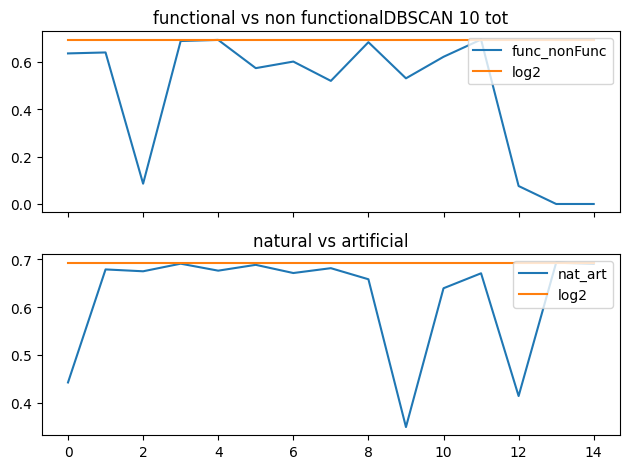

2 clusters are completly separated in functionality
Noise fraction nf:0.6692307692307692, f:0.33076923076923076, weight = 0.12189404594467886
cluster 1 fraction nf:0.33663366336633666, f:0.6633663366336634, weight = 0.0473511486169714
cluster 2 fraction nf:0.9831223628691983, f:0.016877637130801686, weight = 0.1111111111111111
cluster 3 fraction nf:0.5555555555555556, f:0.4444444444444444, weight = 0.02109704641350211
cluster 4 fraction nf:0.5274390243902439, f:0.4725609756097561, weight = 0.1537740271917487
cluster 5 fraction nf:0.7403846153846154, f:0.25961538461538464, weight = 0.04875761837787154
cluster 6 fraction nf:0.288, f:0.712, weight = 0.11720581340834506
cluster 7 fraction nf:0.213768115942029, f:0.7862318840579711, weight = 0.12939521800281295
cluster 8 fraction nf:0.425531914893617, f:0.574468085106383, weight = 0.06610407876230662
cluster 9 fraction nf:0.7777777777777778, f:0.2222222222222222, weight = 0.029535864978902954
cluster 10 fraction nf:0.3116883116883117, f:0.6

In [ ]:
lista_DB_10_tot, H_func_10_tot = analyze_tot(y_DBSCAN_TOT[i_tot],Y_tot, "DBSCAN 10 tot")

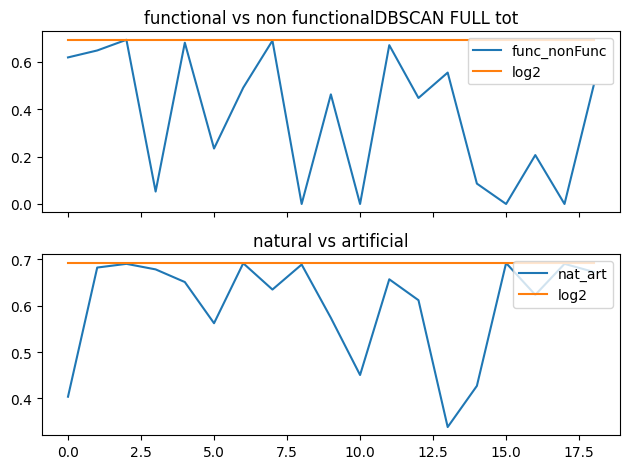

4 clusters are completly separated in functionality
Noise fraction nf:0.6915422885572139, f:0.30845771144278605, weight = 0.09423347398030943
cluster 1 fraction nf:0.34951456310679613, f:0.6504854368932039, weight = 0.048288795124238164
cluster 2 fraction nf:0.5218446601941747, f:0.47815533980582525, weight = 0.19315518049695266
cluster 3 fraction nf:0.9907834101382489, f:0.009216589861751152, weight = 0.10173464603844351
cluster 4 fraction nf:0.58125, f:0.41875, weight = 0.07501172058134084
cluster 5 fraction nf:0.0625, f:0.9375, weight = 0.015002344116268168
cluster 6 fraction nf:0.19281045751633988, f:0.8071895424836601, weight = 0.14345991561181434
cluster 7 fraction nf:0.45222929936305734, f:0.5477707006369427, weight = 0.0736052508204407
cluster 8 fraction nf:1.0, f:0.0, weight = 0.005157055789967183
cluster 9 fraction nf:0.8260869565217391, f:0.17391304347826086, weight = 0.010782934833567745
cluster 10 fraction nf:1.0, f:0.0, weight = 0.011251758087201125
cluster 11 fraction nf

In [ ]:
lista_DB_FULL_tot, H_func_fulltot = analyze_tot(y_DBSCAN_TOT_FULL[i_tot_full],Y_tot, "DBSCAN FULL tot")

**K-MEANS**

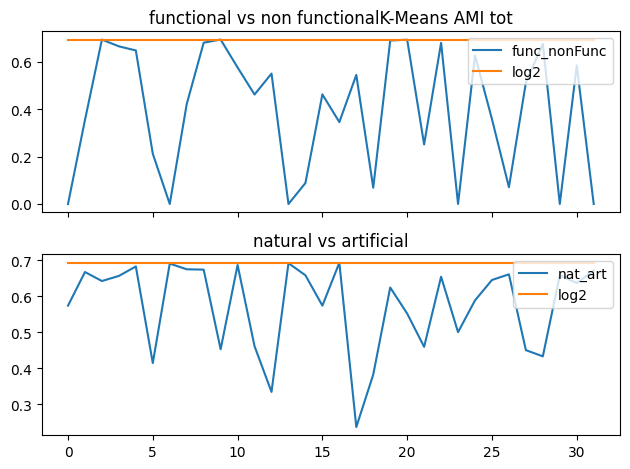

6 clusters are completly separated in functionality
cluster 0 fraction nf:1.0, f:0.0, weight = 0.02156586966713549
cluster 1 fraction nf:0.11363636363636363, f:0.8863636363636364, weight = 0.02062822315986873
cluster 2 fraction nf:0.49166666666666664, f:0.5083333333333333, weight = 0.05625879043600562
cluster 3 fraction nf:0.6190476190476191, f:0.38095238095238093, weight = 0.029535864978902954
cluster 4 fraction nf:0.34951456310679613, f:0.6504854368932039, weight = 0.048288795124238164
cluster 5 fraction nf:0.05454545454545454, f:0.9454545454545454, weight = 0.025785278949835913
cluster 6 fraction nf:1.0, f:0.0, weight = 0.03234880450070324
cluster 7 fraction nf:0.14893617021276595, f:0.851063829787234, weight = 0.02203469292076887
cluster 8 fraction nf:0.4188034188034188, f:0.5811965811965812, weight = 0.05485232067510549
cluster 9 fraction nf:0.5045454545454545, f:0.4954545454545455, weight = 0.10314111579934365
cluster 10 fraction nf:0.7377049180327869, f:0.26229508196721313, weig

In [ ]:
lista_kmAMI_tot, H_func_AMI_tot = analyze_tot(y_means_tot_MI,Y_tot, "K-Means AMI tot")

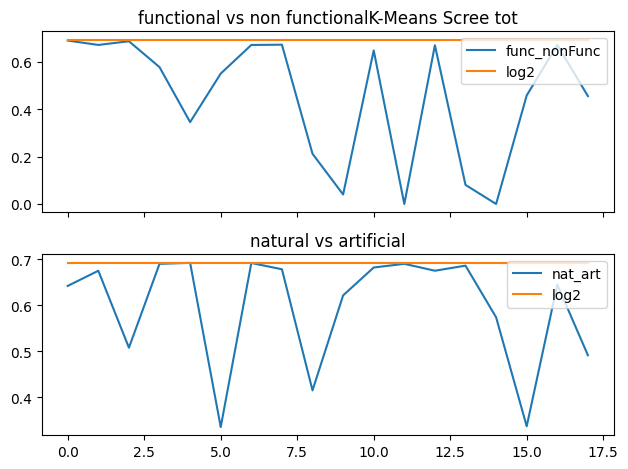

2 clusters are completly separated in functionality
cluster 0 fraction nf:0.45394736842105265, f:0.5460526315789473, weight = 0.07126113455227379
cluster 1 fraction nf:0.6060606060606061, f:0.3939393939393939, weight = 0.07735583684950774
cluster 2 fraction nf:0.5595238095238095, f:0.44047619047619047, weight = 0.15752461322081576
cluster 3 fraction nf:0.7363636363636363, f:0.2636363636363636, weight = 0.051570557899671826
cluster 4 fraction nf:0.109375, f:0.890625, weight = 0.030004688232536336
cluster 5 fraction nf:0.7611940298507462, f:0.23880597014925373, weight = 0.031411157993436474
cluster 6 fraction nf:0.3937007874015748, f:0.6062992125984252, weight = 0.059540553211439286
cluster 7 fraction nf:0.6037735849056604, f:0.39622641509433965, weight = 0.049695264885138306
cluster 8 fraction nf:0.05454545454545454, f:0.9454545454545454, weight = 0.025785278949835913
cluster 9 fraction nf:0.9933333333333333, f:0.006666666666666667, weight = 0.07032348804500703
cluster 10 fraction nf:0.

In [ ]:
lista_kmscree_tot, H_func_scree_tot = analyze_tot(y_means_tot_scree,Y_tot, "K-Means Scree tot")

In [ ]:
len(np.array(lista)[:,3])


<ipython-input-127-5340278feaa4>:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  len(np.array(lista)[:,3])


9

cluster 0 fraction art:0.4642857142857143, nat:0.5357142857142857, weight = 0.0743362831858407
cluster 1 fraction art:0.6275510204081632, nat:0.37244897959183676, weight = 0.17345132743362832
cluster 2 fraction art:0.981651376146789, nat:0.01834862385321101, weight = 0.09646017699115045
cluster 3 fraction art:0.7666666666666667, nat:0.23333333333333334, weight = 0.05309734513274336
cluster 4 fraction art:0.8269230769230769, nat:0.17307692307692307, weight = 0.04601769911504425
cluster 5 fraction art:0.4025974025974026, nat:0.5974025974025974, weight = 0.3407079646017699
cluster 6 fraction art:1.0, nat:0.0, weight = 0.03274336283185841
cluster 7 fraction art:0.5145631067961165, nat:0.4854368932038835, weight = 0.09115044247787611
cluster 8 fraction art:1.0, nat:0.0, weight = 0.0920353982300885


<ipython-input-128-57f395d61a74>:19: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  line1 = plt.bar(np.linspace(1,18,18), np.sort(H_func)[::-1],width=np.array(lista_kmscree_tot)[:,3])
<ipython-input-128-57f395d61a74>:25: UserWarning: The label '_container0' of <BarContainer object of 18 artists> starts with '_'. It is thus excluded from the legend.
  plt.legend(handles=[line1, line2, line3], loc='lower right')


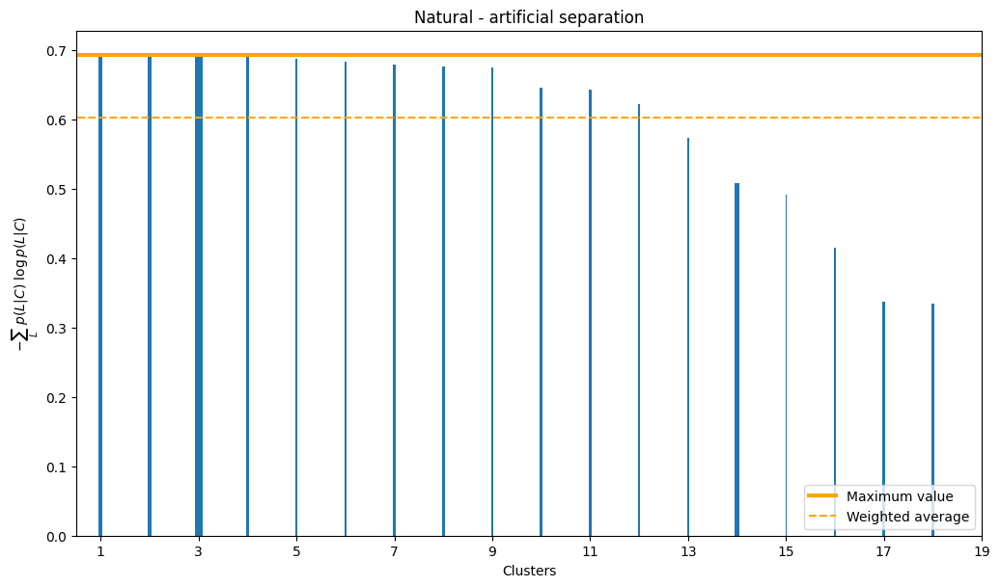

0 clusters are completly separated


In [ ]:
if -1 in y_cluster:
  lista = clusters_details(y_cluster, y_true)
  print(f"Noise fraction art:{lista[0][0]}, nat:{lista[0][1]}, weight = {lista[0][3]}")
  for i in range(1,len(lista)):
    print(f"cluster {i} fraction art:{lista[i][0]}, nat:{lista[i][1]}, weight = {lista[i][3]}")
else:
  lista = clusters_details(y_cluster, y_true)
  for i in range(0,len(lista)):
    print(f"cluster {i} fraction art:{lista[i][0]}, nat:{lista[i][1]}, weight = {lista[i][3]}")

name_title='Natural - artificial separation'
y_cluster = y_means_tot_scree
y_true=Y_tot
H_func = separation_entropy(y_cluster, nat_art)
max_ent_func = np.log(2)*np.ones(len(H_func)+2)

value=tot_score(H_func, clusters_details(y_cluster,nat_art))
plt.figure(figsize=(10, 6))
line1 = plt.bar(np.linspace(1,18,18), np.sort(H_func)[::-1],width=np.array(lista_kmscree_tot)[:,3])
line2, = plt.plot([-1,20.5], [np.log(2), np.log(2)], c='orange', linewidth=3, label='Maximum value')
line3, = plt.plot([-1,20.5], [value, value],'--', c='orange', label='Weighted average')

plt.title(name_title)
plt.xlim(0.5,18.5)
plt.legend(handles=[line1, line2, line3], loc='lower right')

#plt.text(7, 0.6, 'H[L|C]=0.515', fontsize=14)
plt.tight_layout()
plt.xticks(range(1,20,2))
plt.xlabel('Clusters')
plt.ylabel(r'$-\sum_{L} \ p(L|C) \ \log p(L|C)$')
plt.savefig("nat_art_sep.png")
plt.show()

print(str(len([i for i in H_func if i == 0]))+" clusters are completly separated")





## TDA

In [ ]:
!pip install cython
!pip install ripser

In [ ]:
from ripser import ripser
from persim import plot_diagrams

diagrams = ripser(X)['dgms']
plot_diagrams(diagrams, show=True)
plt.show()

diagrams = ripser(np.sqrt(dist), distance_matrix=True)['dgms']
plot_diagrams(diagrams, show=True)

So there should be three clusters which persist some time, then become two quite soon and finally only one is left. The gap should be at 3 clusters.

## Other insights on the distance space

Let's plot

In [ ]:
plt.hist(one_hot_dist.flatten(), bins=96,range=(1,20), density=True)

In [ ]:
plt.hist(dist.flatten(), bins=96,range=(1,96), density=True)

## Gaussian mixture model

In [ ]:
from sklearn.mixture import GaussianMixture as GMM
gmm = GMM(k_scree_nat, max_iter=500, random_state= 30, init_params='k-means++')
gmm.fit(X)
y_GMM = gmm.predict(X)

In [ ]:
lista_GMM = clusters_details(y_GMM, Y)
for i in range(0,len(lista_GMM)):
  print(f"cluster {i+1} fraction nf:{lista_GMM[i][0]}, f:{lista_GMM[i][1]}, weight = {lista_GMM[i][3]}")

In [ ]:
H_func_GMM_nat = separation_entropy(y_GMM, Y)
max_ent_func = np.log(2)*np.ones(len(H_func_GMM_nat))

fig, (ax1) = plt.subplots(1, 1, sharex=True)

line1, = ax1.plot(H_func_GMM_nat,label="func_nonFunc")
line3, = ax1.plot(max_ent_func,label="log2")

ax1.set_title('functional vs non functional')

ax1.legend(handles=[line1, line3], loc='upper right')

plt.tight_layout()

plt.show()

print(str(len([i for i in H_func_GMM_nat if i == 0]))+" clusters are completly separated")

In [ ]:
score_GMM = tot_score(H_func_GMM_nat, y_GMM)
print("GMM score is "+str(score_GMM))

Same analysis but with the full dataset **ART + NAT**

In [ ]:
n_km_tot = 18
gmm = GMM(n_km_tot, max_iter=500, random_state= 30, init_params='k-means++')
gmm.fit(X_tot)
y_GMM_tot = gmm.predict(X_tot)

In [ ]:
lista_GMM_tot = clusters_details(y_GMM_tot, nat_art)
for i in range(0,len(lista_GMM_tot)):
  print(f"cluster {i+1} fraction art:{lista_GMM_tot[i][0]}, nat:{lista_GMM_tot[i][1]}, weight = {lista_GMM_tot[i][3]}")

In [ ]:
H_func_GMM_tot = separation_entropy(y_GMM_tot, Y_tot)
H_na_GMM_tot =separation_entropy(y_GMM_tot, nat_art)

max_ent_func = np.log(2)*np.ones(len(H_func_GMM_tot))
max_ent_na = np.log(2)*np.ones(len(H_na_GMM_tot))

fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True)

line1, = ax1.plot(H_func_GMM_tot,label="func_nonFunc")
line2, = ax2.plot(H_na_GMM_tot, label="nat_art")
line3, = ax1.plot(max_ent_func,label="log2")
line4, = ax2.plot(max_ent_na, label="log2")

ax1.set_title('functional vs non functional')
ax2.set_title('natural vs artificial')

ax1.legend(handles=[line1, line3], loc='upper right')
ax2.legend(handles=[line2, line4], loc='upper right')

plt.tight_layout()

plt.show()

print(len([i for i in H_func_GMM_tot if i == 0]))

In [ ]:
score_GMM_tot = tot_score(H_na_GMM_tot, y_GMM_tot)
print("GMM score is "+str(score_GMM_tot))

# Predicting protein functionality

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import RocCurveDisplay, auc, roc_auc_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import StratifiedKFold

#validation test splitting
#We first consider a classic setup of using one validation set
perc=0.3
X_train, X_valid, y_train, y_valid = train_test_split(X, Y, test_size=perc, random_state=1)
#We now consider using k-Fold cross validation form model selection
n_splits = 6
cv = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=5) #since we have an unbalanced dataset, we use the stratified version of k-folding

We also create a dataset from the reduced dimensional space obtained through Isomap (60 nearest neighbours).

In [ ]:
X_train_iso, X_valid_iso, y_train_iso, y_valid_iso = train_test_split(X_transformed_iso, Y, test_size=perc, random_state=1)

## ROC

We will consider the ROC curve computed on different folds to do procede with model selection [6]

In [ ]:
def kfoldROC(model_l,cv,title=f"Mean ROC curve with variability\n(Functional proteins)"):
  tprs = [] #we'll save true positive rates
  aucs = [] #we'll save the area under the curve, which is linked to the degree of separability
  mean_fpr = np.linspace(0, 1, 100) #this is the division we'll deem interesting for interpolation

  fig, ax = plt.subplots(figsize=(6, 6))
  for fold, (train, test) in enumerate(cv.split(X, Y)):
      model_l.fit(X[train], Y[train])
      viz = RocCurveDisplay.from_predictions(Y[test],model_l.predict_proba(X[test])[:,1],name=f"ROC fold {fold}",alpha=0.3,lw=1,ax=ax)
      interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
      interp_tpr[0] = 0.0
      tprs.append(interp_tpr)
      aucs.append(viz.roc_auc)
  plt.plot([0,1],[0,1],'--',color='grey')

  #We compute the mean results over the different foldings
  mean_tpr = np.mean(tprs, axis=0)
  mean_tpr[-1] = 1.0
  mean_auc = auc(mean_fpr, mean_tpr)
  std_auc = np.std(aucs)
  ax.plot(mean_fpr,mean_tpr,color="b",label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),lw=2,alpha=0.8)

  #We compute standard deviation over different foldings and plot the error bar
  std_tpr = np.std(tprs, axis=0)
  tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
  tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
  ax.fill_between(mean_fpr,tprs_lower,tprs_upper,color="grey",alpha=0.2,label=r"$\pm$ 1 std. dev.")

  ax.set(
      xlim=[-0.05, 1.05],
      ylim=[-0.05, 1.05],
      xlabel="False Positive Rate",
      ylabel="True Positive Rate",
      title=title,
  )
  ax.axis("square")
  ax.legend(loc="lower right")
  plt.show()
  return (mean_auc, std_auc)

def kfoldROC_auc(model_l,cv,X,Y):
  aucs = []
  results = np.array([])
  for fold, (train, test) in enumerate(cv.split(X, Y)):
        model_l.fit(X[train], Y[train])
        R=model_l.predict_proba(X[test])[:,1]
        results = np.append(results,R)
        aucs.append(roc_auc_score(Y[test],R))

  return aucs, results

A general framework could be:\\
-understand the hyperparameters \\
-use the validation set to choose the best \\
-verify on the test set \\

Different scores can be used: accuracy score, mutual information, ROC AUC

For the first model we run a couple of tests and see to see the effect of using a reduced space (ISOMAP 60 neighbours) and changing explicitly the threshold. We will then consider the ROC curve on using 6-fold cross validation to evaluate the different models.

## Baseline models
In order to address a comparison, we can start using the results obtained through unsupervised learning as baseline models. In particular we can focus on the ones that had the best entropy when predicting functionality for natural sequences

In [ ]:
# lista[i][0] nf prob lista[i][1] f prob lista[i][2] lis of points lista[i][3] total weight
def baseline_model_km(X,est,lista):
  y_clusters = est.predict(X)
  prediction = []
  for elm in y_clusters:
    prediction.append([lista[elm][0],lista[elm][1]])
  return np.array(prediction)

def trainable_baseline(X_train,X_valid,Y_train,est):
  est.fit(X_train)
  y_means = est.predict(X_train)
  y_clusters = est.predict(X_valid)
  lista = clusters_details(y_means, Y_train)
  prediction = []
  for elm in y_clusters:
    prediction.append([lista[elm][0],lista[elm][1]])
  return np.array(prediction)
#lista_km = clusters_details(y_means, Y)

In [ ]:
est_km_scree = KMeans(12, init='k-means++', n_init=100, max_iter=600)
est_km_scree.fit(X)
bl_prediction = baseline_model_km(X_art,est_km_scree,lista_km_scree)
roc_auc_score(Y_art,bl_prediction[:,1])

NameError: name 'lista_km_scree' is not defined

In [ ]:
roc_auc_score(y_valid,trainable_baseline(X_train,X_valid,y_train,est_km_scree)[:,1])

0.7581116158338741

In [ ]:
cm = confusion_matrix(Y_art, np.floor(bl_prediction.T[1]+0.5).astype(int))

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
print('The accuracy is ', (cm[0,0]+cm[1,1])/np.sum(cm))

NameError: name 'bl_prediction' is not defined

In [ ]:
#assign labels to clusters using the artificial sequences
#use the clustering for the whole dataset
#compute the confusion matrix

The accuracy is  0.7787610619469026


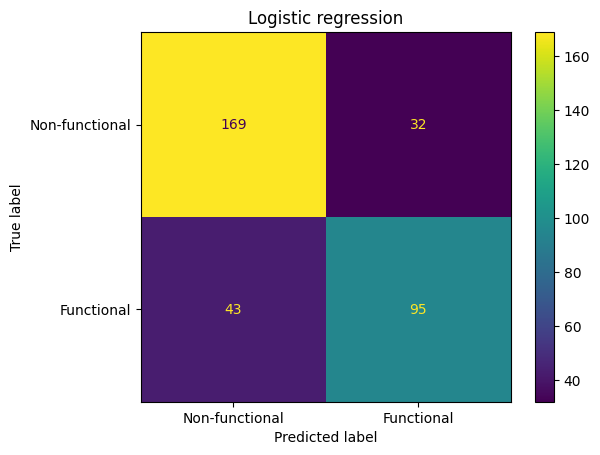

In [ ]:
from sklearn import neighbors
knn = neighbors.KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_valid)
cm = confusion_matrix(y_valid, y_pred)

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
plt.title('Logistic regression')
print('The accuracy is ', (cm[0,0]+cm[1,1])/np.sum(cm))

## Logistic regression

The accuracy is  0.7817109144542773


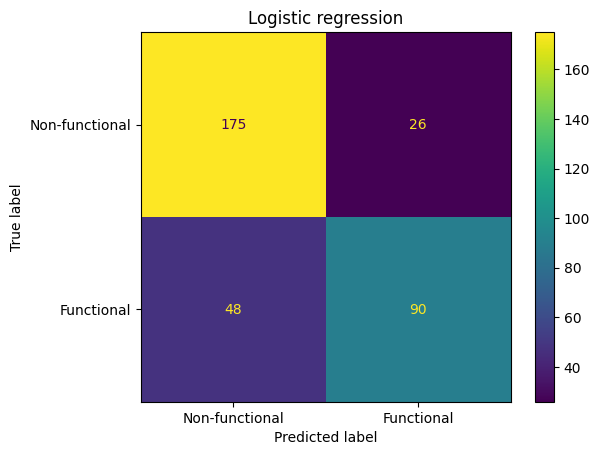

In [ ]:
from sklearn.linear_model import LogisticRegression

model_c=LogisticRegression(max_iter=500, n_jobs=-1)
model_c.fit(X_train,y_train)                                #fitting the model
y_pred = model_c.predict(X_valid)                           #making prediction on validation
probabilities=model_c.predict_proba(X_valid)
cm = confusion_matrix(y_valid, y_pred)

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
plt.title('Logistic regression')
print('The accuracy is ', (cm[0,0]+cm[1,1])/np.sum(cm))

We can now look at the results for the elements embedded with Isomap.

In [ ]:
model_iso=LogisticRegression(max_iter=500, n_jobs=-1)
model_iso.fit(X_train_iso,y_train_iso)                                #fitting the model
y_pred_iso = model_iso.predict(X_valid_iso)                           #making prediction on validation
cm = confusion_matrix(y_valid, y_pred_iso)

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
plt.title('Logistic regression for ISOMAP embedding')
print((cm[0,0]+cm[1,1])/np.sum(cm))

NameError: name 'X_train_iso' is not defined

We hereby evaluate the results when changing the threshold.

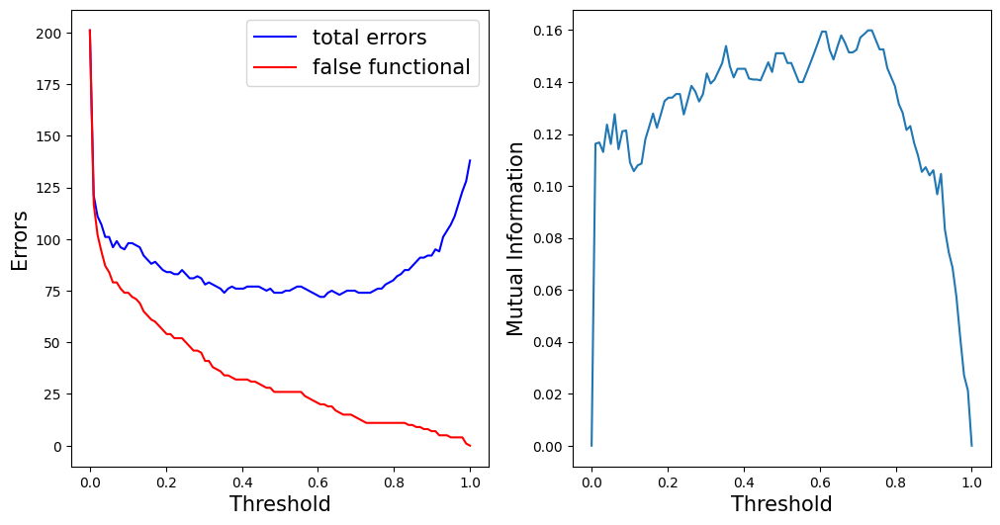

In [ ]:
from sklearn.metrics import mutual_info_score

total_error = np.zeros(0)
false_n_functional = np.zeros(0)
info_score= np.zeros(0)
threshold=np.linspace(0,1,100)


for thr in threshold:
  y_treshold=np.zeros(X_valid.shape[0])
  for i in range(len(y_treshold)):
    if probabilities[i,1]>=thr:
      y_treshold[i]=1
    else:
      y_treshold[i]=0
  cm = confusion_matrix(y_valid, y_treshold)
  total_error = np.append(total_error,cm[0,1]+cm[1,0])
  false_n_functional = np.append(false_n_functional, cm[0,1])
  info_score= np.append(info_score, mutual_info_score(y_valid, y_treshold))

fig, (ax0, ax1) = plt.subplots(nrows=1, ncols=2, figsize=(12, 6), sharex=True)

ax0.plot(threshold,total_error, c='blue', label='total errors')
ax0.plot(threshold, false_n_functional, c='red',label='false functional')
ax0.set_xlabel('Threshold', fontsize=15)
ax0.set_ylabel('Errors', fontsize=15)
ax0.legend(loc="upper right", fontsize=15)
ax1.plot(threshold,info_score)
ax1.set_xlabel('Threshold', fontsize=15)
ax1.set_ylabel('Mutual Information', fontsize=15)
plt.show()

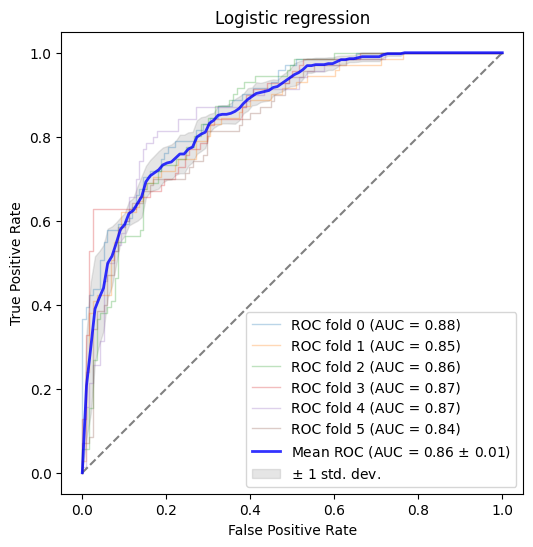

(0.8590228238115563, 0.012775816240363546)

In [ ]:
kfoldROC(LogisticRegression(max_iter=500, n_jobs=-1), cv, title="Logistic regression")

We also create the data needed to train a metaclassifier

In [ ]:
fit_models=[]
fit_iso=[]

In [ ]:
#aucs_iso, preds_iso = kfoldROC_auc(model_iso, cv, X_transformed_iso, Y)
#model_iso.fit(X_transformed_iso,Y)
#fit_iso.append(model_iso)

_, preds = kfoldROC_auc(model_c, cv, X, Y)
model_c.fit(X,Y)
fit_models.append(model_c)

## Decision trees



In [ ]:
from sklearn.tree import DecisionTreeClassifier

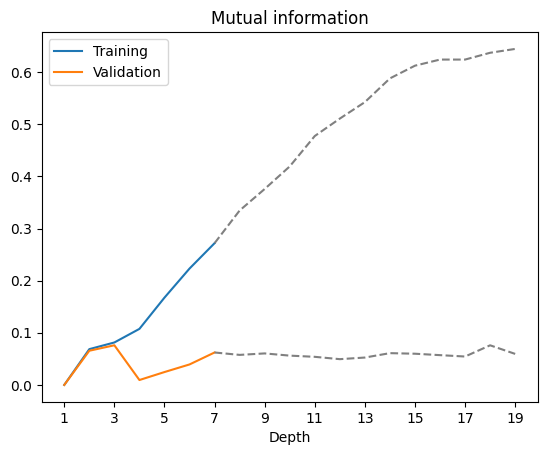

In [ ]:
from scipy.spatial import distance

info_score_val= np.zeros(0)
info_score_int= np.zeros(0)

depths=range(1,20)


for dep in depths:
  model_l = DecisionTreeClassifier(max_depth=dep, random_state=1, criterion='gini')
  model_l.fit(X_train, y_train)
  Pred_tree=model_l.predict(X_valid)
  info_score_val= np.append(info_score_val, mutual_info_score(y_valid, Pred_tree))
  Pred_tree=model_l.predict(X_train)
  info_score_int= np.append(info_score_int, mutual_info_score(y_train, Pred_tree))

plt.plot(depths[:np.ceil(np.log2(N*(1-perc))).astype(int)],info_score_int[:np.ceil(np.log2(N*(1-perc))).astype(int)],label='Training')
plt.plot(depths[:np.ceil(np.log2(N*(1-perc))).astype(int)],info_score_val[:np.ceil(np.log2(N*(1-perc))).astype(int)],label='Validation')
plt.title('Mutual information')
#We insert in gray the results obtained increasing the depth over the minimal needed to completely divide our dataset
plt.plot(depths[np.ceil(np.log2(N*(1-perc))).astype(int)-1:],info_score_int[np.ceil(np.log2(N*(1-perc))).astype(int)-1:],'--',c='gray')
plt.plot(depths[np.ceil(np.log2(N*(1-perc))).astype(int)-1:],info_score_val[np.ceil(np.log2(N*(1-perc))).astype(int)-1:],'--',c='gray')
plt.xlabel('Depth')
plt.xticks(np.arange(min(depths), max(depths)+1, 2))
plt.legend()

model_l = DecisionTreeClassifier(max_depth=None)
model_l.fit(X_train, y_train)
Pred_tree=model_l.predict_proba(X_valid)  #The predicted class probability is the fraction of samples of the same class in a leaf.

Let's now select a proper model in a more relevant way.

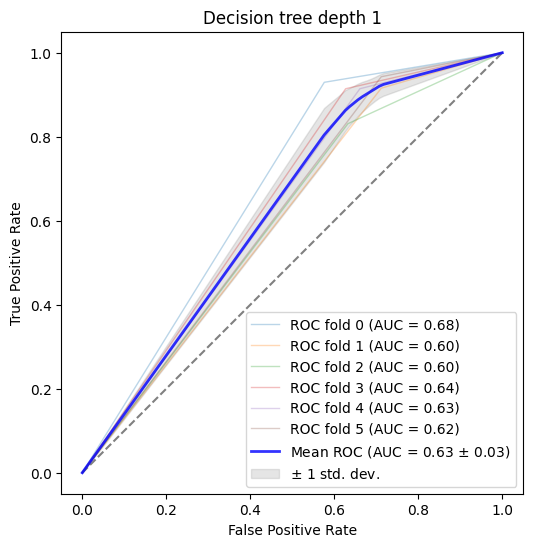

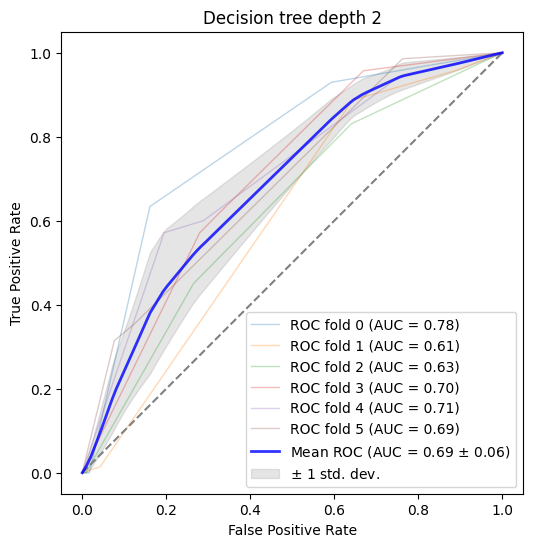

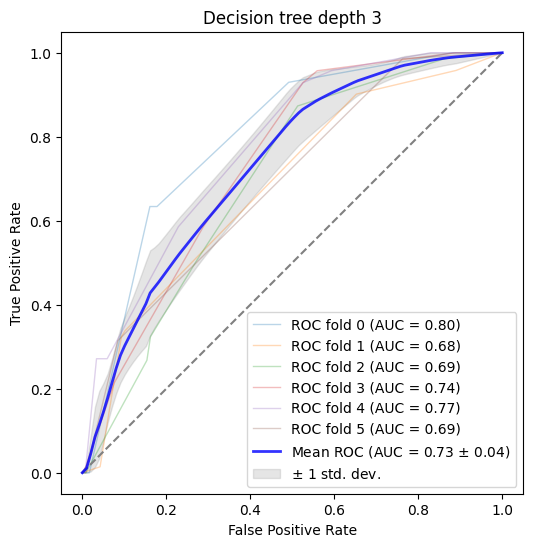

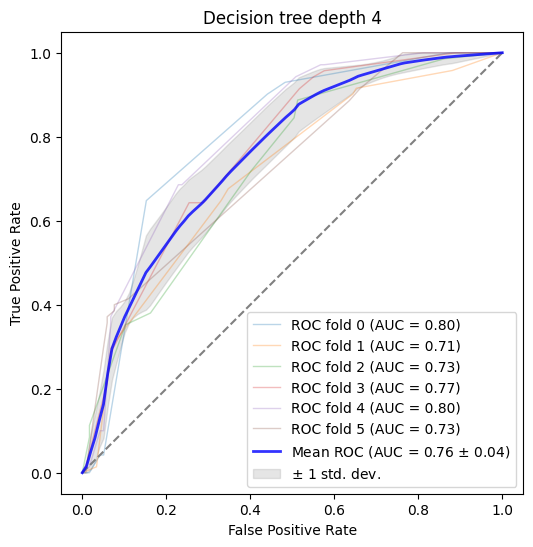

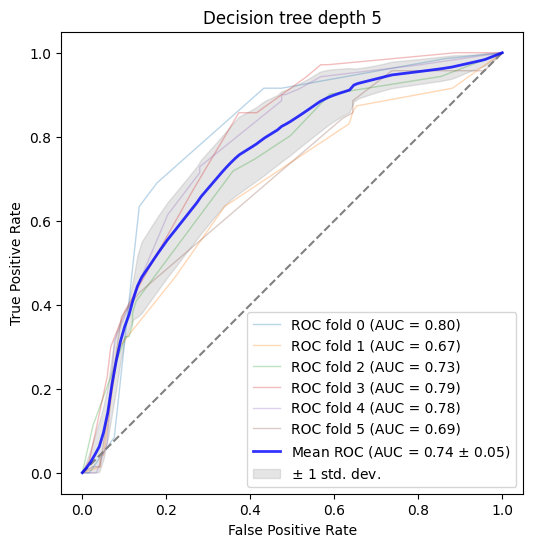

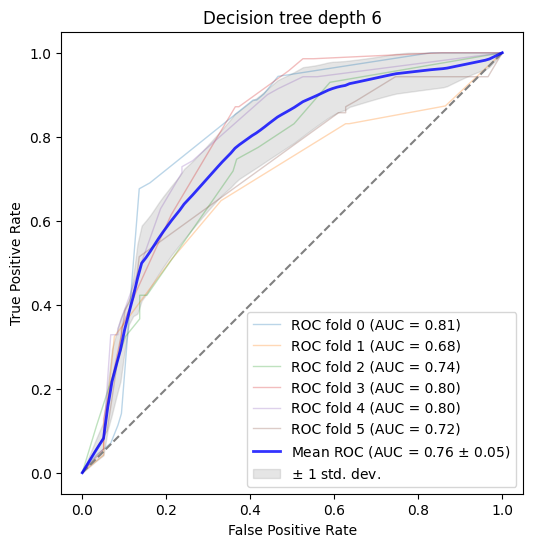

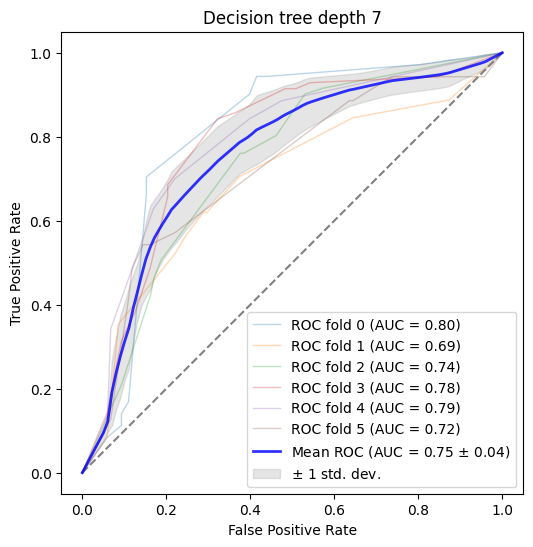

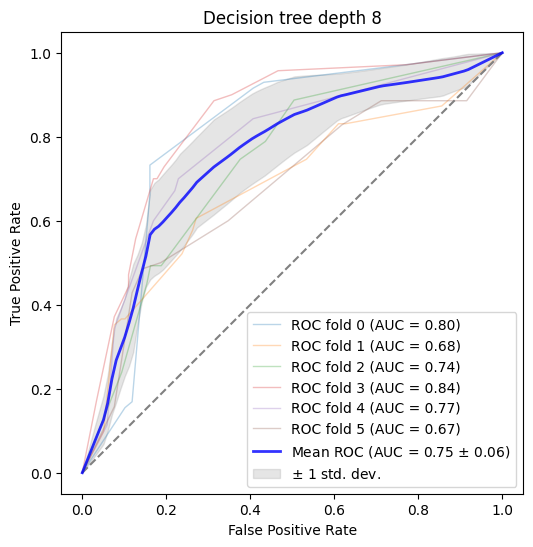

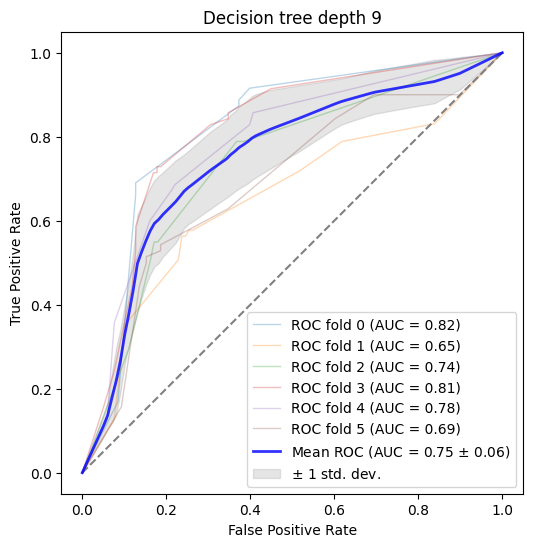

In [ ]:
AUC=[]
for i in range(9):
  AUC.append(kfoldROC(DecisionTreeClassifier(max_depth=i+1, random_state=1),cv,title='Decision tree depth %d' % (i+1)))

Text(0, 0.5, 'AUC')

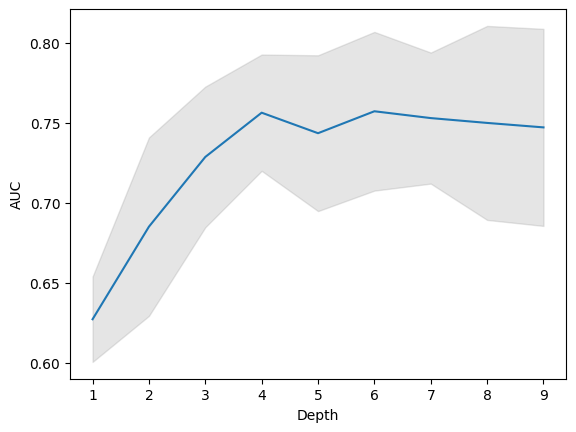

In [ ]:
std = np.array(AUC).T[1]
upper = (np.array(AUC).T[0] + std)
lower = (np.array(AUC).T[0] - std)
plt.fill_between(range(1,10),lower,upper,color="grey",alpha=0.2)
plt.plot(range(1,10),np.array(AUC).T[0])
plt.xlabel('Depth')
plt.ylabel('AUC')

## Random forest

0.15986394651298674
0.7876106194690266


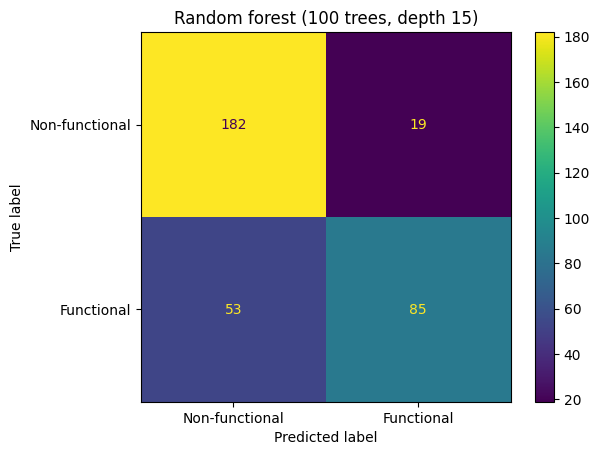

In [ ]:
from sklearn.ensemble import RandomForestClassifier

model_l = RandomForestClassifier(n_estimators=100, max_depth=15 ,random_state=3)
model_l.fit(X_train, y_train)
Pred_forest=model_l.predict(X_valid)
cm = confusion_matrix(y_valid, Pred_forest)
print(mutual_info_score(y_valid, Pred_forest))

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
plt.title('Random forest (100 trees, depth 15)')
print((cm[0,0]+cm[1,1])/np.sum(cm))

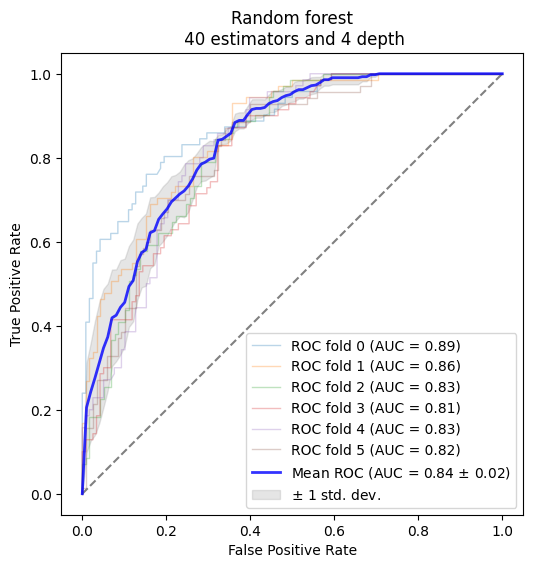

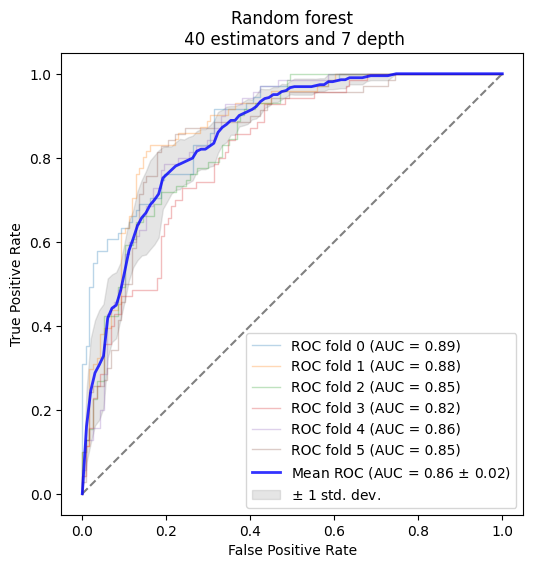

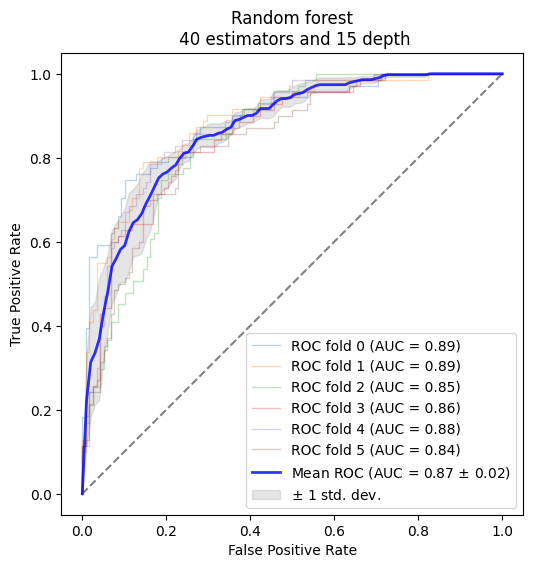

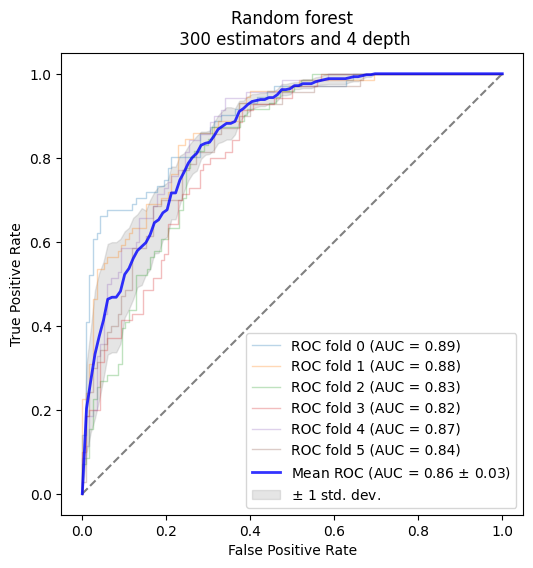

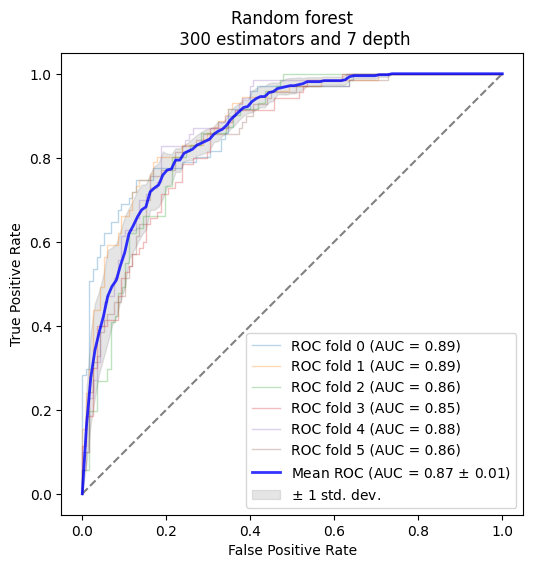

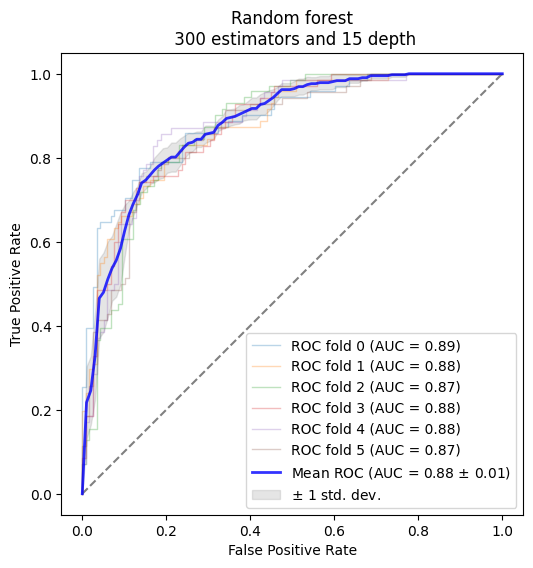

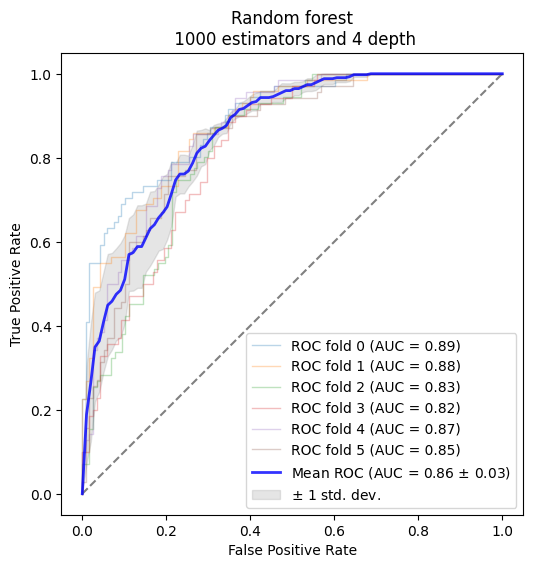

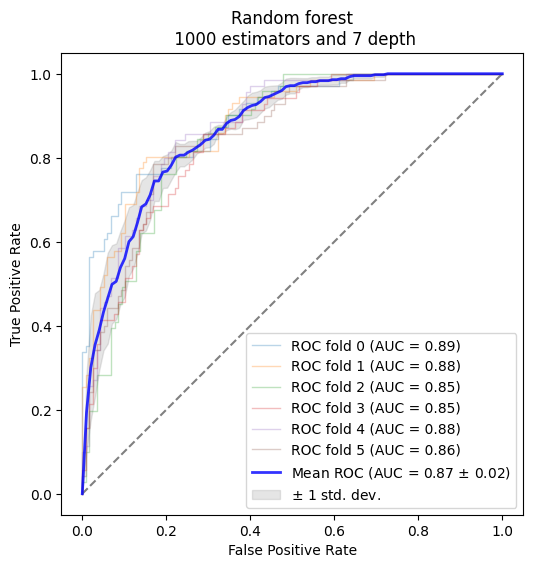

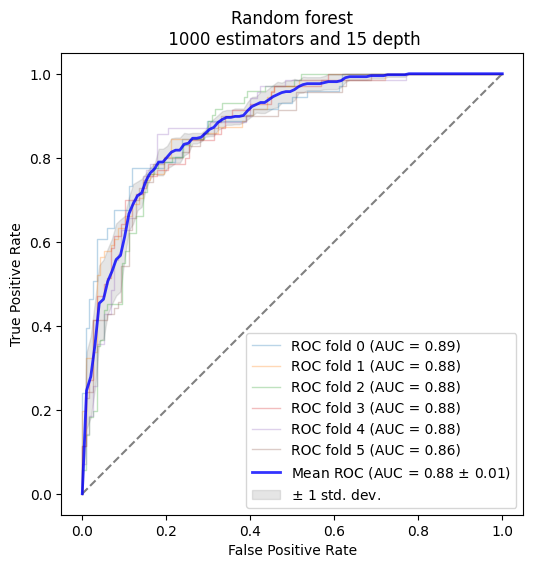

In [ ]:
for i in [40,300,1000]:
  for j in [4,7,15]:
    kfoldROC(RandomForestClassifier(n_estimators=i, max_depth=j ,random_state=3), cv, title=f'Random forest\n %d estimators and %d depth' % (i,j))

Notice: apparently data is somehow already ordered. As a matter of fact doing cross validation without shuffling gives horrible results!

In [ ]:
ensemble_forest=RandomForestClassifier(n_estimators=1000, max_depth=15 ,random_state=3)
_, pred_forest = kfoldROC_auc(ensemble_forest, cv, X, Y)
preds = np.vstack([preds,pred_forest])
ensemble_forest.fit(X,Y)
fit_models.append(ensemble_forest)

## AdaBoosting

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

Using decision trees


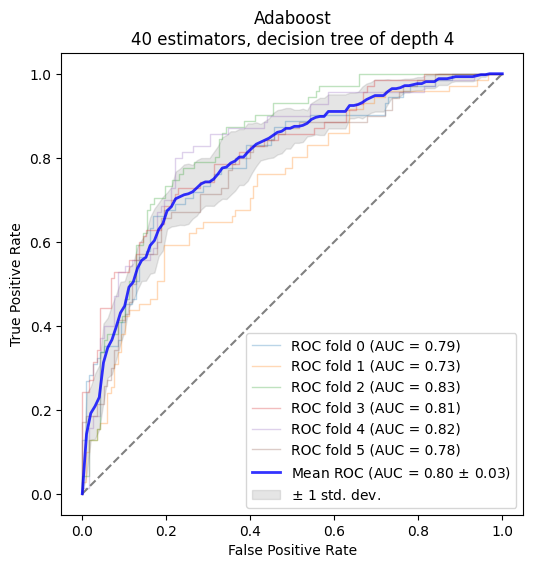

Using Logistic regression


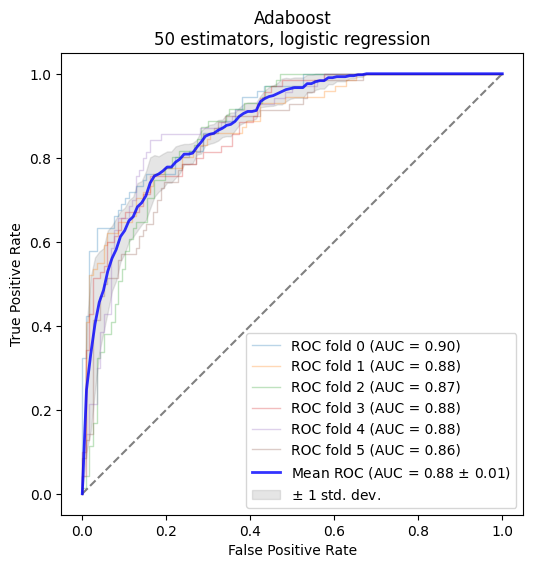

(0.8769590607618776, 0.01297902988489167)

In [ ]:
print("Using decision trees")
weak_classifier = DecisionTreeClassifier(max_depth=4,random_state=5)
strong_classifier = AdaBoostClassifier(n_estimators = 40, estimator = weak_classifier)

kfoldROC(strong_classifier, cv, title=f'Adaboost\n40 estimators, decision tree of depth 4')

print("Using Logistic regression")
weak_classifier = LogisticRegression(max_iter=500, n_jobs=-1)
strong_classifier = AdaBoostClassifier(n_estimators = 50, estimator = weak_classifier)

kfoldROC(strong_classifier, cv, title=f'Adaboost\n50 estimators, logistic regression')

In [ ]:
Ada=strong_classifier
_, pred_Ada = kfoldROC_auc(Ada, cv, X, Y)
preds = np.vstack([preds,pred_Ada])
Ada.fit(X,Y)
fit_models.append(Ada)

## Neural Network

In [ ]:
import torch
from torch.utils.data import Dataset, random_split, DataLoader, TensorDataset, DataLoader
import torchvision.models as models
import torch.nn as nn
from torchvision.utils import make_grid
import torch.optim as optim
from tqdm.notebook import tqdm

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
def evaluate_accuracy(model, dataloader):
    correct = 0
    total = 0
    with torch.no_grad():
        for data in dataloader:
            protein, labels = data
            outputs = model(protein.to(torch_device))
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels.to(torch_device)).sum().item()
    accuracy = 100 * correct / total
    print(f'Accuracy : %.3f ' % accuracy)

    return accuracy

def accuracy_classes(net,dataloader,classes):
    correct_pred = {classname: 0 for classname in classes}
    total_pred = {classname: 0 for classname in classes}
    with torch.no_grad():
        for data in dataloader:
            protein, labels = data
            outputs = net(protein.to(torch_device))
            _, predictions = torch.max(outputs, 1)
            for label, prediction in zip(labels.to(torch_device), predictions):
                if label == prediction:
                    correct_pred[classes[label]] += 1
                total_pred[classes[label]] += 1

    for classname, correct_count in correct_pred.items():
        accuracy = 100 * float(correct_count) / total_pred[classname]
        print(f'Accuracy for class: {classname:5s} is {accuracy:.1f} %')

class EarlyStopper_naive:
    def __init__(self, patience=1, min_delta=0):
        self.patience = patience
        self.min_delta = min_delta
        self.counter = 0
        self.min_validation_loss = float('inf')

    def early_stop(self, validation_loss):
        if validation_loss < self.min_validation_loss:
            self.min_validation_loss = validation_loss
            self.counter = 0
        elif validation_loss > (self.min_validation_loss + self.min_delta):
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False

#We now create an early stopper following [7]
class EarlyStopper:
    def __init__(self, k=5, alpha=0.1):
        self.counter = 0
        self.E_opt = float('inf')
        self.k=k
        self.alpha=alpha
        self.training_strip = np.ones(self.k)*float('inf')
        self.generalization_loss = 0
        self.progress = 0

    def early_stop(self, validation_loss):
        self.E_opt = min(self.E_opt, validation_loss)
        self.generalization_loss = 100*(validation_loss/self.E_opt-1)
        self.training_strip[self.counter%self.k] = validation_loss
        self.counter = self.counter+1
        self.progress = 1000*(np.sum(self.training_strip)/(self.k*np.min(self.training_strip))-1)
        if (self.generalization_loss/self.progress)>self.alpha:
          return True
        return False


In [ ]:
class neural_network_1hl(nn.Module):
    def __init__(self):
        super().__init__()
https://colab.research.google.com/drive/1N-fZ5K-mWpW0hYmfl2Sz_svNeU1Am2-z?usp=sharing
        self.network = nn.Sequential(
            nn.Dropout(),
            nn.Linear(96*20, 96),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(96, 2),
            )

    def forward(self, xb):
        return self.network(xb)

class neural_network_5hl(nn.Module):
    def __init__(self):
        super().__init__()

        self.network = nn.Sequential(
            nn.Linear(96*20, 96),
            nn.ReLU(),
            nn.Linear(96, 96),
            nn.ReLU(),
            nn.Linear(96,96),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(96,96),
            nn.ReLU(),
            nn.Linear(96,96),
            nn.ReLU(),
            nn.Linear(96,2)
            )

    def forward(self, xb):
        return self.network(xb)

class neural_network_vertical(nn.Module):
    def __init__(self):
        super().__init__()

        self.network = nn.Sequential(
            nn.Linear(96*20, 2000),
            nn.ReLU(),
            nn.Dropout(p=0.2),
            nn.Linear(2000, 96),
            nn.ReLU(),
            nn.Linear(96,2),
            nn.ReLU(),
            )

    def forward(self, xb):
        return self.network(xb)

class neural_network_vertical2(nn.Module):
    def __init__(self):
        super().__init__()

        self.network = nn.Sequential(
            nn.Linear(96*20, 2000),
            nn.ReLU(),
            nn.Dropout(p=0.2),
            nn.Linear(2000, 2000),
            nn.ReLU(),
            nn.Dropout(p=0.2),
            nn.Linear(2000, 2000),
            nn.ReLU(),
            nn.Dropout(p=0.2),
            nn.Linear(2000, 96),
            nn.ReLU(),
            nn.Linear(96,2),
            nn.ReLU(),
            )

    def forward(self, xb):
        return self.network(xb)

class neural_network_deep(nn.Module):
    def __init__(self):
        super().__init__()
        self.nonlinear = nn.SiLU()

        self.network = nn.Sequential(
            nn.Linear(96*20, 96),
            nn.RReLU(),
            nn.Linear(96, 96),
            nn.RReLU(),
            nn.Dropout(),
            nn.Linear(96, 96),
            nn.RReLU(),
            nn.Linear(96, 96),
            nn.SiLU(),
            nn.Dropout(),
            nn.Linear(96,45),
            nn.ELU(),
            nn.Dropout(),
            nn.Linear(45,45),
            nn.SiLU(),
            nn.Dropout(),
            nn.Linear(45,45),
            nn.Sigmoid(),
            nn.Dropout(),
            nn.Linear(45,45),
            nn.Sigmoid(),
            nn.Linear(45,45),
            nn.LeakyReLU(),
            nn.Linear(45,2)
            )

    def forward(self, xb):
        return self.network(xb)

class neural_network_multiple(nn.Module):
    def __init__(self):
        super().__init__()
        self.nonlinear = nn.SiLU()

        self.network1 = nn.Sequential(
            nn.Linear(96*20, 96),
            nn.RReLU(),
            nn.Linear(96, 96),
            nn.RReLU(),
            nn.Dropout(),
            nn.Linear(96, 96),
            nn.RReLU()
            )

        self.network2 = nn.Sequential(
            nn.Linear(96*20, 96),
            nn.Sigmoid(),
            nn.Linear(96, 96),
            nn.Sigmoid(),
            nn.Dropout(),
            nn.Linear(96, 96),
            nn.Sigmoid()
            )

        self.network3 = nn.Sequential(
            nn.Linear(96*20, 96),
            nn.ELU(),
            nn.Linear(96, 96),
            nn.ELU(),
            nn.Dropout(),
            nn.Linear(96, 96),
            nn.ELU()
            )

        self.network4 = nn.Sequential(
            nn.Linear(96*20, 96),
            nn.SiLU(),
            nn.Linear(96, 96),
            nn.SiLU(),
            nn.Dropout(),
            nn.Linear(96, 96),
            nn.SiLU()
            )

        self.networkfinal = nn.Linear(96*4, 2)

    def forward(self, xb):
      y1=self.network1(xb)
      y2=self.network2(xb)
      y3=self.network3(xb)
      y4=self.network4(xb)
      xb = torch.cat((y1, y2, y3, y4), 1)
      return self.networkfinal(xb)

class convolutional(nn.Module):
    def __init__(self):
        super().__init__()

        self.nonlinear = nn.ReLU()
        self.dropout = nn.Dropout()
        #torch.nn.Conv2d(in_channels, out_channels, kernel_size)
        self.conv1 = nn.Conv2d(1, 30, [30,10]) #returns shape (N_batches, 30, 67, 11)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(30, 5, [3,2])
        self.fc1 = nn.Linear(15*2*5, 96)
        self.fc2 = nn.Linear(96, 96)
        self.fc3 = nn.Linear(96, 2)

    def forward(self, x):
        xb = torch.reshape(x, (x.shape[0], 1, 96, 20))
        xb = self.pool(self.nonlinear(self.conv1(xb))) #returns shape (N_batches, 30, 67, 11)->(N_batches, 30, 33, 5)
        xb = self.pool(self.nonlinear(self.conv2(xb))) #returns shape (N_batches, 5, 31, 4)->(N_batches, 5, 15, 2)
        xb = torch.flatten(xb, 1) # flatten all dimensions except batch
        xb = self.dropout(self.nonlinear(self.fc1(xb)))
        xb = self.dropout(self.nonlinear(self.fc2(xb)))
        xb = self.fc3(xb)
        return xb

#We inspect the difference after adding normalisation layers
class convolutional2(nn.Module):
    def __init__(self):
        super().__init__()

        self.nonlinear = nn.ReLU()
        self.nonlinear2 = nn.Sigmoid()
        self.dropout = nn.Dropout()
        self.normalise = nn.BatchNorm2d(30)
        self.normalise2 = nn.BatchNorm2d(5)
        #torch.nn.Conv2d(in_channels, out_channels, kernel_size)
        self.conv1 = nn.Conv2d(1, 30, [30,10]) #returns shape (N_batches, 30, 67, 11)
        self.pool = nn.MaxPool2d(2, 2)
        self.conv2 = nn.Conv2d(30, 5, [3,2])
        self.fc1 = nn.Linear(15*2*5, 96)
        self.fc2 = nn.Linear(96, 96)
        self.fc3 = nn.Linear(96, 2)

    def forward(self, x):
        xb = torch.reshape(x, (x.shape[0], 1, 96, 20))
        xb = self.pool(self.nonlinear2(self.normalise(self.conv1(xb)))) #returns shape (N_batches, 30, 67, 11)->(N_batches, 30, 33, 5)
        xb = self.pool(self.nonlinear2(self.normalise2(self.conv2(xb)))) #returns shape (N_batches, 5, 31, 4)->(N_batches, 5, 15, 2)
        xb = torch.flatten(xb, 1) # flatten all dimensions except batch
        xb = self.dropout(self.nonlinear(self.fc1(xb)))
        xb = self.dropout(self.nonlinear(self.fc2(xb)))
        xb = self.fc3(xb)
        return xb

In [ ]:
def Hout(Hin, kernel_size, padding=0, dilation=1, stride=1):
  return np.floor((Hin+2*padding-dilation*(kernel_size-1)-1)/stride+1)

In [ ]:
Hout(4,2,stride=2)

2.0

In [ ]:
def train(epoch,net,optimizer,criterion,train_loader,val_loader):
    iterator = tqdm(range(epoch))
    for epoch in iterator:
        train_loss = 0
        correct_train = 0
        total_train = 0
        for i, data in enumerate(train_loader, 0):
            inputs, labels = data
            optimizer.zero_grad()
            outputs = net(inputs.to(torch_device))
            loss = criterion(outputs, labels.to(torch_device))
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
            _, predicted_train = torch.max(outputs, 1)
            total_train += labels.size(0)
            correct_train += predicted_train.eq(labels.to(torch_device)).cpu().sum().item()

        validation_loss=0
        for i, data in enumerate(val_loader, 0):
            inputs, labels = data
            outputs = net(inputs.to(torch_device))
            loss = criterion(outputs, labels.to(torch_device))
            validation_loss += (loss.item())


        train_accuracy = 100 * correct_train / total_train
        print('Epoch %d, train loss: %.3f, train accuracy: %.2f%% , validation loss: %.4f' %
              (epoch + 1, train_loss / len(train_loader), train_accuracy, validation_loss))

        #We add early stopping
        if early_stopper.early_stop(validation_loss):
          iterator.close()
          break

    print('Finished Training')

In [ ]:
torch.manual_seed(10)

dataset = TensorDataset(torch.FloatTensor(X),torch.LongTensor(Y))

val_pct = 0.2
val_size = int(val_pct * len(X))
train_size = len(X) - val_size
train_ds, val_ds = random_split(dataset, [train_size, val_size])

batch_size=100
train_loader = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
signal, labels = next(iter(train_loader))
val_loader = DataLoader(val_ds, batch_size*2, num_workers=2, pin_memory=True)
signal1, labels1 = next(iter(val_loader))
classes=('0','1')

In [ ]:


device = get_default_device()
model = neural_network_vertical()

train_loader = DeviceDataLoader(train_loader, device)
val_loader = DeviceDataLoader(val_loader, device)
to_device(model, device);

if torch.cuda.is_available():
  torch_device='cuda'
else:
  torch_device='cpu'

In [ ]:
## Weight funcions
weight = to_device(torch.Tensor([5/6,5/4]),device)
#weight = None
criterion = nn.CrossEntropyLoss(weight=weight, reduction='sum')
optimizer = optim.Adam(model.parameters(), lr=0.001)
early_stopper = EarlyStopper(k=4,alpha=0.25)
epoch=100

In [ ]:
train(epoch,model,optimizer,criterion,train_loader,val_loader)
model.eval()
evaluate_accuracy(model, val_loader)
accuracy_classes(model, val_loader, classes)

  0%|          | 0/100 [00:00<?, ?it/s]

Epoch 1, train loss: 55.215, train accuracy: 66.92% , validation loss: 133.1673
Epoch 2, train loss: 34.496, train accuracy: 81.53% , validation loss: 127.6486
Epoch 3, train loss: 20.683, train accuracy: 90.49% , validation loss: 117.7944
Epoch 4, train loss: 11.650, train accuracy: 96.02% , validation loss: 138.3391
Epoch 5, train loss: 6.494, train accuracy: 97.23% , validation loss: 143.1729
Epoch 6, train loss: 5.547, train accuracy: 97.90% , validation loss: 171.3337
Epoch 7, train loss: 5.239, train accuracy: 98.01% , validation loss: 175.8209
Finished Training
Accuracy : 76.106 
Accuracy for class: 0     is 77.2 %
Accuracy for class: 1     is 74.4 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


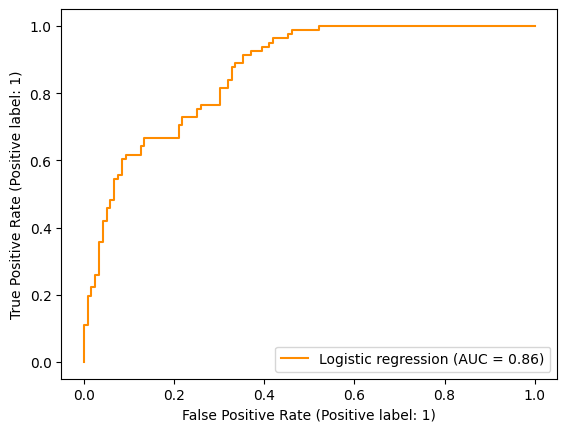

In [ ]:
y_true = to_device(labels1, device)
Soft=nn.Softmax()

for data in val_loader:
    s1, l1 = data
    outputs = model(s1.to(torch_device))
    predictions = Soft(outputs)
    break

RocCurveDisplay.from_predictions(y_true.cpu(),predictions.cpu()[:,1].detach().numpy(),color="darkorange",name="Logistic regression")

Let's now do it with cross validation as we did for the other models.

In [ ]:
def kfoldROC_auc_nn(train_model,cv,epoch=15,val_es_pct=0.16,k=5,alpha=0.3,weight=None):
  global early_stopper
  torch.save(train_model.state_dict(), 'model_cv')
  aucs = []
  results = np.array([])
  for fold, (trained, test) in enumerate(cv.split(X, Y)):
        model = train_model
        model.load_state_dict(torch.load('model_cv'))
        torch.manual_seed(10)
        batch_size=100

        trainer0 = TensorDataset(torch.FloatTensor(X[trained]),torch.LongTensor(Y[trained]))

        val_es_size = int(val_es_pct * len(X[trained]))
        train_true_size = len(X[trained]) - val_es_size

        trainer, val_es = random_split(trainer0, [train_true_size, val_es_size])

        train_loader = DataLoader(trainer, batch_size, shuffle=True, num_workers=2, pin_memory=True)
        signal, labels = next(iter(train_loader))

        val_es_loader = DataLoader(val_es, batch_size, shuffle=True, num_workers=2, pin_memory=True)
        signal_es, labels_es = next(iter(val_es_loader))

        val = TensorDataset(torch.FloatTensor(X[test]),torch.LongTensor(Y[test]))
        val_loader = DataLoader(val, 2*batch_size, num_workers=2, pin_memory=True)
        signal1, labels1 = next(iter(val_loader))

        train_loader = DeviceDataLoader(train_loader, device)
        val_es_loader = DeviceDataLoader(val_es_loader, device)
        val_loader = DeviceDataLoader(val_loader, device)
        to_device(model, device);

        criterion = nn.CrossEntropyLoss(weight=weight,reduction='sum')
        optimizer = optim.Adam(model.parameters(), lr=0.001)

        early_stopper = EarlyStopper(k=k,alpha=alpha)

        model.train()
        train(epoch,model,optimizer,criterion,train_loader,val_es_loader)
        model.eval()
        evaluate_accuracy(model, val_loader)
        accuracy_classes(model, val_loader, classes)

        Soft=nn.Softmax()

        for data in val_loader:
            s1, l1 = data
            outputs = model(s1.to(torch_device))
            predictions = Soft(outputs)
            break

        R=predictions.cpu()[:,1].detach().numpy()
        results = np.append(results,R)
        aucs.append(roc_auc_score(labels1,R))
  #We train the model on the whole dataset
  print('Starting the final training on the whole dataset')
  model.load_state_dict(torch.load('model_cv'))

  dataset = TensorDataset(torch.FloatTensor(X),torch.LongTensor(Y))

  val_pct = 0.15
  val_size = int(val_pct * len(X))
  train_size = len(X) - val_size
  train_ds, val_ds = random_split(dataset, [train_size, val_size])

  batch_size=100
  train_loader = DataLoader(train_ds, batch_size, shuffle=True, num_workers=2, pin_memory=True)
  signal, labels = next(iter(train_loader))
  val_loader = DataLoader(val_ds, batch_size*2, num_workers=2, pin_memory=True)
  signal1, labels1 = next(iter(val_loader))

  to_device(model, device);

  criterion = nn.CrossEntropyLoss(weight=weight,reduction='sum')
  optimizer = optim.Adam(model.parameters(), lr=0.001)

  early_stopper = EarlyStopper(k=k,alpha=alpha)

  model.train()
  train(epoch,model,optimizer,criterion,train_loader,val_loader)
  model.eval()
  return aucs, results

In [ ]:
kfoldROC_auc_nn(neural_network_multiple(),cv) #Note: Batch size for the validation is 1.5 times bigger

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 65.329, train accuracy: 59.80% , validation loss: 86.5413
Epoch 2, train loss: 52.110, train accuracy: 74.97% , validation loss: 68.1061
Epoch 3, train loss: 35.321, train accuracy: 86.22% , validation loss: 62.6899
Epoch 4, train loss: 24.083, train accuracy: 90.52% , validation loss: 64.1810
Epoch 5, train loss: 15.891, train accuracy: 93.55% , validation loss: 66.7218
Epoch 6, train loss: 10.151, train accuracy: 96.59% , validation loss: 79.3829
Finished Training
Accuracy : 80.952 
Accuracy for class: 0     is 89.8 %
Accuracy for class: 1     is 66.2 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 64.699, train accuracy: 59.42% , validation loss: 91.6638
Epoch 2, train loss: 51.192, train accuracy: 73.32% , validation loss: 72.7597
Epoch 3, train loss: 34.570, train accuracy: 85.46% , validation loss: 77.2932
Epoch 4, train loss: 21.206, train accuracy: 91.15% , validation loss: 79.3836
Epoch 5, train loss: 13.113, train accuracy: 95.20% , validation loss: 105.7007
Epoch 6, train loss: 8.986, train accuracy: 96.59% , validation loss: 122.9138
Epoch 7, train loss: 4.852, train accuracy: 98.36% , validation loss: 138.2380
Epoch 8, train loss: 4.679, train accuracy: 98.23% , validation loss: 147.0146
Epoch 9, train loss: 2.617, train accuracy: 99.12% , validation loss: 164.0646
Finished Training
Accuracy : 76.190 
Accuracy for class: 0     is 84.7 %
Accuracy for class: 1     is 62.0 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 65.647, train accuracy: 59.72% , validation loss: 88.1418
Epoch 2, train loss: 52.963, train accuracy: 76.64% , validation loss: 65.0346
Epoch 3, train loss: 35.937, train accuracy: 85.35% , validation loss: 61.7387
Epoch 4, train loss: 22.289, train accuracy: 91.67% , validation loss: 76.1163
Epoch 5, train loss: 15.415, train accuracy: 94.44% , validation loss: 92.3298
Epoch 6, train loss: 11.032, train accuracy: 95.58% , validation loss: 88.2785
Epoch 7, train loss: 7.418, train accuracy: 97.22% , validation loss: 102.7752
Epoch 8, train loss: 4.999, train accuracy: 98.23% , validation loss: 123.0298
Finished Training
Accuracy : 76.596 
Accuracy for class: 0     is 79.5 %
Accuracy for class: 1     is 71.8 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 63.407, train accuracy: 60.98% , validation loss: 84.9992
Epoch 2, train loss: 49.276, train accuracy: 74.87% , validation loss: 58.9111
Epoch 3, train loss: 34.950, train accuracy: 84.60% , validation loss: 49.9893
Epoch 4, train loss: 23.725, train accuracy: 91.16% , validation loss: 64.2952
Epoch 5, train loss: 15.309, train accuracy: 94.95% , validation loss: 83.0274
Epoch 6, train loss: 8.630, train accuracy: 97.47% , validation loss: 103.8869
Epoch 7, train loss: 4.764, train accuracy: 98.86% , validation loss: 125.8715
Epoch 8, train loss: 2.372, train accuracy: 99.37% , validation loss: 157.8170
Finished Training
Accuracy : 79.255 
Accuracy for class: 0     is 83.1 %
Accuracy for class: 1     is 72.9 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 63.941, train accuracy: 60.23% , validation loss: 87.4705
Epoch 2, train loss: 49.114, train accuracy: 76.01% , validation loss: 63.2958
Epoch 3, train loss: 33.325, train accuracy: 85.98% , validation loss: 74.5447
Epoch 4, train loss: 21.597, train accuracy: 91.54% , validation loss: 60.8566
Epoch 5, train loss: 14.758, train accuracy: 94.82% , validation loss: 59.3718
Epoch 6, train loss: 8.078, train accuracy: 97.22% , validation loss: 88.9922
Epoch 7, train loss: 4.913, train accuracy: 98.11% , validation loss: 94.5964
Epoch 8, train loss: 2.677, train accuracy: 99.24% , validation loss: 117.8830
Epoch 9, train loss: 1.396, train accuracy: 99.62% , validation loss: 147.5203
Epoch 10, train loss: 0.724, train accuracy: 99.87% , validation loss: 157.9753
Finished Training
Accuracy : 80.851 
Accuracy for class: 0     is 80.5 %
Accuracy for class: 1     is 81.4 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 63.952, train accuracy: 61.24% , validation loss: 91.0182
Epoch 2, train loss: 49.925, train accuracy: 75.00% , validation loss: 73.5352
Epoch 3, train loss: 32.072, train accuracy: 86.36% , validation loss: 93.8765
Epoch 4, train loss: 20.500, train accuracy: 91.16% , validation loss: 99.5774
Epoch 5, train loss: 13.719, train accuracy: 94.57% , validation loss: 111.7540
Epoch 6, train loss: 9.571, train accuracy: 95.83% , validation loss: 111.6288
Epoch 7, train loss: 5.404, train accuracy: 97.85% , validation loss: 125.4268
Finished Training
Accuracy : 75.000 
Accuracy for class: 0     is 77.1 %
Accuracy for class: 1     is 71.4 %
Starting the final training on the whole dataset


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 63.557, train accuracy: 59.52% , validation loss: 97.7950
Epoch 2, train loss: 47.292, train accuracy: 79.81% , validation loss: 72.7024
Epoch 3, train loss: 32.045, train accuracy: 85.12% , validation loss: 69.9560
Epoch 4, train loss: 23.875, train accuracy: 89.70% , validation loss: 71.9543
Epoch 5, train loss: 14.244, train accuracy: 94.90% , validation loss: 89.4647
Epoch 6, train loss: 11.015, train accuracy: 95.63% , validation loss: 119.6684
Finished Training


([0.893888756266412,
  0.8460253043685844,
  0.8524136270615144,
  0.8861985472154964,
  0.873547215496368,
  0.8547215496368039],
 array([9.09889519e-01, 8.78195345e-01, 3.13844252e-03, ...,
        1.23960051e-10, 6.52777624e-11, 5.48995745e-12]))

In [ ]:
weight = to_device(torch.Tensor([5/6,5/4]),device)
kfoldROC_auc_nn(neural_network_multiple(),cv,weight=weight)

  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 63.337, train accuracy: 56.57% , validation loss: 111.8968
Epoch 2, train loss: 49.181, train accuracy: 77.03% , validation loss: 86.0678
Epoch 3, train loss: 33.751, train accuracy: 83.93% , validation loss: 93.2180
Epoch 4, train loss: 22.171, train accuracy: 90.57% , validation loss: 89.3958
Epoch 5, train loss: 13.426, train accuracy: 94.42% , validation loss: 102.3620
Epoch 6, train loss: 9.445, train accuracy: 96.28% , validation loss: 118.6854
Epoch 7, train loss: 7.601, train accuracy: 96.95% , validation loss: 168.2368
Finished Training
Accuracy : 80.423 
Accuracy for class: 0     is 91.5 %
Accuracy for class: 1     is 62.0 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 62.732, train accuracy: 61.89% , validation loss: 116.2175
Epoch 2, train loss: 47.585, train accuracy: 78.09% , validation loss: 92.1995
Epoch 3, train loss: 31.971, train accuracy: 86.06% , validation loss: 106.8844
Epoch 4, train loss: 21.104, train accuracy: 90.44% , validation loss: 96.5083
Epoch 5, train loss: 12.882, train accuracy: 95.09% , validation loss: 108.6619
Epoch 6, train loss: 7.697, train accuracy: 97.48% , validation loss: 139.4321
Epoch 7, train loss: 4.856, train accuracy: 99.34% , validation loss: 163.9588
Epoch 8, train loss: 2.929, train accuracy: 99.20% , validation loss: 226.0833
Epoch 9, train loss: 2.466, train accuracy: 99.20% , validation loss: 211.2789
Epoch 10, train loss: 2.829, train accuracy: 98.80% , validation loss: 218.5711
Finished Training
Accuracy : 74.603 
Accuracy for class: 0     is 77.1 %
Accuracy for class: 1     is 70.4 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 63.152, train accuracy: 61.54% , validation loss: 111.1255
Epoch 2, train loss: 48.950, train accuracy: 74.67% , validation loss: 75.7293
Epoch 3, train loss: 31.138, train accuracy: 84.22% , validation loss: 71.5567
Epoch 4, train loss: 20.550, train accuracy: 91.38% , validation loss: 92.4775
Epoch 5, train loss: 12.326, train accuracy: 94.30% , validation loss: 97.3948
Epoch 6, train loss: 7.349, train accuracy: 97.21% , validation loss: 122.8788
Epoch 7, train loss: 4.742, train accuracy: 98.01% , validation loss: 135.4338
Epoch 8, train loss: 2.969, train accuracy: 98.67% , validation loss: 155.0269
Finished Training
Accuracy : 75.532 
Accuracy for class: 0     is 81.2 %
Accuracy for class: 1     is 66.2 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 63.309, train accuracy: 55.04% , validation loss: 111.9674
Epoch 2, train loss: 48.991, train accuracy: 78.91% , validation loss: 75.5107
Epoch 3, train loss: 32.564, train accuracy: 83.69% , validation loss: 74.2746
Epoch 4, train loss: 22.852, train accuracy: 90.32% , validation loss: 90.4088
Epoch 5, train loss: 13.815, train accuracy: 94.16% , validation loss: 101.7000
Epoch 6, train loss: 8.670, train accuracy: 96.42% , validation loss: 120.0779
Epoch 7, train loss: 4.593, train accuracy: 98.54% , validation loss: 153.0254
Epoch 8, train loss: 2.606, train accuracy: 98.81% , validation loss: 188.9685
Finished Training
Accuracy : 81.383 
Accuracy for class: 0     is 88.1 %
Accuracy for class: 1     is 70.0 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 63.510, train accuracy: 58.22% , validation loss: 114.5830
Epoch 2, train loss: 51.284, train accuracy: 69.89% , validation loss: 88.0701
Epoch 3, train loss: 34.344, train accuracy: 84.22% , validation loss: 81.8560
Epoch 4, train loss: 21.788, train accuracy: 91.51% , validation loss: 81.5150
Epoch 5, train loss: 12.122, train accuracy: 95.09% , validation loss: 101.6483
Epoch 6, train loss: 6.548, train accuracy: 97.75% , validation loss: 131.4199
Finished Training
Accuracy : 80.851 
Accuracy for class: 0     is 83.9 %
Accuracy for class: 1     is 75.7 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/15 [00:00<?, ?it/s]

Epoch 1, train loss: 62.484, train accuracy: 63.13% , validation loss: 110.0814
Epoch 2, train loss: 45.591, train accuracy: 78.51% , validation loss: 93.3988
Epoch 3, train loss: 27.867, train accuracy: 87.00% , validation loss: 131.3819
Epoch 4, train loss: 17.675, train accuracy: 92.84% , validation loss: 134.3363
Epoch 5, train loss: 10.712, train accuracy: 95.89% , validation loss: 160.1505
Epoch 6, train loss: 6.068, train accuracy: 97.75% , validation loss: 191.9642
Epoch 7, train loss: 4.855, train accuracy: 98.14% , validation loss: 217.4714
Finished Training
Accuracy : 78.191 
Accuracy for class: 0     is 82.2 %
Accuracy for class: 1     is 71.4 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


([0.889591788016233,
  0.8507997135354501,
  0.8362826531840616,
  0.8883777239709444,
  0.8715496368038741,
  0.8526634382566587],
 array([7.49224603e-01, 7.17953444e-01, 9.07599868e-04, ...,
        8.37192538e-11, 1.04395928e-11, 5.25286195e-12]))

In [ ]:
models=[neural_network_1hl(),neural_network_5hl(),neural_network_vertical(),neural_network_vertical2(),neural_network_deep(),neural_network_multiple(),convolutional(),convolutional2()]
auc_fold=np.zeros([len(models),n_splits])
predictions_fold=np.zeros([len(models),len(X)])
count=0
for model in models:
  print('---------------------------------------\nModel number', count+1 ,'\n')
  weight=None
  if count==2 or count==3:
    print('For this model we use the weights [5/6,5/4]')
    weight = to_device(torch.Tensor([5/6,5/4]),device)
  auc_fold[count], predictions_fold[count] = kfoldROC_auc_nn(model,cv,epoch=50,weight=weight)
  count+=1

---------------------------------------
Model number 1 



  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.094, train accuracy: 59.80% , validation loss: 89.3446
Epoch 2, train loss: 57.764, train accuracy: 64.10% , validation loss: 81.1786
Epoch 3, train loss: 50.522, train accuracy: 75.35% , validation loss: 76.8527
Epoch 4, train loss: 45.159, train accuracy: 79.77% , validation loss: 70.3640
Epoch 5, train loss: 40.690, train accuracy: 79.39% , validation loss: 70.8180
Epoch 6, train loss: 36.829, train accuracy: 83.69% , validation loss: 62.0792
Epoch 7, train loss: 35.545, train accuracy: 83.82% , validation loss: 63.1113
Epoch 8, train loss: 34.121, train accuracy: 84.07% , validation loss: 69.9421
Epoch 9, train loss: 31.288, train accuracy: 85.34% , validation loss: 68.8013
Epoch 10, train loss: 28.563, train accuracy: 88.37% , validation loss: 72.3559
Epoch 11, train loss: 28.444, train accuracy: 88.24% , validation loss: 71.0425
Epoch 12, train loss: 27.692, train accuracy: 87.74% , validation loss: 65.6538
Epoch 13, train loss: 26.599, train accuracy: 88.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.037, train accuracy: 61.44% , validation loss: 94.3171
Epoch 2, train loss: 56.332, train accuracy: 66.62% , validation loss: 85.6089
Epoch 3, train loss: 49.146, train accuracy: 75.47% , validation loss: 83.5484
Epoch 4, train loss: 44.298, train accuracy: 78.89% , validation loss: 79.7486
Epoch 5, train loss: 40.481, train accuracy: 81.54% , validation loss: 74.8518
Epoch 6, train loss: 35.507, train accuracy: 84.20% , validation loss: 69.7388
Epoch 7, train loss: 33.817, train accuracy: 85.71% , validation loss: 73.1089
Epoch 8, train loss: 30.566, train accuracy: 86.47% , validation loss: 79.9127
Epoch 9, train loss: 29.562, train accuracy: 87.10% , validation loss: 80.0301
Epoch 10, train loss: 28.305, train accuracy: 88.24% , validation loss: 90.0290
Epoch 11, train loss: 26.111, train accuracy: 88.50% , validation loss: 81.4663
Epoch 12, train loss: 25.138, train accuracy: 90.01% , validation loss: 74.5108
Epoch 13, train loss: 25.229, train accuracy: 89.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.313, train accuracy: 58.08% , validation loss: 90.8255
Epoch 2, train loss: 57.701, train accuracy: 66.92% , validation loss: 80.3852
Epoch 3, train loss: 50.809, train accuracy: 77.15% , validation loss: 70.2866
Epoch 4, train loss: 44.401, train accuracy: 80.56% , validation loss: 63.8172
Epoch 5, train loss: 40.549, train accuracy: 81.44% , validation loss: 68.2756
Epoch 6, train loss: 34.669, train accuracy: 84.22% , validation loss: 67.9916
Epoch 7, train loss: 33.158, train accuracy: 85.35% , validation loss: 67.1473
Epoch 8, train loss: 32.441, train accuracy: 84.60% , validation loss: 64.6434
Epoch 9, train loss: 30.564, train accuracy: 87.25% , validation loss: 72.9129
Epoch 10, train loss: 30.541, train accuracy: 86.62% , validation loss: 63.8334
Epoch 11, train loss: 24.859, train accuracy: 89.90% , validation loss: 77.2525
Epoch 12, train loss: 27.559, train accuracy: 88.38% , validation loss: 68.3039
Epoch 13, train loss: 26.488, train accuracy: 89.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 64.965, train accuracy: 60.10% , validation loss: 89.3348
Epoch 2, train loss: 57.484, train accuracy: 66.16% , validation loss: 80.0781
Epoch 3, train loss: 51.450, train accuracy: 74.87% , validation loss: 67.9128
Epoch 4, train loss: 44.238, train accuracy: 80.05% , validation loss: 63.8317
Epoch 5, train loss: 39.809, train accuracy: 82.07% , validation loss: 59.1778
Epoch 6, train loss: 37.307, train accuracy: 82.07% , validation loss: 60.3335
Epoch 7, train loss: 35.326, train accuracy: 84.22% , validation loss: 62.3117
Epoch 8, train loss: 32.326, train accuracy: 87.63% , validation loss: 59.3155
Epoch 9, train loss: 31.242, train accuracy: 86.74% , validation loss: 64.6530
Epoch 10, train loss: 29.349, train accuracy: 87.75% , validation loss: 78.9694
Finished Training
Accuracy : 80.319 
Accuracy for class: 0     is 87.3 %
Accuracy for class: 1     is 68.6 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.150, train accuracy: 59.09% , validation loss: 92.0619
Epoch 2, train loss: 58.088, train accuracy: 65.28% , validation loss: 82.7265
Epoch 3, train loss: 50.343, train accuracy: 75.51% , validation loss: 70.6407
Epoch 4, train loss: 45.779, train accuracy: 78.91% , validation loss: 70.9611
Epoch 5, train loss: 40.919, train accuracy: 82.07% , validation loss: 68.0844
Epoch 6, train loss: 37.124, train accuracy: 82.70% , validation loss: 68.2193
Epoch 7, train loss: 34.830, train accuracy: 84.09% , validation loss: 64.2022
Epoch 8, train loss: 32.778, train accuracy: 84.72% , validation loss: 69.3195
Epoch 9, train loss: 30.125, train accuracy: 85.86% , validation loss: 72.0213
Epoch 10, train loss: 27.349, train accuracy: 89.02% , validation loss: 65.3287
Epoch 11, train loss: 26.987, train accuracy: 89.39% , validation loss: 72.2864
Epoch 12, train loss: 27.233, train accuracy: 88.51% , validation loss: 64.8081
Epoch 13, train loss: 23.574, train accuracy: 90.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 64.996, train accuracy: 60.48% , validation loss: 93.1802
Epoch 2, train loss: 57.428, train accuracy: 66.04% , validation loss: 85.3475
Epoch 3, train loss: 50.186, train accuracy: 73.74% , validation loss: 76.0204
Epoch 4, train loss: 44.208, train accuracy: 78.91% , validation loss: 73.3131
Epoch 5, train loss: 38.764, train accuracy: 83.46% , validation loss: 74.2586
Epoch 6, train loss: 34.474, train accuracy: 83.71% , validation loss: 70.4587
Epoch 7, train loss: 32.038, train accuracy: 84.47% , validation loss: 72.6445
Epoch 8, train loss: 30.340, train accuracy: 87.88% , validation loss: 73.1027
Epoch 9, train loss: 29.743, train accuracy: 86.87% , validation loss: 84.3191
Finished Training
Accuracy : 80.319 
Accuracy for class: 0     is 87.3 %
Accuracy for class: 1     is 68.6 %
Starting the final training on the whole dataset


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 63.043, train accuracy: 60.46% , validation loss: 102.3003
Epoch 2, train loss: 54.497, train accuracy: 67.64% , validation loss: 92.1255
Epoch 3, train loss: 47.553, train accuracy: 76.80% , validation loss: 83.0376
Epoch 4, train loss: 42.710, train accuracy: 78.77% , validation loss: 85.2203
Epoch 5, train loss: 37.400, train accuracy: 81.58% , validation loss: 81.5054
Epoch 6, train loss: 34.735, train accuracy: 83.25% , validation loss: 71.3006
Epoch 7, train loss: 32.882, train accuracy: 84.81% , validation loss: 73.2672
Epoch 8, train loss: 30.524, train accuracy: 86.06% , validation loss: 77.4297
Epoch 9, train loss: 29.462, train accuracy: 86.37% , validation loss: 85.9624
Epoch 10, train loss: 28.231, train accuracy: 88.24% , validation loss: 77.1999
Epoch 11, train loss: 27.836, train accuracy: 88.14% , validation loss: 69.7837
Epoch 12, train loss: 24.369, train accuracy: 89.70% , validation loss: 87.7006
Epoch 13, train loss: 25.507, train accuracy: 88

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.080, train accuracy: 61.57% , validation loss: 96.9959
Epoch 2, train loss: 64.268, train accuracy: 61.57% , validation loss: 84.7775
Epoch 3, train loss: 54.910, train accuracy: 61.57% , validation loss: 71.3349
Epoch 4, train loss: 44.108, train accuracy: 61.57% , validation loss: 63.9335
Epoch 5, train loss: 35.750, train accuracy: 75.85% , validation loss: 59.8429
Epoch 6, train loss: 32.761, train accuracy: 91.02% , validation loss: 56.4727
Epoch 7, train loss: 26.324, train accuracy: 91.02% , validation loss: 91.5370
Epoch 8, train loss: 20.388, train accuracy: 92.54% , validation loss: 72.6312
Epoch 9, train loss: 16.789, train accuracy: 94.31% , validation loss: 72.5103
Epoch 10, train loss: 14.130, train accuracy: 95.20% , validation loss: 97.5829
Epoch 11, train loss: 11.166, train accuracy: 96.08% , validation loss: 89.5140
Finished Training
Accuracy : 78.836 
Accuracy for class: 0     is 81.4 %
Accuracy for class: 1     is 74.6 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.854, train accuracy: 62.71% , validation loss: 99.2074
Epoch 2, train loss: 62.463, train accuracy: 62.71% , validation loss: 89.1373
Epoch 3, train loss: 51.358, train accuracy: 62.71% , validation loss: 75.7280
Epoch 4, train loss: 39.610, train accuracy: 62.83% , validation loss: 81.3930
Epoch 5, train loss: 32.902, train accuracy: 84.32% , validation loss: 85.1380
Epoch 6, train loss: 29.571, train accuracy: 89.38% , validation loss: 92.1991
Epoch 7, train loss: 23.737, train accuracy: 90.90% , validation loss: 161.8289
Finished Training
Accuracy : 79.365 
Accuracy for class: 0     is 83.9 %
Accuracy for class: 1     is 71.8 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.108, train accuracy: 62.12% , validation loss: 97.8384
Epoch 2, train loss: 62.781, train accuracy: 62.12% , validation loss: 84.3241
Epoch 3, train loss: 52.702, train accuracy: 62.12% , validation loss: 69.7285
Epoch 4, train loss: 42.468, train accuracy: 62.12% , validation loss: 71.4841
Epoch 5, train loss: 34.101, train accuracy: 83.21% , validation loss: 73.9354
Epoch 6, train loss: 27.505, train accuracy: 94.44% , validation loss: 75.6450
Epoch 7, train loss: 18.314, train accuracy: 95.71% , validation loss: 105.9812
Finished Training
Accuracy : 78.191 
Accuracy for class: 0     is 84.6 %
Accuracy for class: 1     is 67.6 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.761, train accuracy: 62.50% , validation loss: 98.9820
Epoch 2, train loss: 62.553, train accuracy: 62.50% , validation loss: 88.6267
Epoch 3, train loss: 53.655, train accuracy: 62.50% , validation loss: 69.9673
Epoch 4, train loss: 45.493, train accuracy: 62.50% , validation loss: 63.5514
Epoch 5, train loss: 38.223, train accuracy: 69.70% , validation loss: 68.7766
Epoch 6, train loss: 30.140, train accuracy: 93.31% , validation loss: 101.4905
Epoch 7, train loss: 22.904, train accuracy: 93.56% , validation loss: 127.3272
Epoch 8, train loss: 14.016, train accuracy: 95.08% , validation loss: 156.5689
Epoch 9, train loss: 15.194, train accuracy: 95.33% , validation loss: 121.6056
Epoch 10, train loss: 8.114, train accuracy: 97.35% , validation loss: 131.5552
Finished Training
Accuracy : 79.787 
Accuracy for class: 0     is 87.3 %
Accuracy for class: 1     is 67.1 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.883, train accuracy: 62.37% , validation loss: 98.7277
Epoch 2, train loss: 62.731, train accuracy: 62.37% , validation loss: 87.5721
Epoch 3, train loss: 52.448, train accuracy: 62.37% , validation loss: 81.3464
Epoch 4, train loss: 42.361, train accuracy: 62.37% , validation loss: 73.8978
Epoch 5, train loss: 38.032, train accuracy: 83.71% , validation loss: 107.4049
Epoch 6, train loss: 28.399, train accuracy: 90.78% , validation loss: 66.8423
Epoch 7, train loss: 19.600, train accuracy: 93.69% , validation loss: 103.6342
Epoch 8, train loss: 13.572, train accuracy: 95.20% , validation loss: 116.2105
Epoch 9, train loss: 9.763, train accuracy: 96.46% , validation loss: 122.4857
Epoch 10, train loss: 5.638, train accuracy: 98.23% , validation loss: 205.5608
Epoch 11, train loss: 8.304, train accuracy: 96.97% , validation loss: 155.9660
Finished Training
Accuracy : 76.596 
Accuracy for class: 0     is 83.9 %
Accuracy for class: 1     is 64.3 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.852, train accuracy: 62.75% , validation loss: 99.6249
Epoch 2, train loss: 62.208, train accuracy: 62.75% , validation loss: 91.3702
Epoch 3, train loss: 52.302, train accuracy: 62.75% , validation loss: 86.8108
Epoch 4, train loss: 42.060, train accuracy: 62.75% , validation loss: 90.1475
Epoch 5, train loss: 35.289, train accuracy: 69.32% , validation loss: 114.7719
Epoch 6, train loss: 29.239, train accuracy: 92.05% , validation loss: 108.1149
Epoch 7, train loss: 22.775, train accuracy: 95.45% , validation loss: 142.9788
Epoch 8, train loss: 14.989, train accuracy: 95.96% , validation loss: 186.6794
Epoch 9, train loss: 12.323, train accuracy: 96.09% , validation loss: 159.0877
Epoch 10, train loss: 13.000, train accuracy: 95.33% , validation loss: 175.5121
Epoch 11, train loss: 11.241, train accuracy: 95.58% , validation loss: 187.5641
Finished Training
Accuracy : 75.532 
Accuracy for class: 0     is 81.4 %
Accuracy for class: 1     is 65.7 %
Starting the 

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 64.887, train accuracy: 62.23% , validation loss: 108.3419
Epoch 2, train loss: 58.161, train accuracy: 62.23% , validation loss: 86.0906
Epoch 3, train loss: 46.032, train accuracy: 62.23% , validation loss: 78.6849
Epoch 4, train loss: 37.690, train accuracy: 71.59% , validation loss: 86.6248
Epoch 5, train loss: 29.427, train accuracy: 92.30% , validation loss: 93.3780
Epoch 6, train loss: 21.094, train accuracy: 93.55% , validation loss: 99.9341
Epoch 7, train loss: 16.149, train accuracy: 93.65% , validation loss: 128.3067
Epoch 8, train loss: 15.358, train accuracy: 93.96% , validation loss: 115.6571
Epoch 9, train loss: 8.916, train accuracy: 96.77% , validation loss: 119.8355
Epoch 10, train loss: 5.496, train accuracy: 98.23% , validation loss: 180.4601
Finished Training
---------------------------------------
Model number 3 

For this model we use the weights [5/6,5/4]


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 2, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 3, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 4, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 5, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 6, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 7, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 8, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 9, train loss: 68.087, train accuracy: 61.57% , validation loss: 100.5063
Epoch 10, train loss: 63.163, train accuracy: 62.83% , validation loss: 73.1544
Epoch 11, train loss: 39.405, train accuracy: 81.67% , validation loss: 56.7899
Epoch 12, train loss: 22.187, train accuracy: 90.27% , validation loss: 63.0228
Epoch 13, train loss: 14.681, train accu

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1056
Epoch 2, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1056
Epoch 3, train loss: 65.504, train accuracy: 62.71% , validation loss: 91.5980
Epoch 4, train loss: 46.879, train accuracy: 74.34% , validation loss: 69.7203
Epoch 5, train loss: 26.039, train accuracy: 89.76% , validation loss: 96.1072
Epoch 6, train loss: 17.019, train accuracy: 93.68% , validation loss: 106.0936
Epoch 7, train loss: 8.963, train accuracy: 96.33% , validation loss: 107.5018
Epoch 8, train loss: 6.362, train accuracy: 97.72% , validation loss: 119.1978
Epoch 9, train loss: 3.340, train accuracy: 98.99% , validation loss: 146.0546
Finished Training
Accuracy : 78.307 
Accuracy for class: 0     is 83.1 %
Accuracy for class: 1     is 70.4 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 68.015, train accuracy: 62.12% , validation loss: 101.6616
Epoch 2, train loss: 68.015, train accuracy: 62.12% , validation loss: 101.6616
Epoch 3, train loss: 68.015, train accuracy: 62.12% , validation loss: 101.6616
Epoch 4, train loss: 68.015, train accuracy: 62.12% , validation loss: 101.6616
Epoch 5, train loss: 68.015, train accuracy: 62.12% , validation loss: 101.6616
Epoch 6, train loss: 68.015, train accuracy: 62.12% , validation loss: 101.6616
Epoch 7, train loss: 68.015, train accuracy: 62.12% , validation loss: 101.6616
Epoch 8, train loss: 63.815, train accuracy: 65.66% , validation loss: 77.0419
Epoch 9, train loss: 42.050, train accuracy: 79.04% , validation loss: 63.9645
Epoch 10, train loss: 24.493, train accuracy: 89.77% , validation loss: 68.3646
Epoch 11, train loss: 13.341, train accuracy: 96.09% , validation loss: 72.3576
Epoch 12, train loss: 5.953, train accuracy: 98.23% , validation loss: 82.6865
Epoch 13, train loss: 2.865, train accuracy

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 2, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 3, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 4, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 5, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 6, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 7, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 8, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 9, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 10, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 11, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 12, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 13, train loss: 67.907, train a

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.943, train accuracy: 62.37% , validation loss: 102.5280
Epoch 2, train loss: 67.943, train accuracy: 62.37% , validation loss: 102.5280
Epoch 3, train loss: 67.943, train accuracy: 62.37% , validation loss: 102.5280
Epoch 4, train loss: 67.943, train accuracy: 62.37% , validation loss: 102.5280
Epoch 5, train loss: 66.550, train accuracy: 62.37% , validation loss: 89.3004
Epoch 6, train loss: 53.678, train accuracy: 62.37% , validation loss: 83.8109
Epoch 7, train loss: 43.986, train accuracy: 62.37% , validation loss: 90.0668
Epoch 8, train loss: 41.222, train accuracy: 62.37% , validation loss: 91.4558
Epoch 9, train loss: 38.860, train accuracy: 62.37% , validation loss: 101.3539
Epoch 10, train loss: 38.839, train accuracy: 62.37% , validation loss: 95.1890
Epoch 11, train loss: 37.915, train accuracy: 62.37% , validation loss: 112.3287
Finished Training
Accuracy : 62.766 
Accuracy for class: 0     is 100.0 %
Accuracy for class: 1     is 0.0 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3944
Epoch 2, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3945
Epoch 3, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3945
Epoch 4, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3944
Epoch 5, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3944
Epoch 6, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3945
Epoch 7, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3945
Epoch 8, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3945
Epoch 9, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3945
Epoch 10, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3944
Epoch 11, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3945
Epoch 12, train loss: 67.835, train accuracy: 62.75% , validation loss: 103.3944
Epoch 13, train loss: 67.835, train a

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 2, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 3, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 4, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 5, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022


<ipython-input-66-a5234fedc99c>:67: RuntimeWarning: invalid value encountered in double_scalars
  if (self.generalization_loss/self.progress)>self.alpha:


Epoch 6, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 7, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 8, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 9, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 10, train loss: 65.878, train accuracy: 62.64% , validation loss: 116.1022
Epoch 11, train loss: 64.827, train accuracy: 62.64% , validation loss: 106.5855
Epoch 12, train loss: 48.144, train accuracy: 72.11% , validation loss: 78.8602
Epoch 13, train loss: 30.783, train accuracy: 84.81% , validation loss: 97.8671
Epoch 14, train loss: 22.777, train accuracy: 90.32% , validation loss: 106.3629
Epoch 15, train loss: 15.335, train accuracy: 93.13% , validation loss: 114.3124
Epoch 16, train loss: 10.199, train accuracy: 95.42% , validation loss: 156.8631
Epoch 17, train loss: 3.823, train accuracy: 98.44% , validation loss: 181.5363
Finished Training
-----------------

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 64.951, train accuracy: 61.57% , validation loss: 74.7918
Epoch 2, train loss: 50.331, train accuracy: 61.57% , validation loss: 69.0047
Epoch 3, train loss: 43.232, train accuracy: 69.53% , validation loss: 63.7154
Epoch 4, train loss: 28.837, train accuracy: 88.37% , validation loss: 93.4180
Epoch 5, train loss: 16.768, train accuracy: 92.92% , validation loss: 65.0914
Epoch 6, train loss: 10.412, train accuracy: 96.46% , validation loss: 109.1740
Epoch 7, train loss: 5.368, train accuracy: 97.98% , validation loss: 116.5801
Epoch 8, train loss: 6.297, train accuracy: 97.35% , validation loss: 94.7759
Epoch 9, train loss: 3.536, train accuracy: 98.61% , validation loss: 108.6675
Epoch 10, train loss: 2.545, train accuracy: 99.24% , validation loss: 122.8883
Finished Training
Accuracy : 78.307 
Accuracy for class: 0     is 80.5 %
Accuracy for class: 1     is 74.6 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.845, train accuracy: 62.71% , validation loss: 103.1056
Epoch 2, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1056
Epoch 3, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1056
Epoch 4, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1056
Epoch 5, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1056
Epoch 6, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1056
Epoch 7, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1056
Epoch 8, train loss: 67.762, train accuracy: 62.71% , validation loss: 103.1057
Finished Training
Accuracy : 62.434 
Accuracy for class: 0     is 100.0 %
Accuracy for class: 1     is 0.0 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 64.070, train accuracy: 63.51% , validation loss: 74.1817
Epoch 2, train loss: 43.309, train accuracy: 78.54% , validation loss: 60.2582
Epoch 3, train loss: 24.801, train accuracy: 91.41% , validation loss: 78.0672
Epoch 4, train loss: 8.286, train accuracy: 96.72% , validation loss: 139.7613
Epoch 5, train loss: 5.808, train accuracy: 97.60% , validation loss: 122.1190
Epoch 6, train loss: 2.830, train accuracy: 98.61% , validation loss: 157.4018
Epoch 7, train loss: 1.725, train accuracy: 99.24% , validation loss: 190.4135
Epoch 8, train loss: 1.014, train accuracy: 99.75% , validation loss: 239.1496
Finished Training
Accuracy : 76.596 
Accuracy for class: 0     is 79.5 %
Accuracy for class: 1     is 71.8 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.966, train accuracy: 57.20% , validation loss: 102.8168
Epoch 2, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 3, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 4, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 5, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 6, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 7, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 8, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 9, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 10, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 11, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 12, train loss: 67.907, train accuracy: 62.50% , validation loss: 102.8168
Epoch 13, train loss: 67.907, train a

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.917, train accuracy: 58.46% , validation loss: 83.7385
Epoch 2, train loss: 54.233, train accuracy: 62.37% , validation loss: 77.7315
Epoch 3, train loss: 45.904, train accuracy: 62.37% , validation loss: 89.0107
Epoch 4, train loss: 42.137, train accuracy: 62.37% , validation loss: 77.7968
Epoch 5, train loss: 40.907, train accuracy: 62.37% , validation loss: 109.6868
Finished Training
Accuracy : 62.766 
Accuracy for class: 0     is 100.0 %
Accuracy for class: 1     is 0.0 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.559, train accuracy: 62.75% , validation loss: 86.5779
Epoch 2, train loss: 51.053, train accuracy: 62.75% , validation loss: 89.4409
Epoch 3, train loss: 44.009, train accuracy: 62.75% , validation loss: 94.4180
Epoch 4, train loss: 42.108, train accuracy: 62.75% , validation loss: 98.9830
Epoch 5, train loss: 39.632, train accuracy: 62.75% , validation loss: 135.4022
Finished Training
Accuracy : 62.766 
Accuracy for class: 0     is 100.0 %
Accuracy for class: 1     is 0.0 %
Starting the final training on the whole dataset


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 59.876, train accuracy: 63.06% , validation loss: 89.2469
Epoch 2, train loss: 45.771, train accuracy: 63.06% , validation loss: 100.6316
Epoch 3, train loss: 43.934, train accuracy: 63.06% , validation loss: 92.6285
Epoch 4, train loss: 44.419, train accuracy: 63.06% , validation loss: 100.2497
Epoch 5, train loss: 39.062, train accuracy: 63.06% , validation loss: 147.9000
Finished Training
---------------------------------------
Model number 5 



  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.658, train accuracy: 61.44% , validation loss: 94.7103
Epoch 2, train loss: 66.461, train accuracy: 61.57% , validation loss: 94.0163
Epoch 3, train loss: 65.997, train accuracy: 61.57% , validation loss: 95.3403
Epoch 4, train loss: 65.757, train accuracy: 61.57% , validation loss: 95.7516
Epoch 5, train loss: 64.931, train accuracy: 61.57% , validation loss: 92.9976
Epoch 6, train loss: 62.332, train accuracy: 61.57% , validation loss: 88.3129
Epoch 7, train loss: 56.702, train accuracy: 61.82% , validation loss: 80.5851
Epoch 8, train loss: 48.617, train accuracy: 80.53% , validation loss: 72.9001
Epoch 9, train loss: 40.531, train accuracy: 90.27% , validation loss: 69.5913
Epoch 10, train loss: 33.449, train accuracy: 89.89% , validation loss: 70.2288
Epoch 11, train loss: 31.022, train accuracy: 91.02% , validation loss: 84.5177
Epoch 12, train loss: 26.335, train accuracy: 92.67% , validation loss: 91.4718
Epoch 13, train loss: 25.906, train accuracy: 92.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.360, train accuracy: 61.31% , validation loss: 99.2908
Epoch 2, train loss: 65.707, train accuracy: 62.71% , validation loss: 100.1156
Epoch 3, train loss: 65.464, train accuracy: 62.71% , validation loss: 99.3122
Epoch 4, train loss: 65.298, train accuracy: 62.71% , validation loss: 99.4836
Epoch 5, train loss: 64.724, train accuracy: 62.71% , validation loss: 97.9410
Epoch 6, train loss: 62.391, train accuracy: 62.71% , validation loss: 94.1450
Epoch 7, train loss: 57.187, train accuracy: 62.71% , validation loss: 89.1836
Epoch 8, train loss: 49.233, train accuracy: 74.97% , validation loss: 85.5267
Epoch 9, train loss: 40.548, train accuracy: 89.89% , validation loss: 85.3287
Epoch 10, train loss: 30.817, train accuracy: 91.02% , validation loss: 96.4197
Epoch 11, train loss: 28.063, train accuracy: 92.04% , validation loss: 106.3551
Epoch 12, train loss: 27.872, train accuracy: 91.15% , validation loss: 100.0449
Epoch 13, train loss: 27.744, train accuracy: 

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.856, train accuracy: 61.24% , validation loss: 96.5819
Epoch 2, train loss: 65.827, train accuracy: 62.12% , validation loss: 96.7587
Epoch 3, train loss: 65.764, train accuracy: 62.12% , validation loss: 97.1289
Epoch 4, train loss: 65.669, train accuracy: 62.12% , validation loss: 96.8987
Epoch 5, train loss: 65.097, train accuracy: 62.12% , validation loss: 95.2007
Epoch 6, train loss: 62.981, train accuracy: 62.12% , validation loss: 91.2253
Epoch 7, train loss: 57.730, train accuracy: 62.12% , validation loss: 83.2392
Epoch 8, train loss: 49.428, train accuracy: 74.24% , validation loss: 72.8533
Epoch 9, train loss: 37.555, train accuracy: 91.67% , validation loss: 69.9399
Epoch 10, train loss: 29.054, train accuracy: 92.80% , validation loss: 72.2260
Epoch 11, train loss: 26.001, train accuracy: 91.79% , validation loss: 85.3421
Epoch 12, train loss: 29.745, train accuracy: 91.16% , validation loss: 90.3554
Epoch 13, train loss: 31.558, train accuracy: 89.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.747, train accuracy: 61.99% , validation loss: 99.1203
Epoch 2, train loss: 65.706, train accuracy: 62.50% , validation loss: 99.2802
Epoch 3, train loss: 65.628, train accuracy: 62.50% , validation loss: 99.0902
Epoch 4, train loss: 65.483, train accuracy: 62.50% , validation loss: 98.7387
Epoch 5, train loss: 64.864, train accuracy: 62.50% , validation loss: 96.5663
Epoch 6, train loss: 62.877, train accuracy: 62.50% , validation loss: 92.6994
Epoch 7, train loss: 58.573, train accuracy: 62.50% , validation loss: 85.6955
Epoch 8, train loss: 51.274, train accuracy: 71.34% , validation loss: 73.0962
Epoch 9, train loss: 42.346, train accuracy: 89.14% , validation loss: 70.2097
Epoch 10, train loss: 34.023, train accuracy: 89.14% , validation loss: 61.3305
Epoch 11, train loss: 29.376, train accuracy: 90.91% , validation loss: 74.1269
Epoch 12, train loss: 34.403, train accuracy: 87.50% , validation loss: 71.4359
Epoch 13, train loss: 32.989, train accuracy: 89.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.125, train accuracy: 61.74% , validation loss: 98.8519
Epoch 2, train loss: 65.988, train accuracy: 62.37% , validation loss: 98.5412
Epoch 3, train loss: 65.728, train accuracy: 62.37% , validation loss: 98.4093
Epoch 4, train loss: 65.566, train accuracy: 62.37% , validation loss: 98.1980
Epoch 5, train loss: 64.902, train accuracy: 62.37% , validation loss: 96.2057
Epoch 6, train loss: 62.441, train accuracy: 62.37% , validation loss: 90.8718
Epoch 7, train loss: 56.741, train accuracy: 62.50% , validation loss: 84.6342
Epoch 8, train loss: 47.158, train accuracy: 80.43% , validation loss: 76.8598
Epoch 9, train loss: 35.624, train accuracy: 92.17% , validation loss: 72.0599
Epoch 10, train loss: 29.472, train accuracy: 91.04% , validation loss: 80.9931
Epoch 11, train loss: 31.832, train accuracy: 90.53% , validation loss: 94.5552
Epoch 12, train loss: 27.727, train accuracy: 91.92% , validation loss: 85.2484
Epoch 13, train loss: 26.296, train accuracy: 92.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.221, train accuracy: 60.86% , validation loss: 100.0995
Epoch 2, train loss: 65.396, train accuracy: 62.75% , validation loss: 100.9195
Epoch 3, train loss: 65.541, train accuracy: 62.75% , validation loss: 100.0046
Epoch 4, train loss: 65.412, train accuracy: 62.75% , validation loss: 99.8642
Epoch 5, train loss: 64.854, train accuracy: 62.75% , validation loss: 98.6189
Epoch 6, train loss: 63.086, train accuracy: 62.75% , validation loss: 95.8194
Epoch 7, train loss: 58.513, train accuracy: 62.75% , validation loss: 89.2570
Epoch 8, train loss: 50.510, train accuracy: 72.10% , validation loss: 81.2080
Epoch 9, train loss: 39.486, train accuracy: 91.67% , validation loss: 77.0002
Epoch 10, train loss: 31.243, train accuracy: 91.41% , validation loss: 79.1515
Epoch 11, train loss: 27.068, train accuracy: 90.78% , validation loss: 98.1479
Epoch 12, train loss: 28.228, train accuracy: 90.91% , validation loss: 109.6139
Epoch 13, train loss: 27.335, train accuracy:

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 64.228, train accuracy: 61.08% , validation loss: 112.6469
Epoch 2, train loss: 63.784, train accuracy: 62.64% , validation loss: 112.0201
Epoch 3, train loss: 63.520, train accuracy: 62.64% , validation loss: 112.0111
Epoch 4, train loss: 63.155, train accuracy: 62.64% , validation loss: 110.5058
Epoch 5, train loss: 60.952, train accuracy: 62.64% , validation loss: 105.3845
Epoch 6, train loss: 55.386, train accuracy: 62.85% , validation loss: 95.6414
Epoch 7, train loss: 45.617, train accuracy: 77.52% , validation loss: 82.3878
Epoch 8, train loss: 35.672, train accuracy: 89.91% , validation loss: 79.0653
Epoch 9, train loss: 28.544, train accuracy: 91.26% , validation loss: 83.0317
Epoch 10, train loss: 28.531, train accuracy: 90.63% , validation loss: 92.4165
Epoch 11, train loss: 26.751, train accuracy: 91.16% , validation loss: 101.0865
Epoch 12, train loss: 28.670, train accuracy: 89.80% , validation loss: 101.2584
Epoch 13, train loss: 26.745, train accura

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 63.236, train accuracy: 62.33% , validation loss: 84.6422
Epoch 2, train loss: 47.520, train accuracy: 79.77% , validation loss: 61.7530
Epoch 3, train loss: 32.359, train accuracy: 86.60% , validation loss: 61.3018
Epoch 4, train loss: 21.295, train accuracy: 92.67% , validation loss: 65.2945
Epoch 5, train loss: 14.135, train accuracy: 94.69% , validation loss: 70.5201
Epoch 6, train loss: 9.269, train accuracy: 97.47% , validation loss: 82.5631
Finished Training
Accuracy : 80.952 
Accuracy for class: 0     is 89.8 %
Accuracy for class: 1     is 66.2 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 63.325, train accuracy: 62.96% , validation loss: 87.5488
Epoch 2, train loss: 46.352, train accuracy: 78.63% , validation loss: 72.0582
Epoch 3, train loss: 30.746, train accuracy: 87.86% , validation loss: 78.9450
Epoch 4, train loss: 19.184, train accuracy: 92.54% , validation loss: 84.7672
Epoch 5, train loss: 10.895, train accuracy: 96.33% , validation loss: 107.1308
Epoch 6, train loss: 8.501, train accuracy: 96.46% , validation loss: 123.8560
Epoch 7, train loss: 4.480, train accuracy: 98.48% , validation loss: 133.7347
Epoch 8, train loss: 3.083, train accuracy: 98.86% , validation loss: 152.2609
Epoch 9, train loss: 1.476, train accuracy: 99.49% , validation loss: 164.9134
Finished Training
Accuracy : 75.661 
Accuracy for class: 0     is 83.1 %
Accuracy for class: 1     is 63.4 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 63.449, train accuracy: 62.37% , validation loss: 83.1970
Epoch 2, train loss: 46.981, train accuracy: 82.07% , validation loss: 58.7521
Epoch 3, train loss: 30.630, train accuracy: 87.63% , validation loss: 60.7003
Epoch 4, train loss: 18.432, train accuracy: 93.31% , validation loss: 75.5158
Epoch 5, train loss: 12.324, train accuracy: 94.82% , validation loss: 89.2737
Epoch 6, train loss: 7.242, train accuracy: 97.47% , validation loss: 98.1604
Epoch 7, train loss: 6.551, train accuracy: 97.35% , validation loss: 108.8082
Epoch 8, train loss: 4.240, train accuracy: 97.98% , validation loss: 119.9011
Finished Training
Accuracy : 74.468 
Accuracy for class: 0     is 80.3 %
Accuracy for class: 1     is 64.8 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 61.924, train accuracy: 62.50% , validation loss: 78.5128
Epoch 2, train loss: 45.782, train accuracy: 76.14% , validation loss: 58.9492
Epoch 3, train loss: 32.266, train accuracy: 86.36% , validation loss: 49.4922
Epoch 4, train loss: 22.020, train accuracy: 91.16% , validation loss: 67.4934
Epoch 5, train loss: 13.968, train accuracy: 95.20% , validation loss: 84.1554
Epoch 6, train loss: 7.697, train accuracy: 97.60% , validation loss: 103.6159
Epoch 7, train loss: 4.202, train accuracy: 99.24% , validation loss: 124.0509
Epoch 8, train loss: 2.363, train accuracy: 99.37% , validation loss: 144.3033
Finished Training
Accuracy : 80.319 
Accuracy for class: 0     is 83.9 %
Accuracy for class: 1     is 74.3 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 62.715, train accuracy: 62.37% , validation loss: 82.4038
Epoch 2, train loss: 45.256, train accuracy: 77.53% , validation loss: 61.1707
Epoch 3, train loss: 30.093, train accuracy: 87.63% , validation loss: 74.4351
Epoch 4, train loss: 19.639, train accuracy: 92.68% , validation loss: 66.6776
Epoch 5, train loss: 12.252, train accuracy: 95.58% , validation loss: 65.7883
Epoch 6, train loss: 6.330, train accuracy: 97.98% , validation loss: 88.3631
Epoch 7, train loss: 4.412, train accuracy: 98.48% , validation loss: 106.1391
Finished Training
Accuracy : 78.723 
Accuracy for class: 0     is 74.6 %
Accuracy for class: 1     is 85.7 %


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 62.411, train accuracy: 63.26% , validation loss: 84.4012
Epoch 2, train loss: 44.805, train accuracy: 80.68% , validation loss: 75.0555
Epoch 3, train loss: 28.562, train accuracy: 88.38% , validation loss: 95.0041
Epoch 4, train loss: 17.899, train accuracy: 92.93% , validation loss: 103.6601
Epoch 5, train loss: 12.547, train accuracy: 94.44% , validation loss: 118.5630
Epoch 6, train loss: 9.634, train accuracy: 95.45% , validation loss: 114.9531
Epoch 7, train loss: 4.594, train accuracy: 98.23% , validation loss: 133.6157
Finished Training
Accuracy : 76.064 
Accuracy for class: 0     is 78.8 %
Accuracy for class: 1     is 71.4 %
Starting the final training on the whole dataset


/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 60.964, train accuracy: 64.41% , validation loss: 92.7430
Epoch 2, train loss: 42.172, train accuracy: 81.48% , validation loss: 68.5408
Epoch 3, train loss: 27.685, train accuracy: 88.45% , validation loss: 69.7053
Epoch 4, train loss: 20.324, train accuracy: 91.26% , validation loss: 71.5093
Epoch 5, train loss: 11.477, train accuracy: 96.05% , validation loss: 89.8414
Epoch 6, train loss: 8.019, train accuracy: 97.40% , validation loss: 116.0288
Finished Training
---------------------------------------
Model number 7 



  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.837, train accuracy: 57.90% , validation loss: 99.2419
Epoch 2, train loss: 67.312, train accuracy: 61.57% , validation loss: 96.3305
Epoch 3, train loss: 66.293, train accuracy: 61.57% , validation loss: 96.1833
Epoch 4, train loss: 66.154, train accuracy: 61.57% , validation loss: 95.9853
Epoch 5, train loss: 65.580, train accuracy: 61.57% , validation loss: 95.1326
Epoch 6, train loss: 65.252, train accuracy: 61.57% , validation loss: 95.8820
Epoch 7, train loss: 64.846, train accuracy: 61.57% , validation loss: 94.7118
Epoch 8, train loss: 63.761, train accuracy: 61.57% , validation loss: 91.7039
Epoch 9, train loss: 62.340, train accuracy: 61.57% , validation loss: 89.7713
Epoch 10, train loss: 59.226, train accuracy: 61.57% , validation loss: 85.1161
Epoch 11, train loss: 54.208, train accuracy: 63.46% , validation loss: 82.8607
Epoch 12, train loss: 46.003, train accuracy: 78.38% , validation loss: 71.6586
Epoch 13, train loss: 37.196, train accuracy: 86.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.726, train accuracy: 58.91% , validation loss: 101.6942
Epoch 2, train loss: 65.780, train accuracy: 62.71% , validation loss: 101.2493
Epoch 3, train loss: 65.589, train accuracy: 62.71% , validation loss: 100.3461
Epoch 4, train loss: 65.469, train accuracy: 62.71% , validation loss: 98.6497
Epoch 5, train loss: 65.265, train accuracy: 62.71% , validation loss: 99.9371
Epoch 6, train loss: 65.003, train accuracy: 62.71% , validation loss: 99.5663
Epoch 7, train loss: 64.016, train accuracy: 62.71% , validation loss: 98.0238
Epoch 8, train loss: 63.220, train accuracy: 62.71% , validation loss: 96.4286
Epoch 9, train loss: 61.486, train accuracy: 62.71% , validation loss: 94.8487
Epoch 10, train loss: 58.124, train accuracy: 62.71% , validation loss: 91.0723
Epoch 11, train loss: 53.722, train accuracy: 63.84% , validation loss: 85.9350
Epoch 12, train loss: 46.019, train accuracy: 78.89% , validation loss: 93.9832
Epoch 13, train loss: 41.200, train accuracy: 

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.647, train accuracy: 59.22% , validation loss: 98.9749
Epoch 2, train loss: 66.354, train accuracy: 62.12% , validation loss: 97.1470
Epoch 3, train loss: 65.437, train accuracy: 62.12% , validation loss: 97.4687
Epoch 4, train loss: 65.948, train accuracy: 62.12% , validation loss: 97.4172
Epoch 5, train loss: 65.311, train accuracy: 62.12% , validation loss: 96.4580
Epoch 6, train loss: 64.747, train accuracy: 62.12% , validation loss: 96.1320
Epoch 7, train loss: 63.116, train accuracy: 62.12% , validation loss: 93.1886
Epoch 8, train loss: 60.372, train accuracy: 62.12% , validation loss: 89.0497
Epoch 9, train loss: 55.345, train accuracy: 63.89% , validation loss: 85.7330
Epoch 10, train loss: 48.436, train accuracy: 73.36% , validation loss: 76.1622
Epoch 11, train loss: 41.746, train accuracy: 83.46% , validation loss: 74.3342
Epoch 12, train loss: 33.429, train accuracy: 87.88% , validation loss: 73.9839
Epoch 13, train loss: 26.899, train accuracy: 91.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.863, train accuracy: 59.60% , validation loss: 102.0320
Epoch 2, train loss: 66.197, train accuracy: 62.50% , validation loss: 99.5932
Epoch 3, train loss: 65.920, train accuracy: 62.50% , validation loss: 99.0498
Epoch 4, train loss: 65.601, train accuracy: 62.50% , validation loss: 99.3360
Epoch 5, train loss: 65.234, train accuracy: 62.50% , validation loss: 98.9993
Epoch 6, train loss: 65.001, train accuracy: 62.50% , validation loss: 97.8789
Epoch 7, train loss: 64.222, train accuracy: 62.50% , validation loss: 97.8439
Epoch 8, train loss: 62.973, train accuracy: 62.50% , validation loss: 94.9967
Epoch 9, train loss: 61.077, train accuracy: 62.50% , validation loss: 92.0475
Epoch 10, train loss: 57.041, train accuracy: 62.50% , validation loss: 89.1787
Epoch 11, train loss: 52.054, train accuracy: 67.55% , validation loss: 79.5621
Epoch 12, train loss: 45.575, train accuracy: 76.64% , validation loss: 71.3700
Epoch 13, train loss: 38.184, train accuracy: 85

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.636, train accuracy: 59.47% , validation loss: 100.5725
Epoch 2, train loss: 66.468, train accuracy: 62.37% , validation loss: 98.7294
Epoch 3, train loss: 65.670, train accuracy: 62.37% , validation loss: 99.2606
Epoch 4, train loss: 65.798, train accuracy: 62.37% , validation loss: 97.8795
Epoch 5, train loss: 65.017, train accuracy: 62.37% , validation loss: 97.4049
Epoch 6, train loss: 65.002, train accuracy: 62.37% , validation loss: 96.6476
Epoch 7, train loss: 64.156, train accuracy: 62.37% , validation loss: 96.8222
Epoch 8, train loss: 62.355, train accuracy: 62.37% , validation loss: 93.2679
Epoch 9, train loss: 59.375, train accuracy: 62.37% , validation loss: 89.8822
Epoch 10, train loss: 54.943, train accuracy: 64.02% , validation loss: 80.2510
Epoch 11, train loss: 47.463, train accuracy: 75.00% , validation loss: 76.8875
Epoch 12, train loss: 40.052, train accuracy: 83.21% , validation loss: 72.3858
Epoch 13, train loss: 32.383, train accuracy: 86

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 67.526, train accuracy: 60.35% , validation loss: 101.7787
Epoch 2, train loss: 65.358, train accuracy: 62.75% , validation loss: 101.1804
Epoch 3, train loss: 65.675, train accuracy: 62.75% , validation loss: 101.1533
Epoch 4, train loss: 65.845, train accuracy: 62.75% , validation loss: 99.8012
Epoch 5, train loss: 65.367, train accuracy: 62.75% , validation loss: 99.5758
Epoch 6, train loss: 64.977, train accuracy: 62.75% , validation loss: 99.7801
Epoch 7, train loss: 64.266, train accuracy: 62.75% , validation loss: 98.6943
Epoch 8, train loss: 62.886, train accuracy: 62.75% , validation loss: 96.6639
Epoch 9, train loss: 60.762, train accuracy: 62.75% , validation loss: 93.7799
Epoch 10, train loss: 56.225, train accuracy: 62.75% , validation loss: 92.1454
Epoch 11, train loss: 49.264, train accuracy: 69.07% , validation loss: 90.3125
Epoch 12, train loss: 41.020, train accuracy: 82.32% , validation loss: 86.3256
Epoch 13, train loss: 32.008, train accuracy: 

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.540, train accuracy: 60.46% , validation loss: 115.4002
Epoch 2, train loss: 63.196, train accuracy: 63.27% , validation loss: 114.4341
Epoch 3, train loss: 63.474, train accuracy: 63.27% , validation loss: 115.4251
Epoch 4, train loss: 63.450, train accuracy: 63.27% , validation loss: 116.2750
Epoch 5, train loss: 63.010, train accuracy: 63.27% , validation loss: 113.6343
Epoch 6, train loss: 62.483, train accuracy: 63.27% , validation loss: 113.2131
Epoch 7, train loss: 61.311, train accuracy: 63.27% , validation loss: 113.4395
Epoch 8, train loss: 59.529, train accuracy: 63.27% , validation loss: 107.0961
Epoch 9, train loss: 54.283, train accuracy: 63.37% , validation loss: 109.8154
Epoch 10, train loss: 47.679, train accuracy: 67.85% , validation loss: 92.7409
Epoch 11, train loss: 40.105, train accuracy: 81.17% , validation loss: 91.3592
Epoch 12, train loss: 33.569, train accuracy: 87.10% , validation loss: 90.3811
Epoch 13, train loss: 26.640, train accu

  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.802, train accuracy: 59.67% , validation loss: 98.4756
Epoch 2, train loss: 65.748, train accuracy: 61.19% , validation loss: 94.0583
Epoch 3, train loss: 66.234, train accuracy: 60.81% , validation loss: 98.8927
Epoch 4, train loss: 65.640, train accuracy: 60.30% , validation loss: 96.6952
Epoch 5, train loss: 64.552, train accuracy: 61.82% , validation loss: 97.3751
Epoch 6, train loss: 63.425, train accuracy: 61.69% , validation loss: 94.5204
Epoch 7, train loss: 63.203, train accuracy: 61.57% , validation loss: 92.9212
Epoch 8, train loss: 61.985, train accuracy: 62.20% , validation loss: 88.5637
Epoch 9, train loss: 59.987, train accuracy: 62.58% , validation loss: 86.7993
Epoch 10, train loss: 56.158, train accuracy: 70.80% , validation loss: 83.9675
Epoch 11, train loss: 51.351, train accuracy: 72.82% , validation loss: 82.2288
Epoch 12, train loss: 44.511, train accuracy: 81.42% , validation loss: 76.4160
Epoch 13, train loss: 37.294, train accuracy: 86.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.032, train accuracy: 60.43% , validation loss: 99.8432
Epoch 2, train loss: 65.806, train accuracy: 62.20% , validation loss: 99.1554
Epoch 3, train loss: 65.570, train accuracy: 62.58% , validation loss: 98.9411
Epoch 4, train loss: 64.582, train accuracy: 62.71% , validation loss: 98.3851
Epoch 5, train loss: 63.354, train accuracy: 62.71% , validation loss: 99.9551
Epoch 6, train loss: 62.407, train accuracy: 62.71% , validation loss: 95.7652
Epoch 7, train loss: 61.124, train accuracy: 62.71% , validation loss: 95.8936
Epoch 8, train loss: 59.420, train accuracy: 64.60% , validation loss: 90.3743
Epoch 9, train loss: 56.159, train accuracy: 64.73% , validation loss: 89.9337
Epoch 10, train loss: 51.183, train accuracy: 71.93% , validation loss: 81.6635
Epoch 11, train loss: 44.161, train accuracy: 78.76% , validation loss: 81.1500
Epoch 12, train loss: 39.371, train accuracy: 84.32% , validation loss: 87.9969
Epoch 13, train loss: 31.901, train accuracy: 89.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.923, train accuracy: 60.86% , validation loss: 96.5613
Epoch 2, train loss: 66.799, train accuracy: 61.24% , validation loss: 97.9024
Epoch 3, train loss: 65.012, train accuracy: 62.25% , validation loss: 97.7922
Epoch 4, train loss: 65.109, train accuracy: 61.99% , validation loss: 98.2655
Epoch 5, train loss: 64.005, train accuracy: 62.25% , validation loss: 93.9864
Epoch 6, train loss: 62.911, train accuracy: 61.99% , validation loss: 95.4562
Epoch 7, train loss: 61.801, train accuracy: 62.37% , validation loss: 91.0497
Epoch 8, train loss: 60.428, train accuracy: 62.63% , validation loss: 92.8529
Epoch 9, train loss: 57.709, train accuracy: 65.66% , validation loss: 85.2718
Epoch 10, train loss: 53.179, train accuracy: 73.36% , validation loss: 89.0827
Epoch 11, train loss: 46.575, train accuracy: 77.15% , validation loss: 77.6821
Epoch 12, train loss: 39.459, train accuracy: 87.12% , validation loss: 79.2361
Epoch 13, train loss: 31.401, train accuracy: 90.

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.973, train accuracy: 61.74% , validation loss: 104.1343
Epoch 2, train loss: 66.073, train accuracy: 62.50% , validation loss: 98.6479
Epoch 3, train loss: 65.060, train accuracy: 62.37% , validation loss: 99.9187
Epoch 4, train loss: 65.138, train accuracy: 62.37% , validation loss: 97.0454
Epoch 5, train loss: 64.578, train accuracy: 62.88% , validation loss: 99.1686
Epoch 6, train loss: 63.417, train accuracy: 62.50% , validation loss: 97.2663
Epoch 7, train loss: 63.253, train accuracy: 62.50% , validation loss: 94.1892
Epoch 8, train loss: 61.123, train accuracy: 63.64% , validation loss: 91.8833
Epoch 9, train loss: 59.257, train accuracy: 63.26% , validation loss: 91.0366
Epoch 10, train loss: 56.966, train accuracy: 67.80% , validation loss: 90.2257
Epoch 11, train loss: 52.785, train accuracy: 69.07% , validation loss: 83.3303
Epoch 12, train loss: 48.696, train accuracy: 81.69% , validation loss: 85.1044
Epoch 13, train loss: 42.973, train accuracy: 82

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 65.866, train accuracy: 62.50% , validation loss: 104.3799
Epoch 2, train loss: 66.065, train accuracy: 62.25% , validation loss: 98.9418
Epoch 3, train loss: 65.254, train accuracy: 62.63% , validation loss: 99.4638
Epoch 4, train loss: 65.260, train accuracy: 62.12% , validation loss: 98.1868
Epoch 5, train loss: 64.133, train accuracy: 62.37% , validation loss: 96.6305
Epoch 6, train loss: 63.538, train accuracy: 62.50% , validation loss: 95.1826
Epoch 7, train loss: 62.259, train accuracy: 62.63% , validation loss: 93.3024
Epoch 8, train loss: 60.070, train accuracy: 63.26% , validation loss: 93.0924
Epoch 9, train loss: 57.317, train accuracy: 62.88% , validation loss: 88.6919
Epoch 10, train loss: 53.144, train accuracy: 71.59% , validation loss: 82.5437
Epoch 11, train loss: 46.478, train accuracy: 75.00% , validation loss: 80.1800
Epoch 12, train loss: 38.960, train accuracy: 84.97% , validation loss: 81.7007
Epoch 13, train loss: 30.935, train accuracy: 89

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 66.789, train accuracy: 59.22% , validation loss: 105.2672
Epoch 2, train loss: 65.769, train accuracy: 62.63% , validation loss: 100.4195
Epoch 3, train loss: 64.307, train accuracy: 62.63% , validation loss: 99.8016
Epoch 4, train loss: 65.037, train accuracy: 62.88% , validation loss: 98.0297
Epoch 5, train loss: 63.601, train accuracy: 62.63% , validation loss: 98.6051
Epoch 6, train loss: 62.244, train accuracy: 62.75% , validation loss: 98.0743
Epoch 7, train loss: 60.819, train accuracy: 63.13% , validation loss: 93.9037
Epoch 8, train loss: 58.316, train accuracy: 63.01% , validation loss: 93.2412
Epoch 9, train loss: 53.741, train accuracy: 66.29% , validation loss: 87.9302
Epoch 10, train loss: 49.121, train accuracy: 73.99% , validation loss: 86.6227
Epoch 11, train loss: 40.596, train accuracy: 82.32% , validation loss: 81.6949
Epoch 12, train loss: 33.600, train accuracy: 90.03% , validation loss: 84.8553
Epoch 13, train loss: 25.244, train accuracy: 9

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


  0%|          | 0/50 [00:00<?, ?it/s]

Epoch 1, train loss: 64.223, train accuracy: 61.39% , validation loss: 111.3173
Epoch 2, train loss: 63.210, train accuracy: 62.02% , validation loss: 112.1087
Epoch 3, train loss: 63.509, train accuracy: 62.12% , validation loss: 109.0333
Epoch 4, train loss: 62.608, train accuracy: 62.43% , validation loss: 110.3772
Epoch 5, train loss: 61.862, train accuracy: 62.54% , validation loss: 108.5556
Epoch 6, train loss: 61.164, train accuracy: 62.12% , validation loss: 104.5094
Epoch 7, train loss: 58.417, train accuracy: 63.16% , validation loss: 103.1575
Epoch 8, train loss: 55.323, train accuracy: 65.76% , validation loss: 100.0863
Epoch 9, train loss: 49.005, train accuracy: 72.53% , validation loss: 91.7360
Epoch 10, train loss: 42.368, train accuracy: 81.69% , validation loss: 91.0488
Epoch 11, train loss: 33.925, train accuracy: 87.30% , validation loss: 83.2184
Epoch 12, train loss: 26.557, train accuracy: 91.16% , validation loss: 91.9779
Epoch 13, train loss: 19.659, train accur

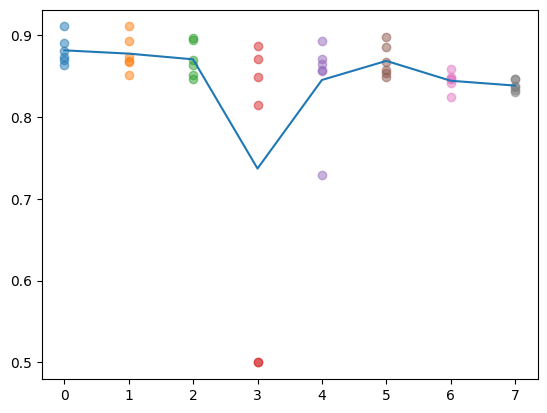

In [ ]:
means=np.zeros(len(models))
for i in range(len(models)):
  plt.scatter(np.ones(6)*i,auc_fold[i],alpha=0.5)
  means[i]=np.mean(auc_fold[i])
plt.plot(means)

In [ ]:
auc_fold

array([[0.90510862, 0.86798759, 0.85578428, 0.87760291, 0.88498789,
        0.87227603],
       [0.88636906, 0.85963237, 0.84230167, 0.89382567, 0.86343826,
        0.87154964],
       [0.88768202, 0.86094533, 0.84747803, 0.88305085, 0.88026634,
        0.87263923],
       [0.89973741, 0.84656243, 0.84169977, 0.86150121, 0.84104116,
        0.87445521],
       [0.86512294, 0.70225591, 0.86186349, 0.85199758, 0.83268765,
        0.78631961],
       [0.89174027, 0.8547386 , 0.84844107, 0.88486683, 0.86937046,
        0.85677966],
       [0.8763428 , 0.83850561, 0.84097749, 0.8566586 , 0.83280872,
        0.8464891 ],
       [0.8325376 , 0.87431368, 0.81425304, 0.83995157, 0.83268765,
        0.79200969]])

## Model selection

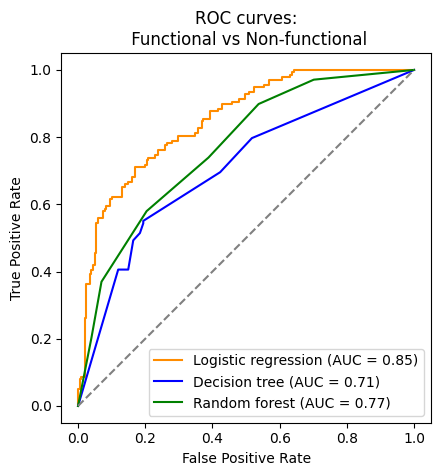

In [ ]:
fig, ax = plt.subplots()
model_displays = {}

model_displays['Logistic']=RocCurveDisplay.from_predictions(y_valid,prob_log[:,1],color="darkorange",name="Logistic regression", ax=ax)
model_displays['Tree']=RocCurveDisplay.from_predictions(y_valid,Pred_tree[:,1],color="blue",name="Decision tree", ax=ax)
model_displays['Forest']=RocCurveDisplay.from_predictions(y_valid,Pred_forest[:,1],color="green",name="Random forest", ax=ax)


plt.axis("square")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC curves:\n Functional vs Non-functional")
plt.plot([0,1],[0,1],'--',color='grey')
plt.legend()
plt.show()

##Evaluation on the test set
Let's now test our best classifier on the artificial sequences.

0.18556726279358904
0.7926221335992024


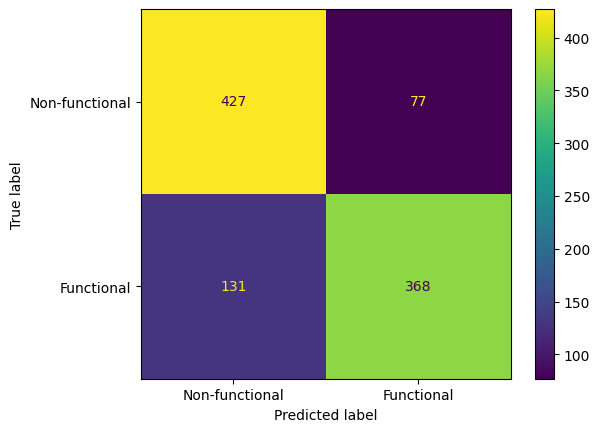

In [ ]:
#OSS: I retrain the best model on the whole training set

strong_classifier.fit(X,Y)
Ada_boost_log=strong_classifier.predict(X_art)
cm = confusion_matrix(Y_art, Ada_boost_log)
print(mutual_info_score(Y_art, Ada_boost_log))

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
print((cm[0,0]+cm[1,1])/np.sum(cm))

0.18855448628151517
0.7946161515453639


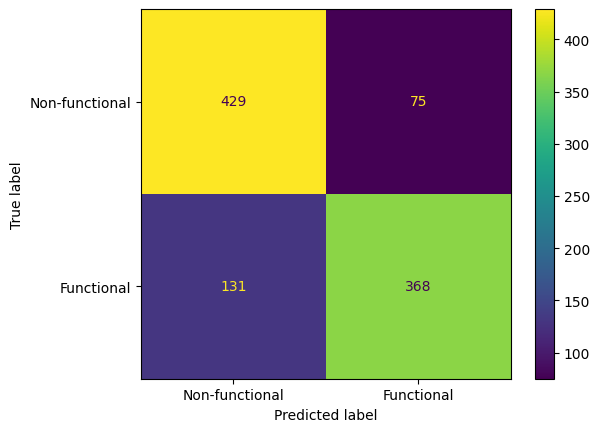

In [ ]:
model_l = RandomForestClassifier(n_estimators=1000, max_depth=15 ,random_state=3)
model_l.fit(X, Y)
Random_forest=model_l.predict(X_art)
cm = confusion_matrix(Y_art, Random_forest)
print(mutual_info_score(Y_art, Random_forest))

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
print((cm[0,0]+cm[1,1])/np.sum(cm))

##Ensemble models


In [ ]:
from sklearn.ensemble import VotingClassifier

#create a dictionary of our models
estimators=[('Ada', strong_classifier), ('rf', model_l),]

#create our voting classifier, inputting our models
ensemble = VotingClassifier(estimators, voting='soft', n_jobs=-1)

ensemble.fit(X, Y)
ensemble_res=ensemble.predict(X_art)
cm = confusion_matrix(Y_art, ensemble_res)
print(mutual_info_score(Y_art, ensemble_res))

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
print((cm[0,0]+cm[1,1])/np.sum(cm))

NameError: name 'strong_classifier' is not defined

In [ ]:
cross_val_label=np.array([])
for fold, (trained, test) in enumerate(cv.split(X, Y)):
        val = Y[test]
        cross_val_label=np.append(cross_val_label,val)


In [ ]:
#Reprouce ideas of http://rasbt.github.io/mlxtend/user_guide/classifier/StackingCVClassifier/

# We create k-folds
# For each element in a fold we associate to it the prediction of the classifier trained on the other folds
#cross_val_label=np.array([])
#for fold, (train, test) in enumerate(cv.split(X, Y))
#    cross_val_label = np.append(cross_val_label,Y[test])
#predicted=np.append(result1, result2, axis=0)

#fit_models=[model_c,ensemble_forest,Ada]
#fit_iso=[model_c]
predicted = np.vstack([preds, preds_iso])
predicted = np.vstack([predicted, np.array(predictions_fold)])

#The metaclassifier will train taking the predictions obtained by the other classifiers and combining them properly
Data=predicted.T
Metaclassifier=LogisticRegression(max_iter=500, n_jobs=-1)
Metaclassifier.fit(Data,cross_val_label)


def StackingCVClassifier(data, model_predict, model_iso, model_network, metaclassifier, data_iso=X_art_iso):
    '''Three steps:
    -predict for each model and take model_l.predict_proba(X[test])[:,1]
    -append each prediction and transposing the result
    -use the Metaclassifier'''

    level1predictions=np.zeros(len(data))
    for model in model_predict:
      level1predictions=np.vstack([level1predictions,model.predict_proba(data)[:,1]])
    for model in model_iso:
      level1predictions=np.vstack([level1predictions,model.predict_proba(data_iso)[:,1]])
    Soft=nn.Softmax()
    for model in model_network:
      data = to_device(torch.Tensor(data),device)
      outputs = model(data)
      predictions = Soft(outputs)
      level1predictions=np.vstack([level1predictions,predictions.cpu()[:,1].detach().numpy()])
    level1predictions=level1predictions[1:]
    return metaclassifier.predict(level1predictions.T) ##We could use predict_proba, then choose a threshold

#Try on the artificial dataset


NameError: name 'preds' is not defined

In [ ]:
Metaclassifier=AdaBoostClassifier(n_estimators = 100, estimator = weak_classifier)
Metaclassifier.fit(Data,cross_val_label)

cm = confusion_matrix(Y_art, StackingCVClassifier(X_art,fit_models,fit_iso,models,Metaclassifier))

disp=ConfusionMatrixDisplay(cm, display_labels=['Non-functional','Functional'])
disp.plot()
print('The accuracy is ', (cm[0,0]+cm[1,1])/np.sum(cm))

NameError: name 'Data' is not defined

In [ ]:
Metaclassifier=RandomForestClassifier()
Metaclassifier.fit(Data,cross_val_label)
Metaclassifier.feature_importances_

array([0.07329686, 0.14311924, 0.12631839, 0.0488975 , 0.08561907,
       0.16279046, 0.0867006 , 0.02869917, 0.07129057, 0.08469907,
       0.04568537, 0.04288369])

In [ ]:
predicted = np.vstack([preds, np.array(predictions_fold)])

#The metaclassifier will train taking the predictions obtained by the other classifiers and combining them properly
Data=predicted.T
Metaclassifier=LogisticRegression(max_iter=500, n_jobs=-1)
Metaclassifier.fit(Data,cross_val_label)
StackingCVClassifier(X_art,fit_models,[],models,Metaclassifier, data_iso=[])

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1518: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return self._call_impl(*args, **kwargs)


array([1., 0., 1., ..., 1., 1., 1.])

# Generative models

## Ising like model

Let's first insert all the elements needed by the algorithm of Belief Propagation.

In [ ]:
class Graph(object):

    def __init__(self):

        self._rvs = {} #a dictionary of rv
        self._factors = [] #a list of factors
        self._connected_comp = []

    def rv(self, name, n_opts):
        '''
        Args:
            name (str)
            n_opts (int) how many values it can take
        returns:
            RV
        '''
        rv = RV(name, n_opts)
        self.add_rv(rv)
        return rv

    def has_rv(self, rv_s):
        '''
        args:
            potential rv
        returns:
            bool
        '''
        return rv_s in self._rvs

    def add_rv(self, rv):
        self._rvs[rv.name]=rv
        self._connected_comp += [[rv.name]]

    def factor(self, rvs, name="", potential=None): #oss:rvs must be already part of the graph: the graph must be done in order, 1st rv, then factors
        for i in range(len(rvs)):
            assert isinstance(rvs[i],(str,RV))
            if isinstance(rvs[i], str):
                rvs[i] = self._rvs[rvs[i]] #if I give a list of name, it looks in the dictionary and change each name with the RV
            assert type(rvs[i]) is RV

        f = Factor(rvs, name, potential)
        self.add_factor(f)

        new_connected=[name]

        for rv in rvs:
            rv.attach(f) #I attach to each rv the factor
            i=0
            while rv.name not in self._connected_comp[i]:
                i+=1
            new_connected += self._connected_comp[i]
            self._connected_comp.remove(self._connected_comp[i])

        self._connected_comp += [new_connected]

        return f

    def add_factor(self, factor):
        self._factors += [factor]

    def find_connected(self, element):
        if not isinstance(element, str):
            el=element.name
        else:
            el=element
        i=0
        while el not in self._connected_comp[i] and i<=len(self._connected_comp):
            i+=1
        if i>len(self._connected_comp):
            return None
        return self._connected_comp[i], i

    def kruskal(self, weight):
        '''
        Given the weights between nodes, this alghoritms adds the links
        (by inserting factors) with smaller weights, checking that it is
        creating cycles. It stops when the tree is built.

        Notice: the function takes the connected components already present in
        the graph. This means that the final result is not a tree if you did
        not start from a forest.

        Args:
            weight is a square matrix
        '''
        weight=np.triu(weight, 1) #we cancel elements in the diagonal and below it
        N=weight.shape[0]
        sort=np.argsort(weight, axis=None)
        for order in sort:
            if len(self._connected_comp)==1:
                break
            #I check that nodes i=order//N, j=order%N are in two different connected components
            if self.find_connected(str(order//N))!=self.find_connected(str(order%N)):
                self.factor([self._rvs[str(order//N)],self._rvs[str(order%N)]], name=f"J_{order//N},{order%N}", potential=0.3)

    #def zero_connected_components(self):
    #    self._connected_comp += [[list(self._rvs.keys())[i]] for i in range(len(self._rvs.keys()))] #+ [[self._factors[i]] for i in range(len(self._factors))]

class RV(object):
    def __init__(self, name, n_opts):

        self.name = name
        self.n_opts=n_opts
        self._factors=[] #each random variable has a list of its neighbouring factors
        self._incoming_msg = None
        self._beliefs = None

    def n_edges(self):
        return len(self._factors)

    def attach(self, factor): #I create a function to connect a RV to a factor
            for f in self._factors:
                assert f!=factor, "Can't re-add factor %r to rv %r" % (factor,self)
            self._factors += [factor]

    def magn(self):
        return -self._beliefs[0]+self._beliefs[1]

class Factor(object):
    def __init__(self, rvs, name="", potential=None):
        self.name = name
        self._rvs = [] #as above, each factor has a list of neighbouring RV
        self.potential = potential
        self._incoming_msg = None
        self._beliefs = None
        for rv in rvs:
            self.attach(rv)

    def n_edges(self):
        return len(self._rvs)

    def attach(self, rv):
            for rvs in self._rvs:
                assert rvs!=rv, "Can't re-add factor %r to rv %r" % (rvs,self)
            self._rvs += [rv]

    def corr(self):
        return self._beliefs[0]+self._beliefs[3]-self._beliefs[1]-self._beliefs[2]



In [ ]:
import copy

class messages:

    def __init__(self, ising_model, T):
        '''
        ising model is the Graph structure
        T is the temperature
        '''
        self.graph = copy.deepcopy(ising_model)
        self.beta = 1/T
        self.configurations = []


        # initialize to 0.1 the msgs to down spins
        # and to 1 the msgs to up spins
        for i in self.graph._rvs.values():
            l = len(i._factors)
            i._incoming_msg = [np.ones(l)*0.7, np.ones(l)] #we have as many messages to a rv as the factors connected to it
        for i in self.graph._factors:
            l = len(i._rvs)
            i._incoming_msg = [[0.7,1]]*l

    def psi_ij(self, link, s1, s2): #Hamiltonian is given as H=- (sum J_ij s_is_j) - sum h_i s_i
        J = link.potential
        return np.exp(self.beta*s1*s2*J)

    def psi_i(self, field, s):
        h = field.potential
        return np.exp(self.beta*s*h)

    def _variable_to_factor_messages(self, variable, factor):

        not_factor=[i!=factor for i in variable._factors]
        # Take the product over all incoming factors into this variable except the variable

        mex0=1
        mex1=1
        for i in range(len(not_factor)):
            if not_factor[i]:
                mex0*=variable._incoming_msg[0][i]
                mex1*=variable._incoming_msg[1][i]

        to_change_index=np.where(np.array([i==variable for i in factor._rvs])==True)[0][0]
        #factor._incoming_msg[to_change_index][1]=mex0
        #factor._incoming_msg[to_change_index][0]=mex1
        return [mex0, mex1], to_change_index

    def _factor_to_variable_messages(self, factor, variable):
        # Compute the product
        not_variable=[i!=variable for i in factor._rvs]

        number_neigh = factor.n_edges()
        to_change_index=np.where(np.array([i==factor for i in variable._factors])==True)[0][0]
        output=[]
        #This is specific for the Ising model: only two cases are possible: the factor is a field or a link
        for s in [-1,1]: #value of variable we are passing message to
            if number_neigh == 1:
                mex0=self.psi_i(factor, s)
            if number_neigh == 2:
                mex0=self.psi_ij(factor,s,-1)*factor._incoming_msg[np.where(np.array(not_variable)==True)[0][0]][0]
                mex0+=self.psi_ij(factor,s,+1)*factor._incoming_msg[np.where(np.array(not_variable)==True)[0][0]][1]
                #2*np.cosh(self.beta*s*factor.potential)*factor._incoming_msg[np.where(np.array(not_variable)==True)[0][0]][int((s+1)/2)]
            #variable._incoming_msg[s][to_change_index]=mex0
            output.append(mex0)
        return output, to_change_index

    def one_node_marginal(self, variable):
        b=[]
        for i in variable._incoming_msg:
            b.append(np.prod(i))
        b=np.array(b)/np.sum(np.array(b))

        variable._beliefs=b


    def link_marginal(self, factor):
        #we create a four elements array with [-1,-1],[-1,1],[1,-1],[1,1]
        bel=[0,0,0,0]
        bel[0]=self.psi_ij(factor,-1,-1)*factor._incoming_msg[0][0]*factor._incoming_msg[1][0]
        bel[1]=self.psi_ij(factor,-1,1)*factor._incoming_msg[0][0]*factor._incoming_msg[1][1]
        bel[2]=self.psi_ij(factor,1,-1)*factor._incoming_msg[0][1]*factor._incoming_msg[1][0]
        bel[3]=self.psi_ij(factor,1,1)*factor._incoming_msg[0][1]*factor._incoming_msg[1][1]
        if np.sum(np.array(bel))==0:
          print('Factor ', factor.name, 'has a problem: ', factor._incoming_msg)
        bel=np.array(bel)/np.sum(np.array(bel))

        factor._beliefs=bel


    def update_msg(self):
        graphc=copy.deepcopy(self.graph)

        new_msg_list=[]
        #iterate over all graph
        for node in list(self.graph._rvs.values()):
            #iterate over nn of the current node
            for factor in node._factors:
                #iterate over states of the node
                msg, index = self._factor_to_variable_messages(factor, node)
                for s in [0,1]:
                        #update must be done in parallel
                        graphc._rvs[node.name]._incoming_msg[s][index]=msg[s]
                        new_msg_list.append(msg[s])
        for node in graphc._factors:
            #iterate over nn of the current node
            for variable in node._rvs:
                #iterate over states of the node
                msg, index = self._variable_to_factor_messages(variable, node)

                #update must be done in parallel
                for s in [0,1]:
                    #factor._incoming_msg[to_change_index][1]=mex0
                    #factor._incoming_msg[to_change_index][0]=mex1
                    node._incoming_msg[index][s]=msg[s]
                    new_msg_list.append(msg[s])

        # normalize the messages
        #if np.sqrt(np.max(new_msg_list))>10**3:
        #      norm=np.sqrt(np.max(new_msg_list))
        #else:
        norm=10**3
        error=[]

        for node in list(self.graph._rvs.values()):
            for s in [0,1]:
                error.append(self.graph._rvs[node.name]._incoming_msg[s]-graphc._rvs[node.name]._incoming_msg[s]/norm)
                self.graph._rvs[node.name]._incoming_msg[s]=graphc._rvs[node.name]._incoming_msg[s]/norm
        error2=[]
        i=0
        for i in range(len(graphc._factors)):
            error2.append(np.array(self.graph._factors[i]._incoming_msg)-np.array(graphc._factors[i]._incoming_msg)/norm)
            self.graph._factors[i]._incoming_msg=np.array(graphc._factors[i]._incoming_msg)/norm
        error=np.concatenate(error)
        error2=np.concatenate(error2).reshape(-1)
        error=np.concatenate([error,error2])

        return error


    def recursive_factor_sample(self, factor, variable, spin):
        if factor.name[0]=='J':
            index=1
            for i in factor._rvs:
                if i!=variable:
                    position2=int(i.name)
                    variablebis=i
                    break
                else:
                    index=0 #index is one if the variable I come from is the second appearing in the list, 0 if it is the first

            whole_bel=factor._beliefs
            if index==0 and spin==-1:
                norm=whole_bel[0]+whole_bel[1]
                conditional_marginal=[whole_bel[0]/norm,whole_bel[1]/norm]
            if index==0 and spin==+1:
                norm=whole_bel[2]+whole_bel[3]
                conditional_marginal=[whole_bel[2]/norm,whole_bel[3]/norm]
            if index==1 and spin==-1:
                norm=whole_bel[0]+whole_bel[2]
                conditional_marginal=[whole_bel[0]/norm,whole_bel[2]/norm]
            if index==1 and spin==+1:
                norm=whole_bel[1]+whole_bel[3]
                conditional_marginal=[whole_bel[1]/norm,whole_bel[3]/norm]

            spinbis=np.random.choice([-1,1], p=conditional_marginal)
            self.configuration[position2]=spinbis
            for factorbis in variablebis._factors:
                if factorbis!= factor:
                    self.recursive_factor_sample(factorbis, variablebis, spinbis)



    def sample_from_tree(self):
        self.configuration=np.zeros([len(self.graph._rvs.keys())])

        #I take the first variable and use it
        variable=list(self.graph._rvs.values())[0]
        position=int(variable.name)
        spin=np.random.choice([-1,1], p=variable._beliefs)
        self.configuration[position]=spin
        for factor in variable._factors:
            self.recursive_factor_sample(factor, variable, spin)



In [ ]:
def belief_step(Belief_prop_graph, max_iter=1920):
    A=np.array(1e7)
    itera=1
    print('First iteration')
    while ((not np.allclose(A**2,0)) and itera<max_iter):
        itera+=1
        A=Belief_prop_graph.update_msg()
        print('Iteration ', itera, 'rmse:', np.sqrt(np.sum(A**2)))

In [ ]:
class adaptive_grad():
    def __init__(self, theta: np.array, objective: np.array, l=0, eta=0, gamma=1e-2, eps=1e-10, sum_state=0, beta=0.5):
        self.theta=theta #all the parameters hi, Jij
        self.objective=objective #the array of the value of the magnetisations and covariances to reach

        self.gamma=gamma #learning rate
        self.l=l #for an L2 like penalty
        self.eta=eta #learning rate decay
        self.eps=eps #regularisation
        self.beta=beta #normalize sum state

        self.sum_state=sum_state #for the initialization of the algo

    def new_theta(self, averages, t):
        '''
        It takes the computed averages and used them to compute the gradient
        '''
        gt=-self.objective+averages  #This is -grad: we are using the hamiltonian with opposite signs!!!!
        gt[np.where(np.isnan(gt))]=0 ###!!!!
        gamma2=self.gamma/(1+(t-1)*self.eta)
        if self.l!=0:
            gt=gt+self.l*self.theta
        self.sum_state=self.beta*self.sum_state+(1-self.beta)*gt**2
        self.theta=self.theta-gamma2*gt/(np.sqrt(self.sum_state)+self.eps)

        return self.theta, np.sqrt(np.sum(gt**2))


Let's test the computation of MI using an example from Braunstein's course.

In [ ]:
X_test=np.array([[1,1,1,-1,1],[1,-1,1,-1,1],[1,1,1,-1,1],[-1,-1,1,1,1],[-1,1,-1,1,-1],[-1,1,1,-1,-1]])
m=np.sum(X_test, axis=0)/X_test.shape[0]
Cor=X_test.T@X_test/X_test.shape[0]

MI=np.zeros([5,5])
for i in range(5):
    for j in range(i+1,5):
        p_i = [(1-m[i])/2,(1+m[i])/2]
        p_j = [(1-m[j])/2,(1+m[j])/2]
        p_ij = 0 ## --, -+, +-, ++
        for s1 in [-1,1]:
            for s2 in [-1,1]:
                p_ij=(1/4*(Cor[i,j]*s1*s2+m[i]*s1+m[j]*s2+1))
                #print('Spins:',s1,s2,'\tPos:',i+1,j+1, '\t', p_i[int((s1+1)/2)], p_j[int((s1+1)/2)], p_ij)
                if p_ij!=0:
                    MI[i,j]+=p_ij*np.log2(p_ij/p_i[int((s1+1)/2)]/p_j[int((s2+1)/2)])
print(MI)

[[0.         0.         0.1908745  0.45914792 0.45914792]
 [0.         0.         0.10917034 0.04411042 0.25162917]
 [0.         0.         0.         0.31668909 0.31668909]
 [0.         0.         0.         0.         0.04411042]
 [0.         0.         0.         0.         0.        ]]


Let's now check Belief propagation on a model on which we can compute everything by hand:

In [ ]:
#Let's see what should happen for an hamiltonian such as:
##H=-J12 s1 s2 -h1s1 -h2s2
print("Let's see the probabilities for H=-J12 s1 s2 -h1s1 -h2s2")

J12=-2
h1=2
h2=1.5
h=[h1,h2]
T=2
print(f"With J12={J12}, h1={h1}, h2={h2} at temperature T={T}")
#ordered as --,-+,+-,++
order=['--','-+','+-','++']
p=np.array([np.exp(-1/T*(-J12+h1+h2)),np.exp(-1/T*(J12+h1-h2)),np.exp(-1/T*(J12-h1+h2)),np.exp(-1/T*(-J12-h1-h2))])
p=p/np.sum(p)
for i in range(4):
    print(order[i],':\t',p[i])
p1p=p[1]+p[3]
p1m=p[0]+p[2]
p0p=p[3]+p[2]
p0m=1-p0p
m1=p1p-p1m
m0=p0p-p0m
print(r'p_1(+)',p[1]+p[3], r'p_1(-)',p[0]+p[2],'\n', r'p_0(+)', p[3]+p[2], r'p_0(-)', 1-p[3]-p[2])

Let's see the probabilities for H=-J12 s1 s2 -h1s1 -h2s2
With J12=-2, h1=2, h2=1.5 at temperature T=2
-- :	 0.008208222649468081
-+ :	 0.2718190028147104
+- :	 0.4481537717211111
++ :	 0.2718190028147104
p_1(+) 0.5436380056294208 p_1(-) 0.45636199437057917 
 p_0(+) 0.7199727745358215 p_0(-) 0.2800272254641785


In [ ]:
#Let's create the graph and compute the objective
Tree=Graph()
for i in range(2):
    Tree.rv(str(i),2)
    Tree.factor([str(i)], name=f'h_{i}', potential=+np.random.uniform())
Tree.factor(['0','1'], name="J_1,2", potential=+np.random.uniform())

Belief_prop_graph = messages(Tree,T)

objective=np.array([p[0]+p[3]-p[1]-p[2],m0,m1])
objective

array([-0.43994555,  0.43994555,  0.08727601])

In [ ]:
theta=np.zeros([2+1])

index=0
for factor in Belief_prop_graph.graph._factors:
      if factor.name[0]=='J':
        print(factor.name)
        lista=factor.name[2:].split(',')
        i=int(lista[0])
        j=int(lista[1])
        theta[index]=factor.potential
        index+=1

for rv in Belief_prop_graph.graph._rvs.values():
    i=int(rv.name[:2])
    print(rv.name)
    for factor in rv._factors:
        if factor.name[0]=='h':
            theta[index]=factor.potential
            break
    index+=1
print(theta)

J_1,2
0
1
[0.77378285 0.46650984 0.79250236]


In [ ]:
error=[1e5]
thr=1e-3
max_iter=1e4
iteration=1
averages=np.zeros([2+1])

#initialize grad
grad = adaptive_grad(theta, np.array(objective),eta=0.01, beta=0.5)

while error[-1]>thr and iteration<max_iter:
  print('\n Cycle:',iteration)
  belief_step(Belief_prop_graph)

  #compute marginals and averages
  index=0
  for factor in Belief_prop_graph.graph._factors:
    if factor.name[0]=='J':
      Belief_prop_graph.link_marginal(factor)
      averages[index]=factor.corr()
      index+=1
  for rv in Belief_prop_graph.graph._rvs.values():
    Belief_prop_graph.one_node_marginal(rv)
    averages[index]=rv.magn()
    index+=1

  #gradient step
  par, error0 = grad.new_theta(averages, iteration)
  error.append(error0)

  #update theta
  index=0
  for factor in Belief_prop_graph.graph._factors:
    if factor.name[0]=='J':
      factor.potential=par[index]
      print('Ichanged to', par[index], index)
      index+=1

  for rv in Belief_prop_graph.graph._rvs.values():
    for factor in rv._factors:
      if factor.name[0]=='h':
        factor.potential=par[index]
        print('Ichanged to', par[index], index)
        index+=1
        break

  iteration+=1
  print('Error was', error0,'\n----------------------')

Output streaming troncato alle ultime 5000 righe.
Ichanged to -1.541291660009246 0
Ichanged to 1.6158605461761275 1
Ichanged to 1.1002476317190892 2
Error was 0.04110243136824498 
----------------------

 Cycle: 911
First iteration
Iteration  2 rmse: 9.767769726129302e-07
Ichanged to -1.54227737475365 0
Ichanged to 1.616923992935453 1
Ichanged to 1.1015046457198512 2
Error was 0.040822631525676695 
----------------------

 Cycle: 912
First iteration
Iteration  2 rmse: 2.3659293300364973e-06
Ichanged to -1.5432645785258534 0
Ichanged to 1.6170424522561522 1
Ichanged to 1.1021445532911043 2
Error was 0.040842906915787194 
----------------------

 Cycle: 913
First iteration
Iteration  2 rmse: 8.491423814682004e-07
Ichanged to -1.544248749932221 0
Ichanged to 1.618308293646653 1
Ichanged to 1.1032110327510865 2
Error was 0.040597938434780025 
----------------------

 Cycle: 914
First iteration
Iteration  2 rmse: 2.4697738291722377e-06
Ichanged to -1.54523399269765 0
Ichanged to 1.618893587

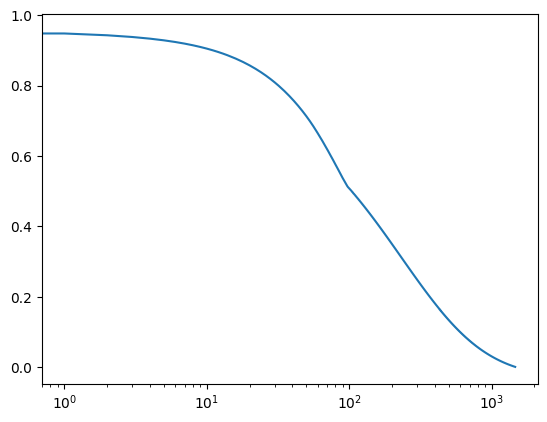

In [ ]:
plt.plot(error[1:])
plt.xscale('log')

We can now see the results at the end

In [ ]:
for factor in Belief_prop_graph.graph._factors:
    print(factor.name,'\t', factor.potential)

h_0 	 1.9779993338048243
h_1 	 1.4776056070138601
J_1,2 	 -1.9766311449588858


Let's finally test the sampling part.

In [ ]:
sample=np.zeros(2)
for i in range(100000):
    Belief_prop_graph.sample_from_tree()
    sample=np.vstack([sample, Belief_prop_graph.configuration])
sample=sample[1:]

In [ ]:
m=np.mean(sample, axis=0)

In [ ]:
Cor=sample.T@sample/len(sample)


p_i = [(1-m[0])/2,(1+m[0])/2]
p_j = [(1-m[1])/2,(1+m[1])/2]
print('p_i=',p_i,'p_j=', p_j)
p_ij = 0 ## --, -+, +-, ++
for s1 in [-1,1]:
    for s2 in [-1,1]:
        p_ij=(1/4*(Cor[0,1]*s1*s2+m[0]*s1+m[1]*s2+1))
        print(s1, s2, p_ij)

p_i= [0.27996, 0.72004] p_j= [0.45659, 0.54341]
-1 -1 0.009209999999999996
-1 1 0.27075
1 -1 0.44738
1 1 0.27266


After this test we can try to run the same procedure with our dataset.

In [ ]:
X_ising = X*2-1

In [ ]:
m=np.sum(X_ising, axis=0)/X_ising.shape[0]
Cov=X_ising.T@X_ising/X_ising.shape[0]

In [ ]:
MI=np.zeros([1920,1920])
# p+ + p- = m; p+ + 1 = 1

for i in range(1920):
  for j in range(i+1,1920):
    p_i = [(1-m[i])/2,(1+m[i])/2]
    p_j = [(1-m[j])/2,(1+m[j])/2]
    p_ij = 0 ## --, -+, +-, ++
    for s1 in [-1,1]:
      for s2 in [-1,1]:
        p_ij=(1/4*(Cov[i,j]*s1*s2+m[i]*s1+m[j]*s2+1))
        #print(s1,s2,i+1,j+1, '\t', p_i[int((s1+1)/2)], p_j[int((s1+1)/2)], p_ij)
        if p_ij>1e-5:
          MI[i,j]+=p_ij*np.log2(p_ij/p_i[int((s1+1)/2)]/p_j[int((s2+1)/2)])

We can create the maximum spanning tree (using kruskal algorithm with inverted sign of MI)

Oss: we initialize the fields with their values for the edge free model, 'J_ij' are initialised as constants (0.3 in the kruskal algo defined above)

In [ ]:
init_m = lambda mi : np.arctanh(-mi) if mi!= -1 and np.arctanh(-mi)>-5 and np.arctanh(-mi)<5 else -5*mi/abs(mi)
T=Graph()
for i in range(1920):
    T.rv(str(i),2)
    T.factor([str(i)], name=f'h_{i}', potential=init_m(m[i]))
T.kruskal(-MI)

So, so far we created the best possible tree and we have the code to compute message passing and beliefs. Since we know that
$$
H=-\sum J_{ij} s_i s_j -\sum_i h_i s_i\\
\frac{∂ L}{∂h_i} ∝\tilde{m_i} - <s_i>\\
\frac{∂ L}{∂J_{ij}} ∝ \tilde{c_{ij}} - <s_i s_j>
$$
we can easily define an alghorithm of gradient ascent to optimize the parameters.
Notice that only the $J_{ij}$ presented in the tree will contribute to the likelihood, so, only a very small part of the whole matrix $\tilde{c_{ij}}$ is actually considered at each step.

Furthermore it could be easy to make it stochastic, generating $\tilde{m_i},\tilde{c_{ij}}$ from sub samples of the dataset.


In [ ]:
temperature=1
Belief_prop_graph = messages(T,temperature)

In [ ]:
objective=np.zeros([1920+1919])
theta=np.zeros([1920+1919])


index=0
for factor in Belief_prop_graph.graph._factors:
  if factor.name[0]=='J':
    lista=factor.name[2:].split(',')
    i=int(lista[0])
    j=int(lista[1])
    objective[index]=Cov[i,j]
    theta[index]=factor.potential
    index+=1

for rv in Belief_prop_graph.graph._rvs.values():
  i=int(rv.name[:2])
  objective[index]=m[i]
  for factor in rv._factors:
    if factor.name[0]=='h':
      theta[index]=factor.potential
      break
  index+=1

In [ ]:
error=[1e5]
thr=2*1e-3
max_iter=3e4
iteration=1
averages=np.zeros([1920+1919])

#initialize grad
grad = adaptive_grad(theta, objective, eta=0.01, beta=0.5, gamma=0.1)

while error[-1]>thr and iteration<max_iter:
  print('\n Cycle:',iteration)
  belief_step(Belief_prop_graph)

  #compute marginals and averages
  index=0
  for factor in Belief_prop_graph.graph._factors:
    if factor.name[0]=='J':
      Belief_prop_graph.link_marginal(factor)
      if not np.isnan(factor.corr()):
        averages[index]=factor.corr()
      else: averages[index]=0
     # else:
     #   print(factor._incoming_msg, factor._beliefs)
      index+=1
  for rv in Belief_prop_graph.graph._rvs.values():
    Belief_prop_graph.one_node_marginal(rv)
    if not np.isnan(rv.magn()):
      averages[index]=rv.magn()
    else: averages[index]=0
    #else:
    #  print(rv._incoming_msg, rv._beliefs)
    index+=1

  #gradient step
  par, error0 = grad.new_theta(averages, iteration)
  error.append(error0)

  #update theta
  index=0
  for factor in Belief_prop_graph.graph._factors:
    if factor.name[0]=='J':
      factor.potential=par[index]
      #print('Ichanged to', par[index], index)
      index+=1

  for rv in Belief_prop_graph.graph._rvs.values():
    for factor in rv._factors:
      if factor.name[0]=='h':
        factor.potential=par[index]
        #print('Ichanged to', par[index], index)
        index+=1
        break

  iteration+=1
  print('Error was', error0,'\n----------------------')


 Cycle: 1
First iteration
Iteration  2 rmse: 7.114497408590155e+48
Iteration  3 rmse: 5.078824992432981e+61
Iteration  4 rmse: 5.078825020597854e+61
Iteration  5 rmse: 5.3487416848145674e+57
Iteration  6 rmse: 1.2045998792182271e+55
Iteration  7 rmse: 8.169103334150487e+51
Iteration  8 rmse: 5.941974599007739e+48
Iteration  9 rmse: 1.2932654611379192e+46
Iteration  10 rmse: 8.950323240605711e+24
Iteration  11 rmse: 8.843680368572375e-14
Factor  J_407,409 has a problem:  [[0.00000000e+00 0.00000000e+00]
 [2.44867717e-10 6.88740108e-10]]
Factor  J_687,697 has a problem:  [[0.00079114 0.001264  ]
 [0.         0.        ]]
Factor  J_1763,1773 has a problem:  [[1.43711867e-17 9.60428855e-17]
 [0.00000000e+00 0.00000000e+00]]
Factor  J_700,705 has a problem:  [[0. 0.]
 [0. 0.]]
Factor  J_1251,1352 has a problem:  [[0.00000000e+000 0.00000000e+000]
 [4.74982777e-149 4.75706695e-146]]
Factor  J_1697,1766 has a problem:  [[0. 0.]
 [0. 0.]]
Factor  J_636,1766 has a problem:  [[0.00035741 0.0027

<ipython-input-121-cd7ce3893395>:86: RuntimeWarning: invalid value encountered in divide
  bel=np.array(bel)/np.sum(np.array(bel))


 has a problem:  [[5.54693072e-64 7.70504161e-63]
 [0.00000000e+00 0.00000000e+00]]
Factor  J_697,1023 has a problem:  [[4.43994033e-19 3.40110040e-18]
 [0.00000000e+00 0.00000000e+00]]
Factor  J_790,1705 has a problem:  [[0.00022402 0.00446385]
 [0.         0.        ]]
Factor  J_635,1745 has a problem:  [[0.00040318 0.0024803 ]
 [0.         0.        ]]
Factor  J_1240,1251 has a problem:  [[0.00000000e+000 0.00000000e+000]
 [2.01160512e-311 9.83187963e-309]]
Factor  J_1583,1919 has a problem:  [[0.         0.        ]
 [0.00031838 0.00314092]]
Factor  J_342,351 has a problem:  [[0.00000000e+000 0.00000000e+000]
 [9.72616155e-135 1.85959656e-131]]
Factor  J_1571,1584 has a problem:  [[1.49799835e-06 3.86442004e-05]
 [0.00000000e+00 0.00000000e+00]]
Factor  J_89,343 has a problem:  [[0.00028881 0.00346244]
 [0.         0.        ]]
Factor  J_311,380 has a problem:  [[0.00000000e+00 0.00000000e+00]
 [8.80694483e-22 1.19450504e-20]]
Factor  J_1662,1793 has a problem:  [[0.00000000e+00 0.

<ipython-input-121-cd7ce3893395>:72: RuntimeWarning: invalid value encountered in divide
  b=np.array(b)/np.sum(np.array(b))


Iteration  2 rmse: 0.4128893234931682
Iteration  3 rmse: 0.005643639261745836
Iteration  4 rmse: 1.8978266006446664e-05
Factor  J_407,409 has a problem:  [[0.00000000e+00 0.00000000e+00]
 [2.78927845e-10 3.47161622e-10]]
Factor  J_687,697 has a problem:  [[0.00091132 0.00109731]
 [0.         0.        ]]
Factor  J_1763,1773 has a problem:  [[9.52219251e-18 8.23461598e-17]
 [0.00000000e+00 0.00000000e+00]]
Factor  J_700,705 has a problem:  [[0. 0.]
 [0. 0.]]
Factor  J_1251,1352 has a problem:  [[0.00000000e+000 0.00000000e+000]
 [1.22549912e-149 6.46036361e-146]]
Factor  J_1697,1766 has a problem:  [[0. 0.]
 [0. 0.]]
Factor  J_636,1766 has a problem:  [[0.00041171 0.0024289 ]
 [0.         0.        ]]
Factor  J_1093,1766 has a problem:  [[3.66702290e-45 1.73132843e-43]
 [0.00000000e+00 0.00000000e+00]]
Factor  J_1584,1766 has a problem:  [[1.04963350e-45 2.25664752e-43]
 [0.00000000e+00 0.00000000e+00]]
Factor  J_1107,1109 has a problem:  [[2.36671927e-06 1.06219482e-05]
 [0.00000000e+0

KeyboardInterrupt: ignored

In [ ]:
[i.name for i in Belief_prop_graph.graph._factors][-1]

'J_1502,138'

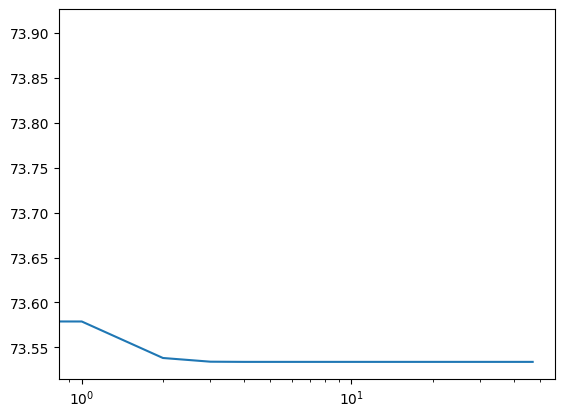

In [ ]:
plt.plot(error[1:])
plt.xscale('log')

In [ ]:
sample=np.zeros(1920)
for i in range(2):
    Belief_prop_graph.sample_from_tree()
    sample=np.vstack([sample, Belief_prop_graph.configuration])
sample=sample[1:]

ValueError: ignored

In [ ]:
m=np.mean(sample, axis=0)

In [ ]:
Cor=sample.T@sample/len(sample)

## One-hot encode with '-'

In [ ]:
# we do a different one hot encoding
def one_hot_encode1(seq):
    mapping = dict(zip("ACDEFGHIKLMNPQRSTVWY-", range(21)))
    seq2 = [mapping[i] for i in seq]
    seq2 = np.eye(21)[seq2]
    return seq2

def seq_to_data1(sequences, deflines):
  X=[]
  Y=[]
  for i in range(len(deflines)):
    X.append(one_hot_encode1(sequences[i]).flatten())
    if deflines[i][-2] == 'u':
      Y.append(1)
    else:
      Y.append(0)
  X=np.array(X)
  Y=np.array(Y)
  return X, Y
X1,Y1=seq_to_data1(sequences_nat, deflines_nat)
Xart1, Yart1 = seq_to_data1(sequences_art, deflines_art)
print(np.shape(X1[1,:]))

(2016,)


## GMM

In [ ]:
from sklearn.mixture import GaussianMixture as GMM
gmm = GMM(k_scree_nat, max_iter=5000, random_state= 30, init_params='k-means++')
gmm.fit(X1)
y_GMM = gmm.predict(X1)

In [ ]:
samples = gmm.sample(1000) #1000*dimesione punti (96*21)

In [ ]:
sample2 = samples[0]

In [ ]:
def one_hot_to_one_hot(sample2):
  proteins = np.zeros(96*20)
  for elm in sample2:
    sample = elm
    sample = sample.reshape((96,21))
    protein = []
    I_s = []
    for i in range(len(sample)):
      I_s.append(np.argmax(sample[i,:]))
    samplebis=np.eye(21)[I_s]
    proteins=np.vstack([proteins,samplebis[:,:-1].reshape(-1)])
  proteins=proteins[1:]
  return proteins
proteins=one_hot_to_one_hot(sample2)

In [ ]:
X_generative = pca.transform(proteins)

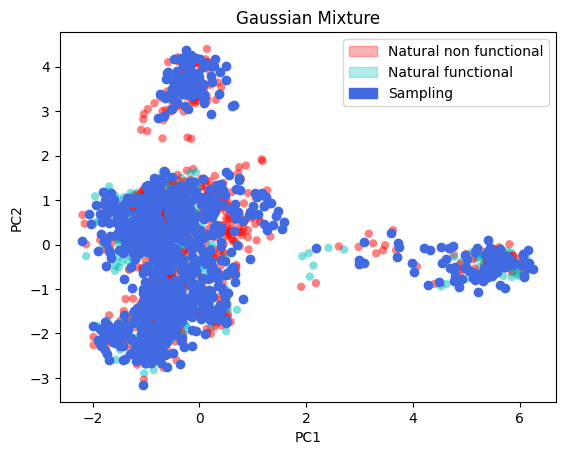

In [ ]:
plt.scatter(Xproj[:, 0], Xproj[:, 1], c=Y, edgecolor='none', cmap=colors, alpha=0.5)
plt.scatter(X_generative[:,0],X_generative[:,1], c='royalblue')
plt.title('Gaussian Mixture')
plt.xlabel('PC1')
plt.ylabel('PC2')

red_patch_nat = mpatches.Patch(color='r', alpha=0.3, label='Natural non functional')
blue_patch_nat = mpatches.Patch(color='c', alpha=0.3, label='Natural functional')
blue_patch_sample = mpatches.Patch(color='royalblue', label='Sampling')

plt.legend(handles=[red_patch_nat,  blue_patch_nat, blue_patch_sample ],loc="upper right")


In [ ]:
Cov0=X.T@X/X.shape[0]
m0=np.sum(X, axis=0)/X.shape[0]

m_gmm=np.sum(proteins, axis=0)/proteins.shape[0]
Cov_gmm=proteins.T@proteins/1000

E0=Cov0-np.outer(m0,m0)
E_gmm=Cov_gmm-np.outer(m_gmm,m_gmm)

In [ ]:
Cov0=X.T@X/X.shape[0]
m0=np.sum(X, axis=0)/X.shape[0]

m_gmm=np.sum(proteins, axis=0)/proteins.shape[0]
Cov_gmm=proteins.T@proteins/1000

In [ ]:
E0=Cov0-np.outer(m0,m0)
E_gmm=Cov_gmm-np.outer(m_gmm,m_gmm)

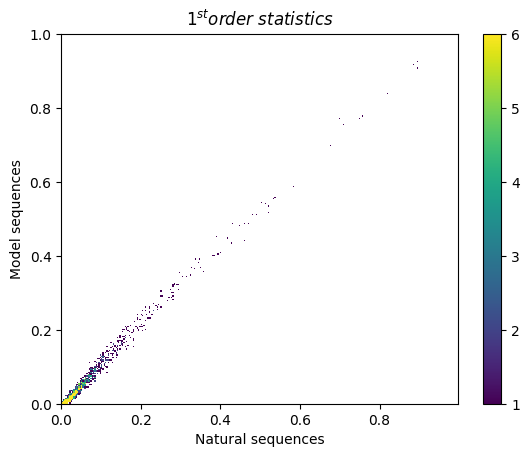

In [ ]:
plt.hist2d(m0, m_gmm, bins=300, cmap='viridis',cmin=0.01, vmax=6)
plt.colorbar()
plt.title(r'$1^{st}order \ statistics$')
plt.xlabel('Natural sequences')
plt.ylabel('Model sequences')
plt.savefig('1storder.png')

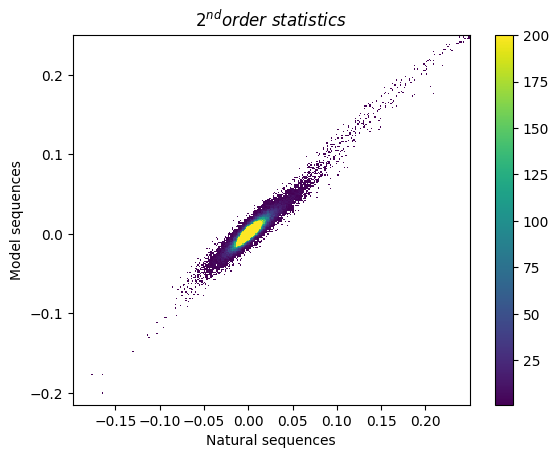

In [ ]:
plt.hist2d(E0[np.triu_indices(1920)], E_gmm[np.triu_indices(1920)], bins=300, cmap='viridis', cmin=0.01, vmax=200)
plt.colorbar()
plt.title(r'$2^{nd}order \ statistics$')
plt.xlabel('Natural sequences')
plt.ylabel('Model sequences')
plt.savefig('2ndorder.png')

In [ ]:
check_functional=StackingCVClassifier(proteins,fit_models,[],models,Metaclassifier, data_iso=[])

NameError: name 'StackingCVClassifier' is not defined

In [ ]:
np.shape(np.where(check_functional==1)[0])

NameError: name 'check_functional' is not defined

In [ ]:
print(Y.shape)
np.shape(np.where(Y==1))

(1130,)


(1, 423)

## RBM


We implement Gelman Rubin as in [8]

In [ ]:
from sklearn.neural_network import BernoulliRBM

def Gelman_Rubin_criterion(chains,burn_in,n_chains,min_iterations,k=3):
  L=chains[1][burn_in:][::k].shape[0]
  N=chains[0].shape[1]
  chain_mean=[]
  grand_mean=np.zeros(N)
  within_var=[]
  for i in range(n_chains):
    chain_mean.append(np.sum(chains[i][burn_in:][::k], axis=0)/L)
    sum=0
    for j in range(L):
      sum+=(chains[i][burn_in+k*j]-chain_mean[-1])**2
    within_var.append(sum/(L-1))
    grand_mean+=chain_mean[-1]/n_chains
  B=np.zeros(N)
  W=np.zeros(N)
  for i in range(n_chains):
    B+=L/(n_chains-1)*(chain_mean[i]-grand_mean)**2
    W+=1/n_chains*within_var[i]
  drop=np.where(W==0)
  R=np.delete((L-1)/L+B/W/L,drop)
  return R , drop[0][0]



def MCMC_step(initial, min_iterations, burn_in, max_iterations, n_chains, rbm, Gr_thr=1.2, k=5):
  samples=[[]]*n_chains
  for i in range(n_chains): #We create a list (n_chains elm) of matrices
    samples[i]=[initial[i]]
  for j in range(max_iterations):
    for i in range(n_chains):
      samples[i]=np.vstack([samples[i],rbm.gibbs(samples[i][-1])])
    if j>=min_iterations and (j-min_iterations)%int(min_iterations/10)==0:
      GR, dropped = Gelman_Rubin_criterion(samples, burn_in, n_chains, min_iterations, k=k)
      print("At iterations: ", j, " The mean Gelman-Rubin statistics is ", np.mean(GR), "Maximum is ", np.max(GR), "Dropped: ", dropped)
      if (GR<=Gr_thr).all():
        break
  final_sample=samples[0][-(min_iterations-burn_in):][::k]
  for i in range(n_chains-1):
    final_sample=np.vstack([final_sample, samples[i+1][-(min_iterations-burn_in):][::k]])
  return final_sample

In [ ]:
Sample2=MCMC_step(initial, 1500, 200, 2000, 4, rbm)

NameError: name 'initial' is not defined

In [ ]:
Sample2 = one_hot_to_one_hot(Sample2)
Xprojsample=pca.transform(Sample2)
plt.scatter(Xproj[:, 0], Xproj[:, 1], c=Y, edgecolor='none', alpha=0.5,
            cmap=colors)
plt.scatter(Xprojsample[:, 0], Xprojsample[:, 1], edgecolor='none', alpha=1)
plt.show()

NameError: name 'Sample2' is not defined



 -------------------------------------------- 

 [0.0031622776601683794,10,96]
[BernoulliRBM] Iteration 1, pseudo-likelihood = -1051.27, time = 1.10s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -546.06, time = 1.19s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -558.25, time = 1.40s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -596.10, time = 1.29s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -638.87, time = 1.03s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -684.68, time = 0.92s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -639.73, time = 0.99s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -528.71, time = 1.03s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -463.99, time = 1.58s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -431.82, time = 1.43s
[BernoulliRBM] Iteration 11, pseudo-likelihood = -427.62, time = 1.16s
[BernoulliRBM] Iteration 12, pseudo-likelihood = -424.73, time = 1.03s
[BernoulliRBM] Iteration 13, pseudo-likelihood = -422.36, time = 1.00s
[Ber

<ipython-input-165-8f000fc6c5c6>:22: RuntimeWarning: invalid value encountered in divide
  R=np.delete((L-1)/L+B/W/L,drop)


At iterations:  1500  The mean Gelman-Rubin statistics is  0.9999820553804021 Maximum is  1.013457675656307 Dropped:  132


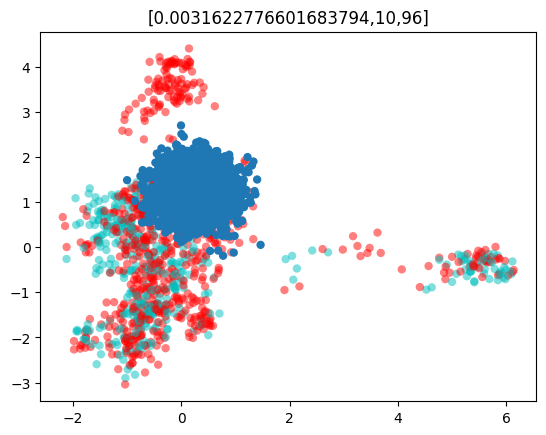



 -------------------------------------------- 

 [0.0031622776601683794,10,1000]
[BernoulliRBM] Iteration 1, pseudo-likelihood = -355.46, time = 6.70s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -415.04, time = 8.22s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -378.60, time = 10.21s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -326.78, time = 16.70s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -315.28, time = 15.15s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -301.49, time = 8.32s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -305.21, time = 8.38s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -305.70, time = 6.91s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -315.18, time = 8.13s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -312.93, time = 6.99s
[BernoulliRBM] Iteration 11, pseudo-likelihood = -310.87, time = 8.13s
[BernoulliRBM] Iteration 12, pseudo-likelihood = -316.43, time = 8.19s
[BernoulliRBM] Iteration 13, pseudo-likelihood = -311.91, time = 7.26s


<ipython-input-165-8f000fc6c5c6>:22: RuntimeWarning: invalid value encountered in divide
  R=np.delete((L-1)/L+B/W/L,drop)


At iterations:  1500  The mean Gelman-Rubin statistics is  1.0000581982108092 Maximum is  1.0113392369996763 Dropped:  20


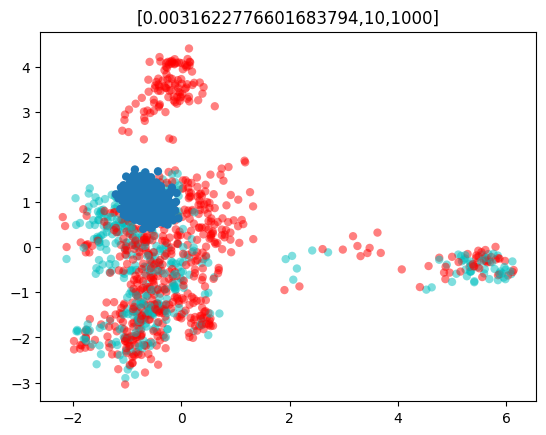



 -------------------------------------------- 

 [0.0031622776601683794,10,6000]
[BernoulliRBM] Iteration 1, pseudo-likelihood = -434.39, time = 38.50s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -417.65, time = 40.48s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -431.27, time = 42.54s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -438.05, time = 42.25s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -426.67, time = 40.83s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -423.28, time = 40.91s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -408.37, time = 42.41s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -417.48, time = 41.00s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -413.48, time = 40.98s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -400.87, time = 41.08s
[BernoulliRBM] Iteration 11, pseudo-likelihood = -417.45, time = 43.18s
[BernoulliRBM] Iteration 12, pseudo-likelihood = -412.78, time = 41.69s
[BernoulliRBM] Iteration 13, pseudo-likelihood = -401.27, time

KeyboardInterrupt: 

In [ ]:
rbm = BernoulliRBM(random_state=0, verbose=True)
rbm.n_iter = 50
chains=8

for learning_rate in np.logspace(-3,-1,5)[1:-1]:
  rbm.learning_rate = learning_rate
  for batch_size in [10,50]:
    rbm.batch_size = batch_size
    for n_components in [96,1000,6000]:
      print(f'\n\n -------------------------------------------- \n\n [{learning_rate},{batch_size},{n_components}]')
      rbm.n_components = n_components
      rbm.fit(X1)
      initial=X1[np.random.choice(range(len(X1)),chains,replace=False)]

      Sample2=MCMC_step(initial, 1500, 200, 2000, chains, rbm)

      Sample2 = one_hot_to_one_hot(Sample2)
      Xprojsample=pca.transform(Sample2)
      plt.scatter(Xproj[:, 0], Xproj[:, 1], c=Y, edgecolor='none', alpha=0.5,
            cmap=colors)
      plt.scatter(Xprojsample[:, 0], Xprojsample[:, 1], edgecolor='none', alpha=1)
      plt.title(f'[{learning_rate},{batch_size},{n_components}]')
      plt.show()


[BernoulliRBM] Iteration 1, pseudo-likelihood = -794.72, time = 1.00s
[BernoulliRBM] Iteration 2, pseudo-likelihood = -511.05, time = 0.98s
[BernoulliRBM] Iteration 3, pseudo-likelihood = -365.45, time = 1.02s
[BernoulliRBM] Iteration 4, pseudo-likelihood = -573.64, time = 1.05s
[BernoulliRBM] Iteration 5, pseudo-likelihood = -398.34, time = 0.98s
[BernoulliRBM] Iteration 6, pseudo-likelihood = -318.06, time = 0.99s
[BernoulliRBM] Iteration 7, pseudo-likelihood = -597.63, time = 1.62s
[BernoulliRBM] Iteration 8, pseudo-likelihood = -339.42, time = 1.52s
[BernoulliRBM] Iteration 9, pseudo-likelihood = -265.38, time = 1.08s
[BernoulliRBM] Iteration 10, pseudo-likelihood = -271.29, time = 1.00s


<ipython-input-242-8f000fc6c5c6>:22: RuntimeWarning: invalid value encountered in divide
  R=np.delete((L-1)/L+B/W/L,drop)


At iterations:  1500  The mean Gelman-Rubin statistics is  0.9999980152593294 Maximum is  1.011719731628645 Dropped:  10


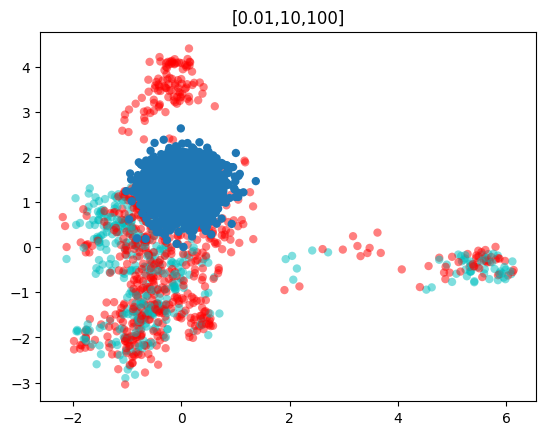

In [ ]:
rbm = BernoulliRBM(verbose=True)
rbm.learning_rate = 0.01
rbm.batch_size = 10
rbm.n_components = 100

rbm.fit(X1)
initial=X1[np.random.choice(range(len(X1)),chains,replace=False)]

chains=8
Sample2=MCMC_step(initial, 1500, 200, 2000, chains, rbm)

Sample2 = one_hot_to_one_hot(Sample2)
Xprojsample=pca.transform(Sample2)
plt.scatter(Xproj[:, 0], Xproj[:, 1], c=Y, edgecolor='none', alpha=0.5,
      cmap=colors)
plt.scatter(Xprojsample[:, 0], Xprojsample[:, 1], edgecolor='none', alpha=1)
plt.title(f'[{rbm.learning_rate},{rbm.batch_size},{rbm.n_components}]')
plt.show()

Th following part is just to visualize the first jumps from different initializations in the dataset. It is *not* a Monte Carlo simulation (that was given before)

In [ ]:
#A first way to sample: I sample the hidden variables from data, then sample visible from them
sample_len=400
hidden=rbm._sample_hiddens(X1[np.random.choice(range(len(X1)))],np.random)
for i in range(sample_len-1):
  hidden=np.vstack([hidden,rbm._sample_hiddens(X1[np.random.choice(range(len(X1)))],np.random)])

In [ ]:
Sample=rbm._sample_visibles(hidden,np.random)
Sample=Sample.astype(int)

In [ ]:
#A second way of sampling: I do Gibbs sampling from points in the datasets (looking at the code this is definitely the same)
Sample2 = rbm.gibbs(X1[np.random.choice(range(len(X1)),400,replace=False)])


In [ ]:
pca = PCA()
pca.fit(X)
Xproj0=pca.transform(X1)
Xprojsample=pca.transform(Sample2)
plt.scatter(Xproj0[:, 0], Xproj0[:, 1], c=Y, edgecolor='none', alpha=0.5,
            cmap=colors)

plt.scatter(Xprojsample[:, 0], Xprojsample[:, 1], edgecolor='none', alpha=1)



ValueError: X has 2016 features, but PCA is expecting 1920 features as input.

#References


[1] Tenenbaum, J.B.; De Silva, V.; & Langford, J.C. A global geometric framework for nonlinear dimensionality reduction. Science 290 (5500)

[2] Aldo Glielmo, Claudio Zeni, Bingqing Cheng, Gábor Csányi, Alessandro Laio, Ranking the information content of distance measures, PNAS Nexus, Volume 1, Issue 2, May 2022, pgac039, https://doi.org/10.1093/pnasnexus/pgac039

[3] Christopher Tralie, Nathaniel Saul and Rann Bar-On, Ripser.py: A Lean Persistent Homology Library for Python, The Journal of Open Source Software. Sep 2018

[4] Ester, M., Kriegel, H., Sander, J., & Xu, X. (1996). A density-based algorithm for discovering clusters in large spatial Databases with Noise. Knowledge Discovery and Data Mining, 226–231. https://www.aaai.org/Papers/KDD/1996/KDD96-037.pdf

[5] Schubert, Erich, et al. “DBSCAN Revisited, revisited.” ACM Transactions on Database Systems, vol. 42, no. 3, 2017, pp. 1–21, https://doi.org/10.1145/3068335.

[6] https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc_crossval.html#sphx-glr-auto-examples-model-selection-plot-roc-crossval-py

[7] Prechelt, Lutz ,2000/03/04, "Early Stopping - But When?"

[8] https://bookdown.org/rdpeng/advstatcomp/monitoring-convergence.html